## In this Notebook we compare different techniques.
As a comparison metric we will use PR curve, and ROC curve is also implemented.
The curve metric are computed for each fold of the cross validation, and the average curve is considered at the end.

In [1]:
from buildDataset import *
%matplotlib inline
import random

from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,ConfusionMatrixDisplay,f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
root_path =      DATAPATHS["preprocessed"]
from sklearn.model_selection import KFold


C:\Users\line\Desktop\Mauro\2_Preprocessing_Code\amd\prl\dataset.py:8: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology import selem


# Now we have our balanced - contribution dataset
each folder is containing the data of a given user, hence we can cross validate on a patient level =)
We can now compare different models, with different normalizations, and try to increase the context

In [2]:
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
print(X.shape)
print(y.shape)
print(768*14*18)

(193536, 70)
(193536,)
193536


In [3]:
# Create a cv that specifies the folds of my dataset, basically to avoid shuffling
# Having 12 control patients, splits should be divisors of 12, eg: 2 fold, 3-fold, 4-fold, 6-fold, 12-fold
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import plot_precision_recall_curve

def score_model(model,X,y, params = None, cv=None,plotMatrix = None,plotROC = None,setTreshold = None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    #smoter = SMOTE(random_state=42)
    
    scores = []

    for train_fold_index, val_fold_index in cv.split(X, y):
        # Get the training data
        X_train_fold, y_train_fold = X[train_fold_index], y[train_fold_index]
        # Get the validation data
        X_val_fold, y_val_fold = X[val_fold_index], y[val_fold_index]

        # Upsample only the data in the training section
        #X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(X_train_fold,y_train_fold)
        X_train_fold_upsample, y_train_fold_upsample = upsample(X_train_fold,y_train_fold) 
        #X_train_fold_upsample, y_train_fold_upsample = X_train_fold,y_train_fold
        # Fit the model on the upsampled training data
        if params:
            model_obj = model(**params).fit(X_train_fold_upsample, y_train_fold_upsample)
        else:
            model_obj = model().fit(X_train_fold_upsample, y_train_fold_upsample)
        if(plotMatrix):
            # Display confusion matrix
            ConfusionMatrixDisplay.from_estimator(model_obj, X_val_fold, y_val_fold)
            plt.show()
        if(plotROC):
            yhat = model_obj.predict_proba(X_val_fold)
            # keep probabilities for the positive outcome only
            yhat = yhat[:, 1]
            # calculate roc curves
            fpr, tpr, thresholds = roc_curve(y_val_fold, yhat)
            # plot the roc curve for the model
            plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
            plt.plot(fpr, tpr, marker='.', label='model')
            # axis labels
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.legend()
            # show the plot
            plt.show()
            
            # Can do it manually by importing precision_recall_curve


            plot_precision_recall_curve(model_obj, X_val_fold, y_val_fold)
            plt.title("PR Curve");
            plt.show()
        if(setTreshold != None):
            predictions = (model_obj.predict_proba(X_val_fold)[:,1] >= setTreshold).astype(bool)
        # Score the model on the (non-upsampled) validation data
        else:
            predictions = model_obj.predict(X_val_fold)
        scores.append(recall_score(y_val_fold, predictions))
        scores.append(precision_score(y_val_fold, predictions))
        scores.append(accuracy_score(y_val_fold, predictions))
        scores.append(f1_score(y_val_fold, predictions))
    return np.array(scores)

In [4]:
# Create a cv that specifies the folds of my dataset, basically to avoid shuffling
# Having 12 control patients, splits should be divisors of 12, eg: 2 fold, 3-fold, 4-fold, 6-fold, 12-fold
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import auc

def score_model_ROC(model,X,y, params = None, cv=None,plotMatrix = None,plotROC = None,setTreshold = None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    #smoter = SMOTE(random_state=42)
    
    scores = []
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    fig, ax = plt.subplots(figsize=(6, 6))
    
    for fold, (train_fold_index, val_fold_index) in enumerate(cv.split(X, y)):
        # Get the training data
        X_train_fold, y_train_fold = X[train_fold_index], y[train_fold_index]
        # Get the validation data
        X_val_fold, y_val_fold = X[val_fold_index], y[val_fold_index]

        # Upsample only the data in the training section
        #X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(X_train_fold,y_train_fold)
        X_train_fold_upsample, y_train_fold_upsample = upsample(X_train_fold,y_train_fold) 
        #X_train_fold_upsample, y_train_fold_upsample = X_train_fold,y_train_fold
        # Fit the model on the upsampled training data
        if params:
            model_obj = model(**params).fit(X_train_fold_upsample, y_train_fold_upsample)
        else:
            model_obj = model().fit(X_train_fold_upsample, y_train_fold_upsample)
        if(plotMatrix):
            # Display confusion matrix
            ConfusionMatrixDisplay.from_estimator(model_obj, X_val_fold, y_val_fold)
            plt.show()
        if(plotROC):
            viz = RocCurveDisplay.from_estimator(
                model_obj,
                X_val_fold,
                y_val_fold,
                name=f"ROC fold {fold}",
                alpha=0.3,
                lw=1,
                ax=ax,
            )
            interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(viz.roc_auc)
            
        if(setTreshold != None):
            predictions = (model_obj.predict_proba(X_val_fold)[:,1] >= setTreshold).astype(bool)
        # Score the model on the (non-upsampled) validation data
        else:
            predictions = model_obj.predict(X_val_fold)
        scores.append(recall_score(y_val_fold, predictions))
        scores.append(precision_score(y_val_fold, predictions))
        scores.append(accuracy_score(y_val_fold, predictions))
        scores.append(f1_score(y_val_fold, predictions))

    ax.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="b",
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

    ax.set(
        xlim=[-0.05, 1.05],
        ylim=[-0.05, 1.05],
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
        title=f"Mean ROC curve with variability",
    )
    ax.axis("square")
    ax.legend(loc="lower right")
    plt.show()

    return np.array(scores)

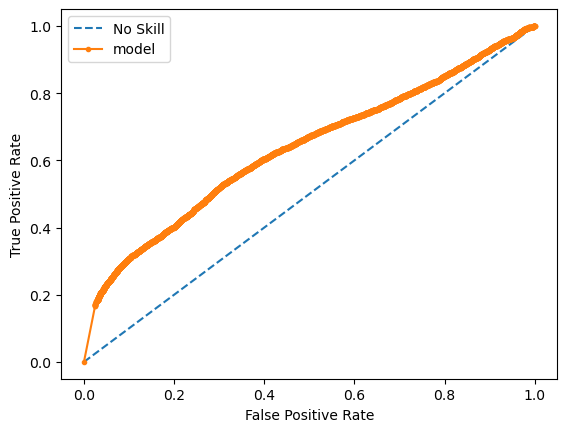

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


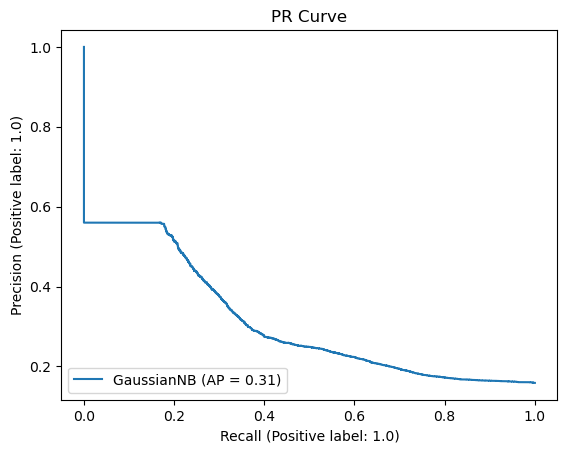

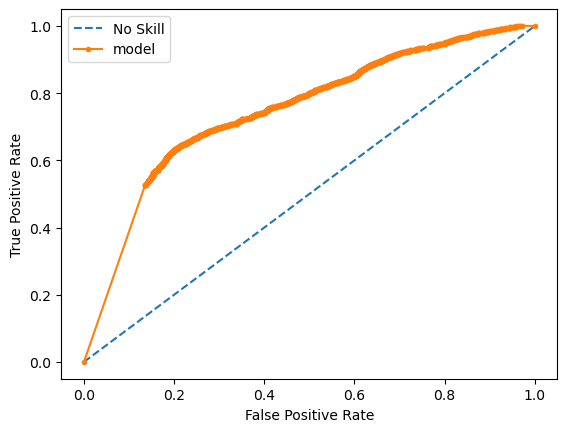

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


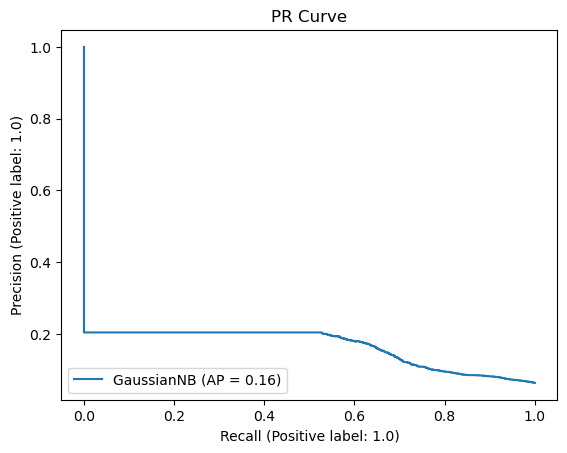

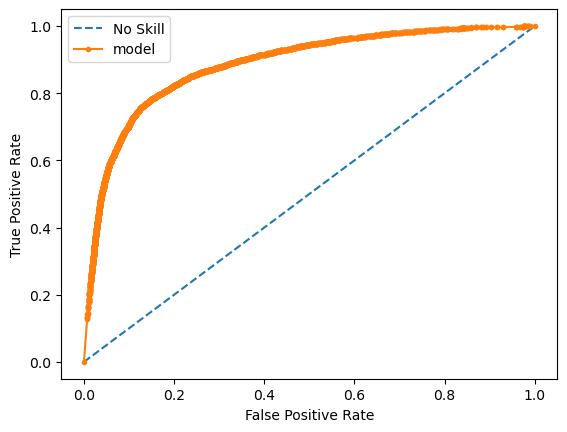

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


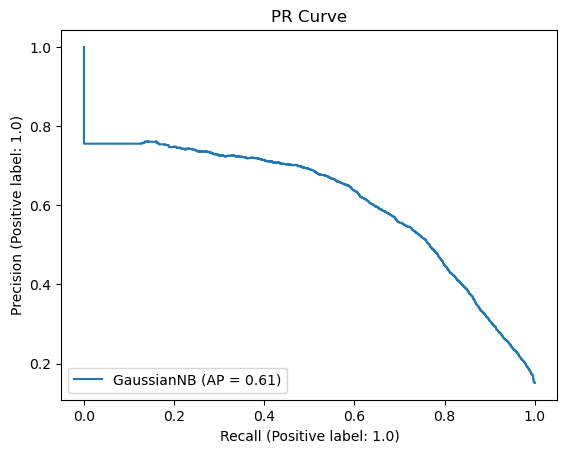

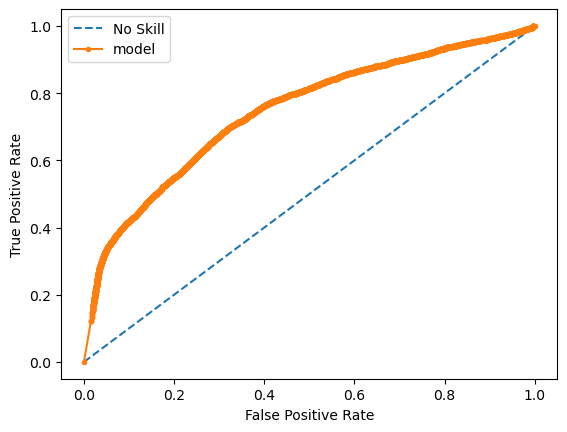

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


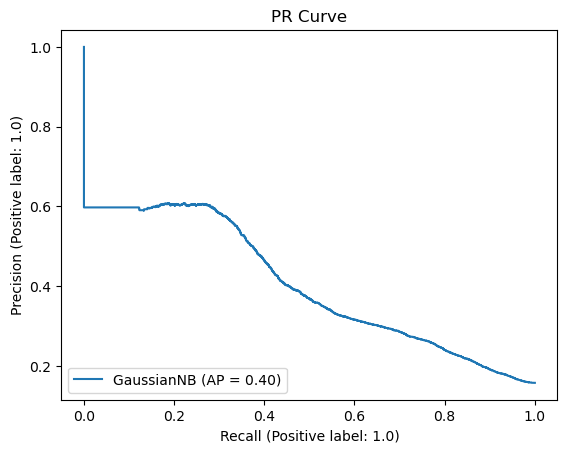

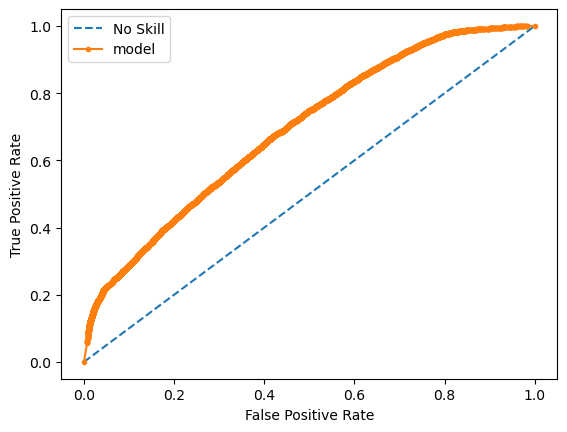

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


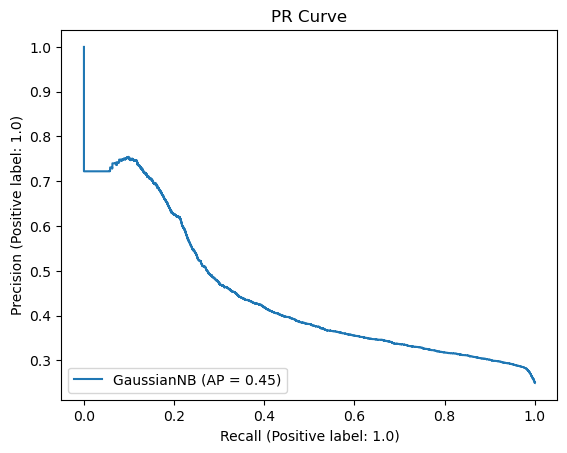

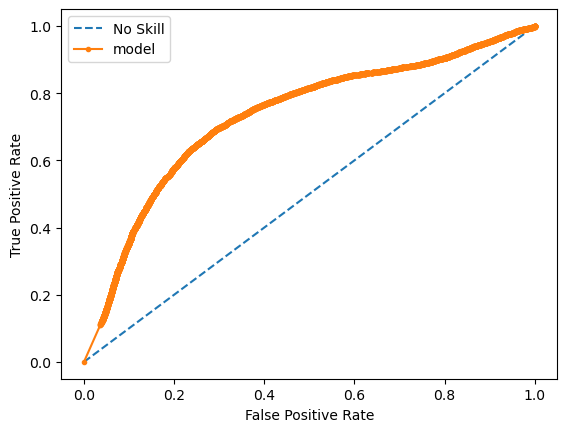

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


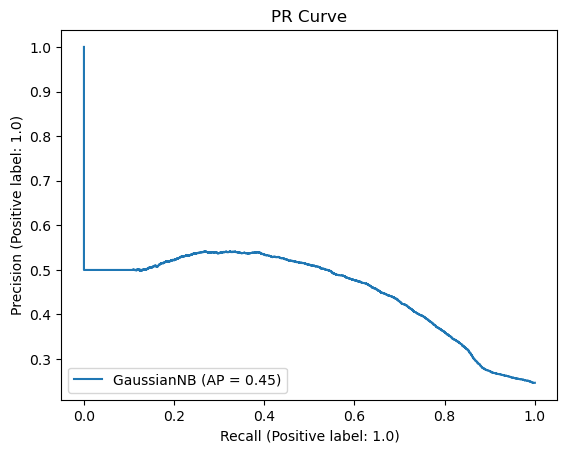

Here are the recall scores: [0.40066484 0.72336168 0.82298137 0.57557222 0.36577392 0.51539912]
Here are the precisions scores: [0.27385726 0.11892425 0.41939228 0.32411111 0.43359666 0.50761421]
Here are the accuracies scores: [0.73654514 0.65073165 0.80288938 0.74472966 0.72581845 0.75719246]
Here are the f1 scores: [0.32534138 0.20426614 0.55563321 0.41470003 0.39680808 0.51147705]


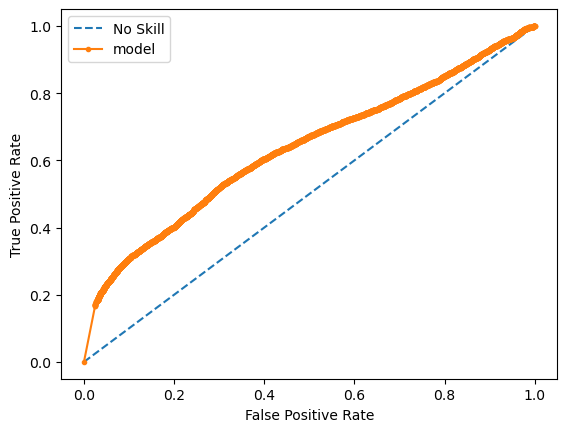

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


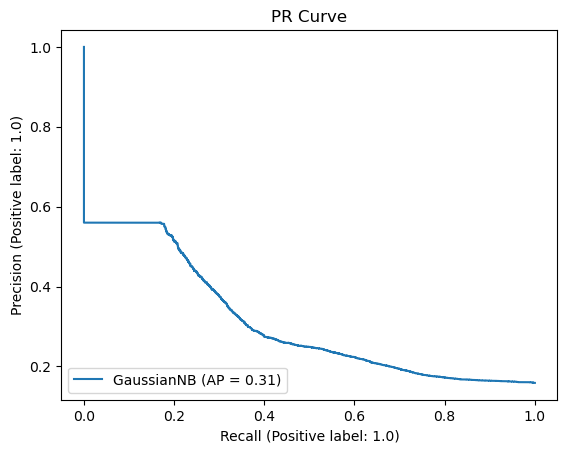

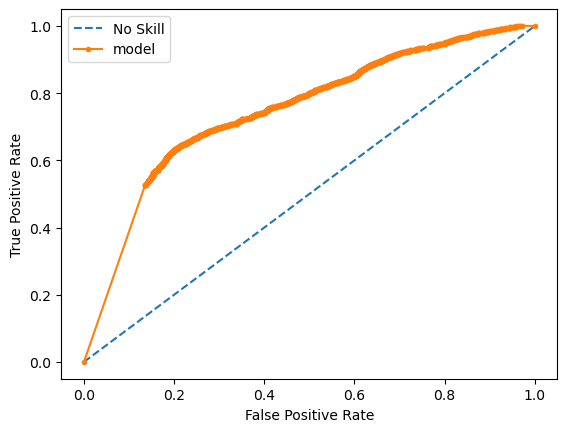

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


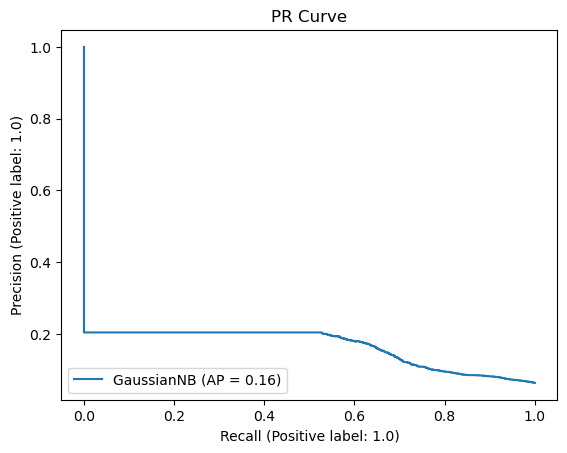

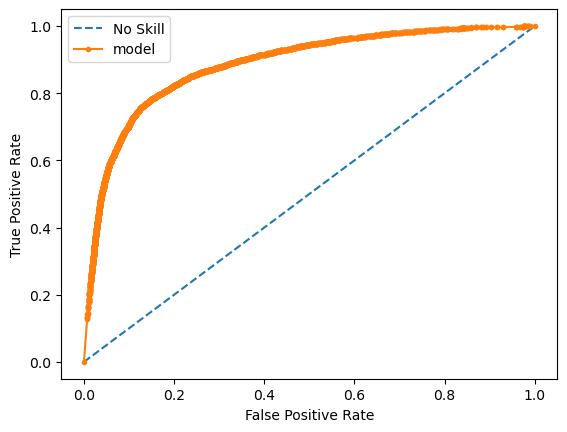

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


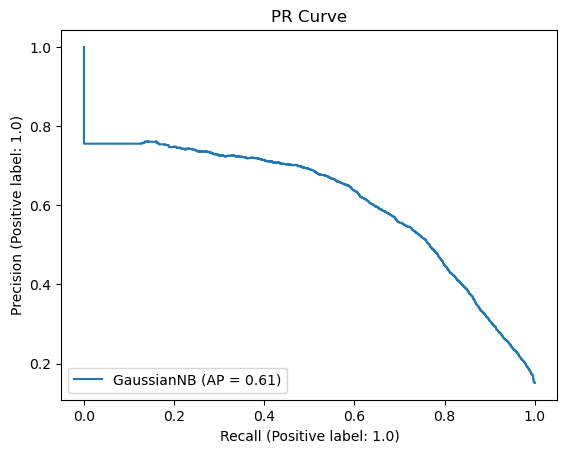

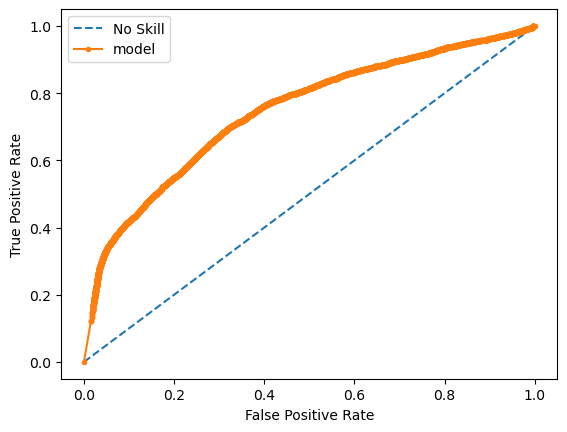

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


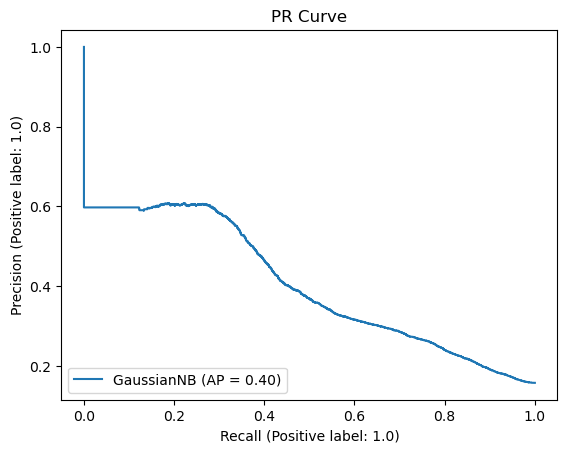

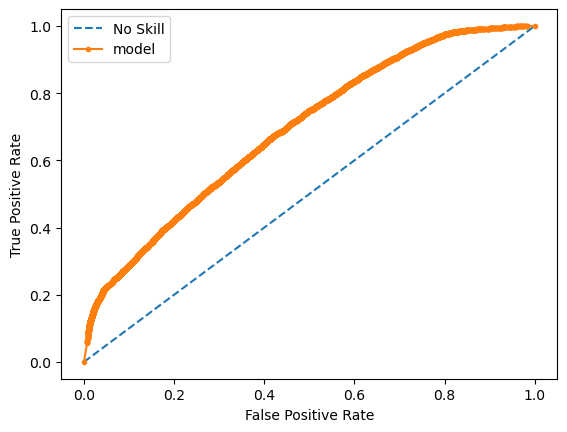

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


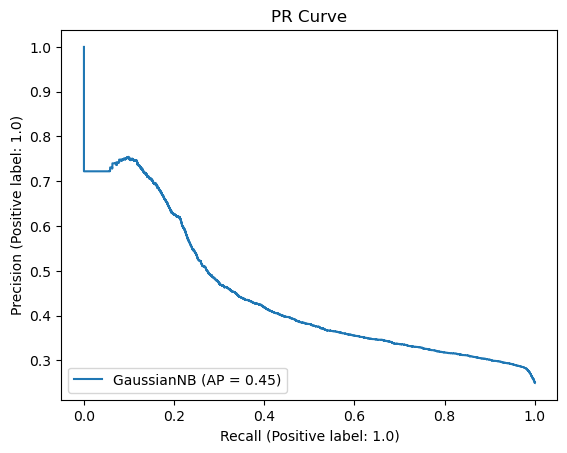

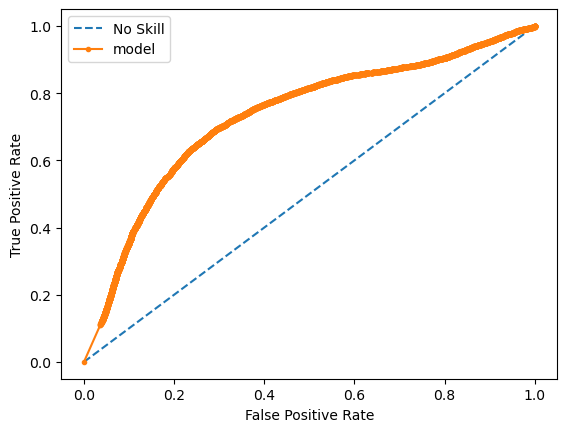

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


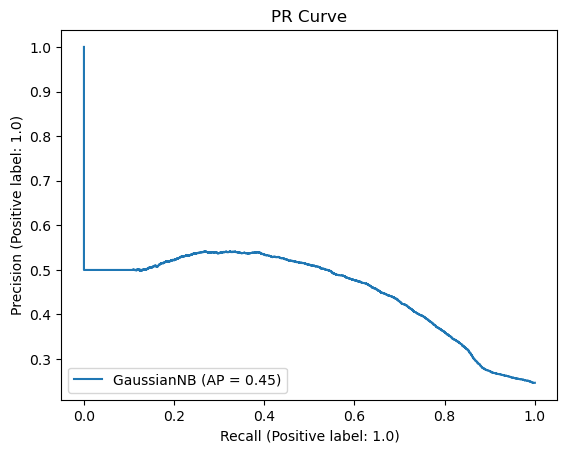

Here are the recall scores: [0.40066484 0.72336168 0.82298137 0.57557222 0.36577392 0.51539912]
Here are the precisions scores: [0.27385726 0.11892425 0.41939228 0.32411111 0.43359666 0.50761421]
Here are the accuracies scores: [0.73654514 0.65073165 0.80288938 0.74472966 0.72581845 0.75719246]
Here are the f1 scores: [0.32534138 0.20426614 0.55563321 0.41470003 0.39680808 0.51147705]


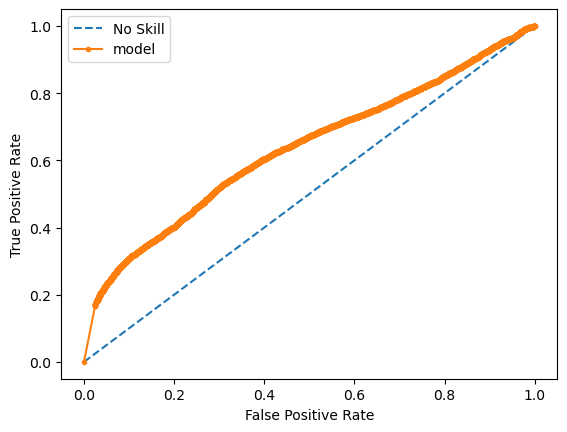

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


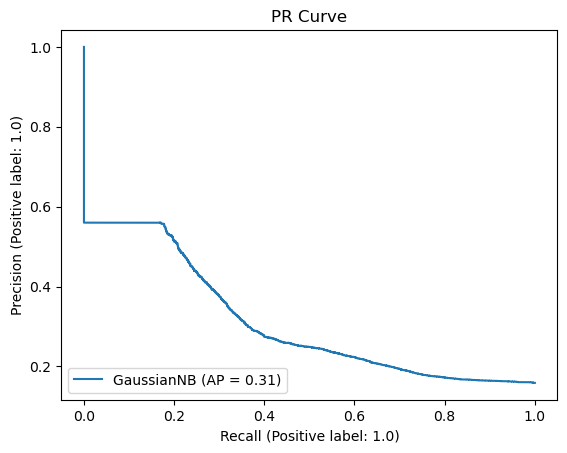

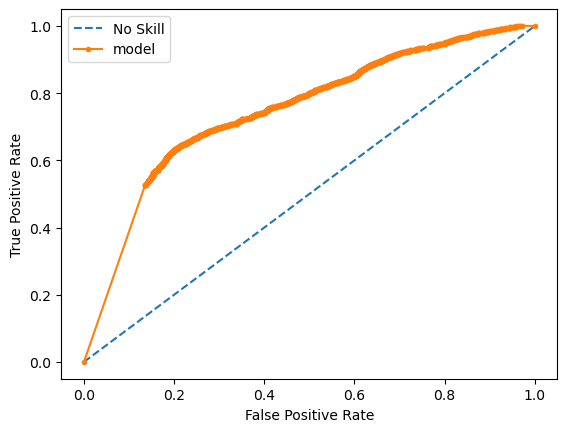

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


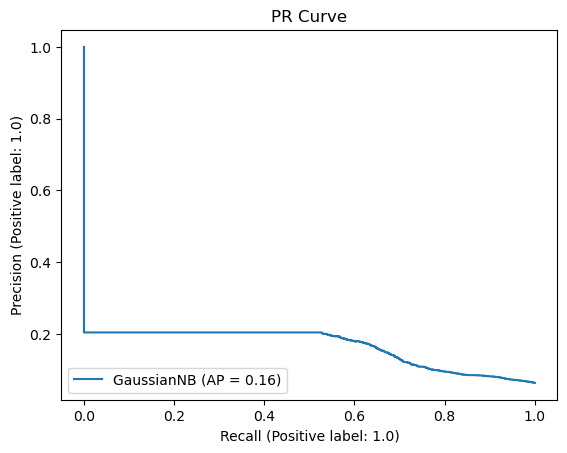

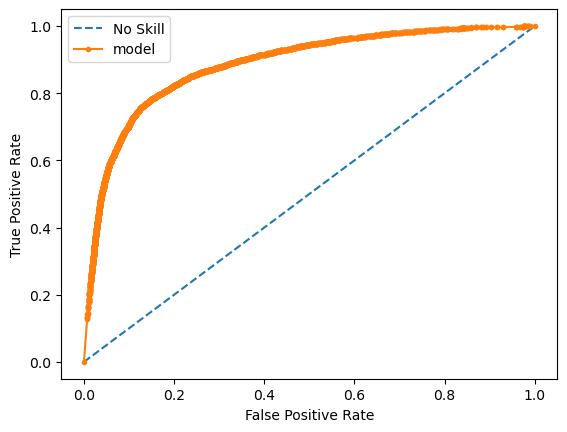

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


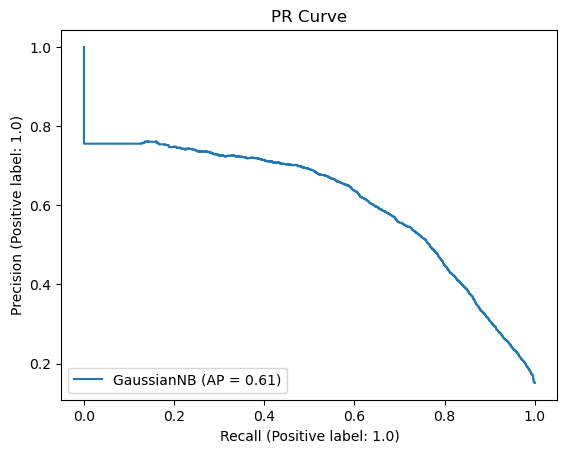

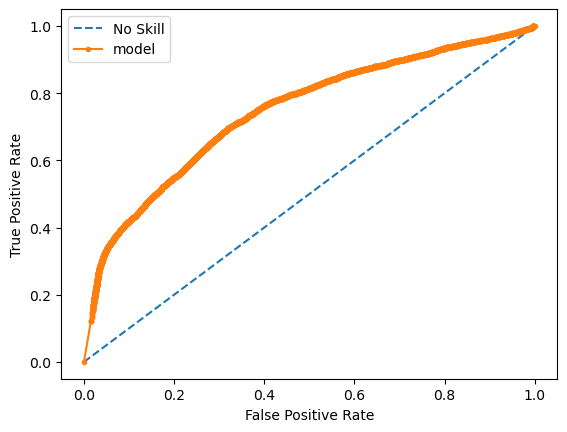

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


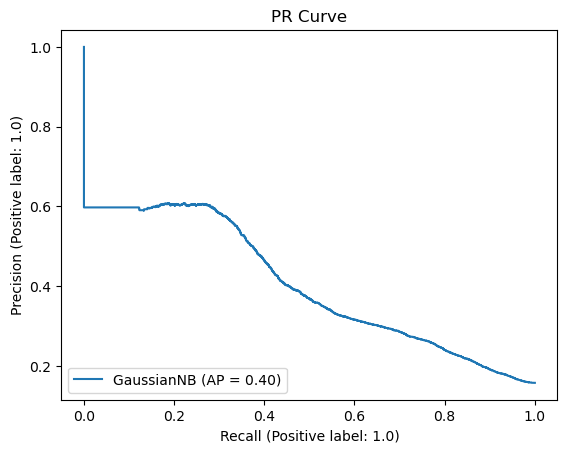

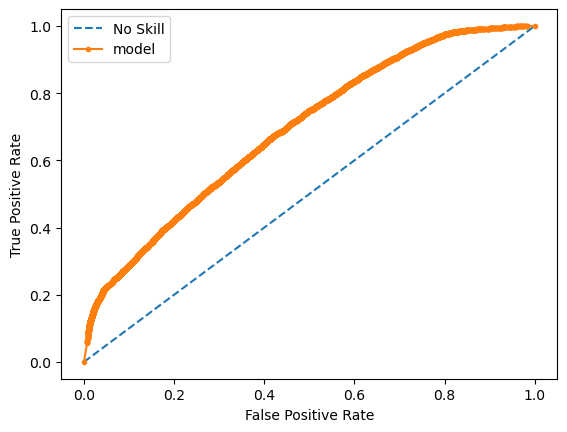

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


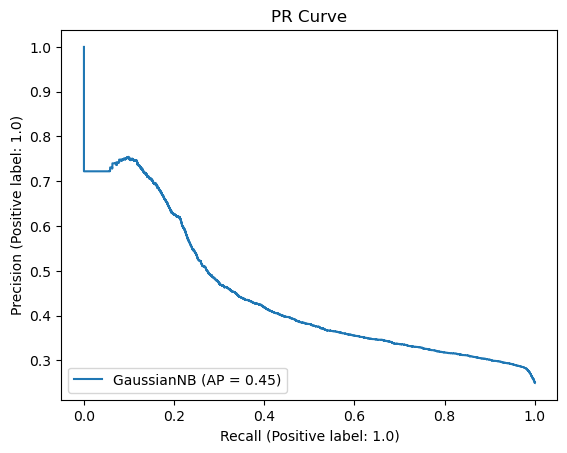

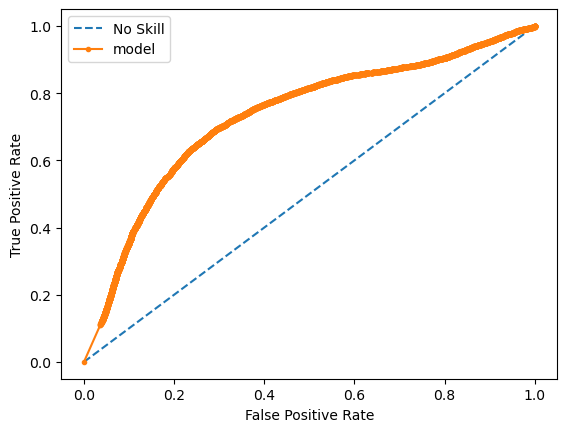

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


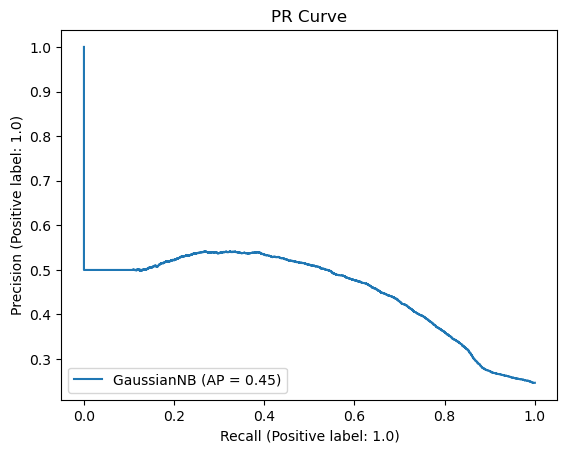

Here are the recall scores: [0.40066484 0.72336168 0.82298137 0.57557222 0.36577392 0.51539912]
Here are the precisions scores: [0.27385726 0.11892425 0.41939228 0.32411111 0.43359666 0.50761421]
Here are the accuracies scores: [0.73654514 0.65073165 0.80288938 0.74472966 0.72581845 0.75719246]
Here are the f1 scores: [0.32534138 0.20426614 0.55563321 0.41470003 0.39680808 0.51147705]


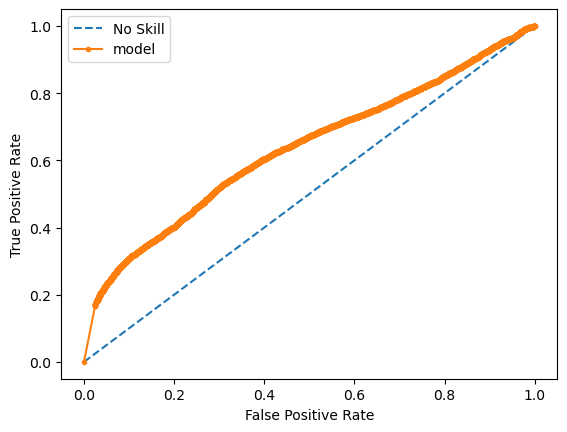

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


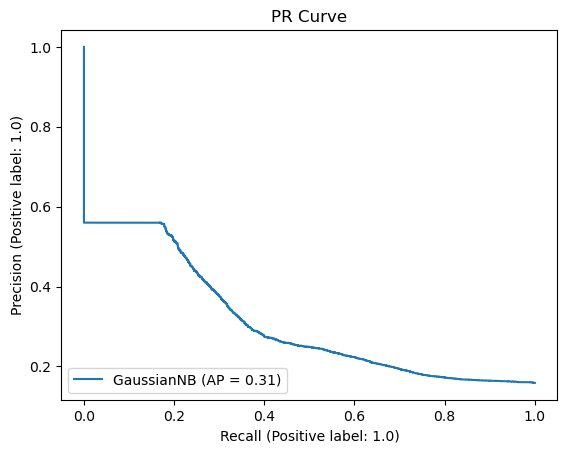

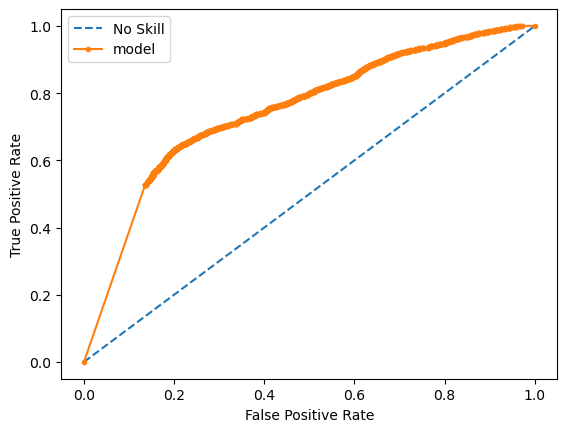

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


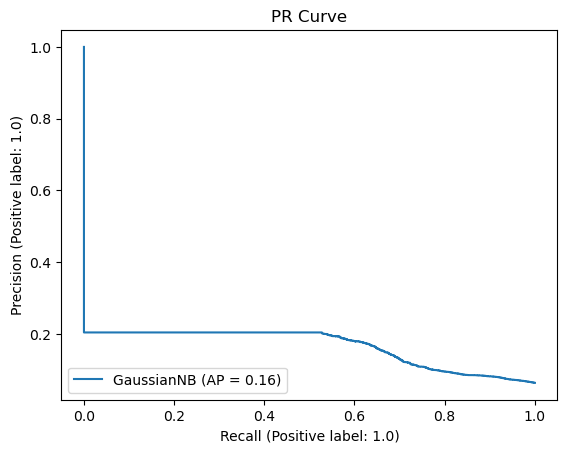

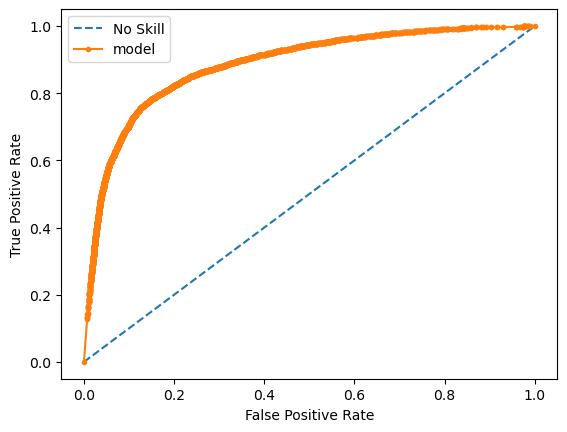

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


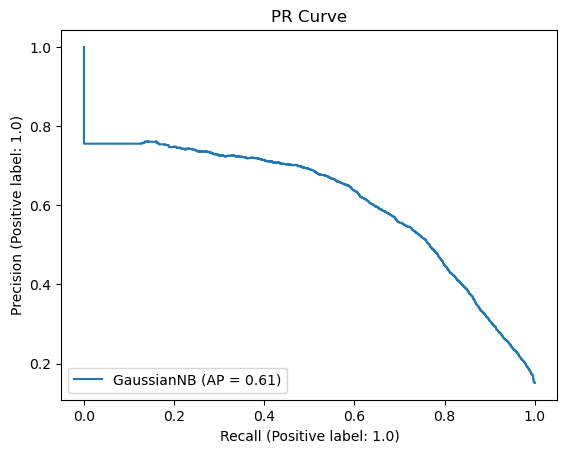

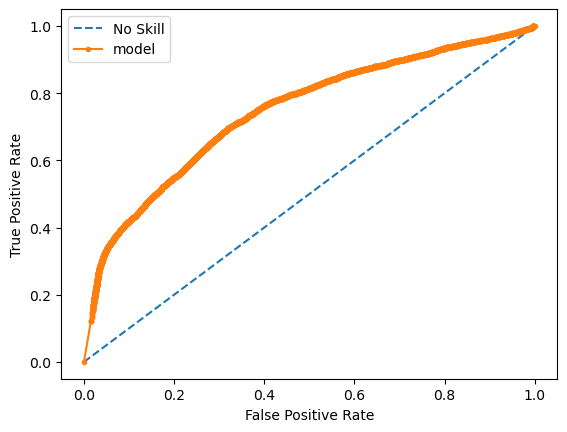

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


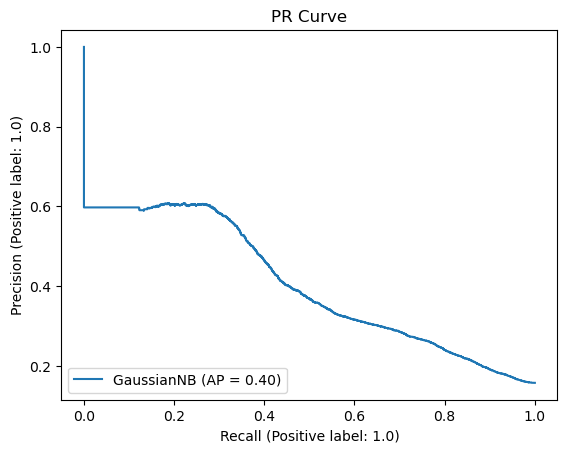

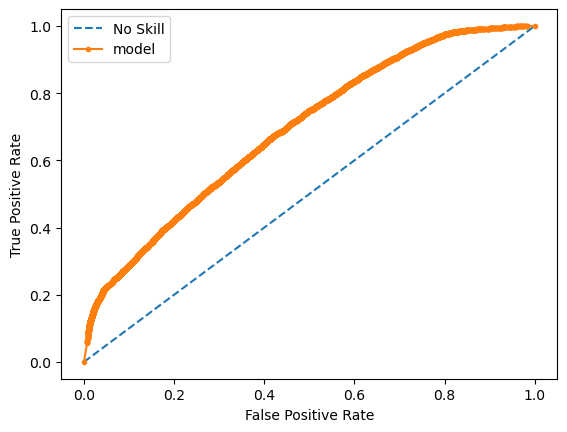

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


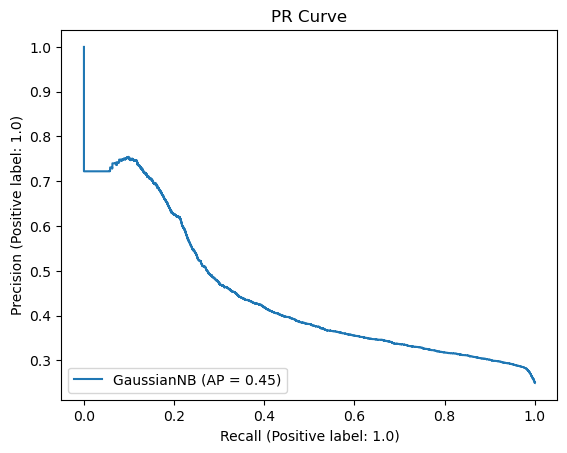

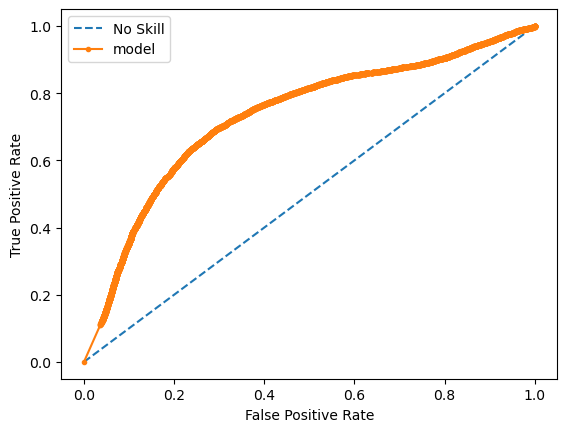

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


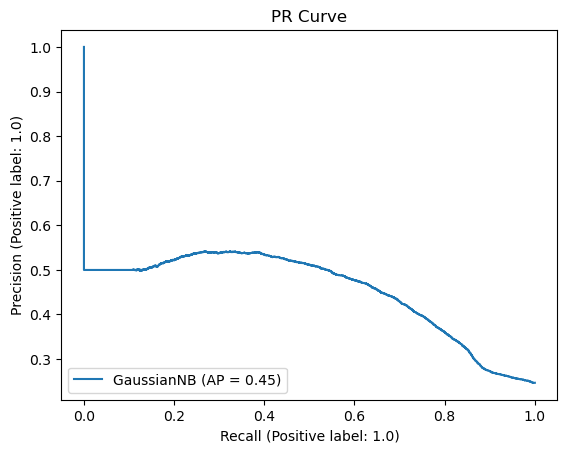

Here are the recall scores: [0.40066484 0.72336168 0.82298137 0.57557222 0.36577392 0.51539912]
Here are the precisions scores: [0.27385726 0.11892425 0.41939228 0.32411111 0.43359666 0.50761421]
Here are the accuracies scores: [0.73654514 0.65073165 0.80288938 0.74472966 0.72581845 0.75719246]
Here are the f1 scores: [0.32534138 0.20426614 0.55563321 0.41470003 0.39680808 0.51147705]


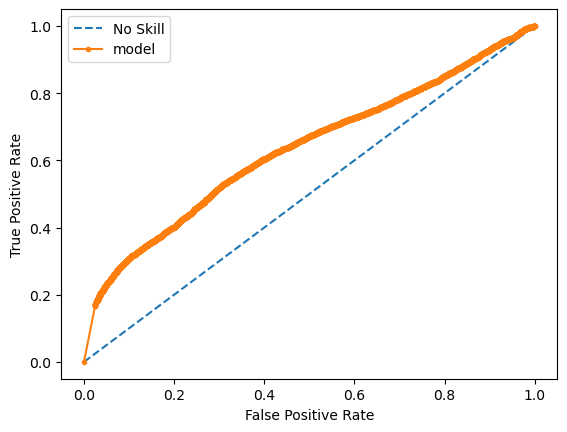

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


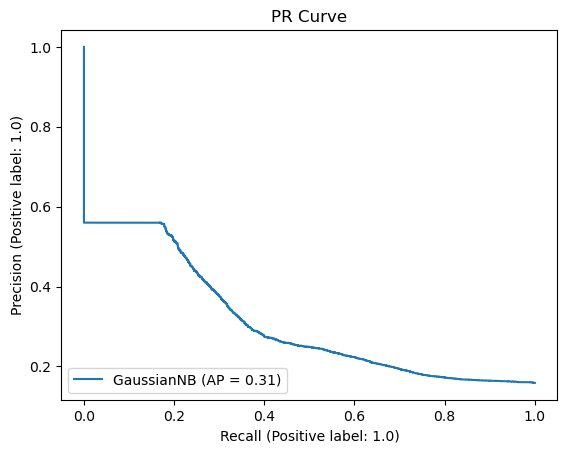

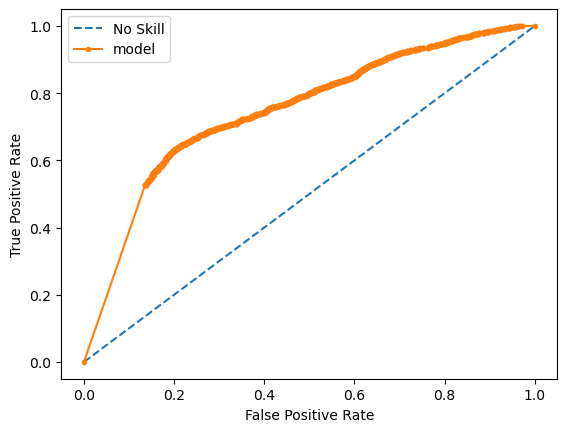

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


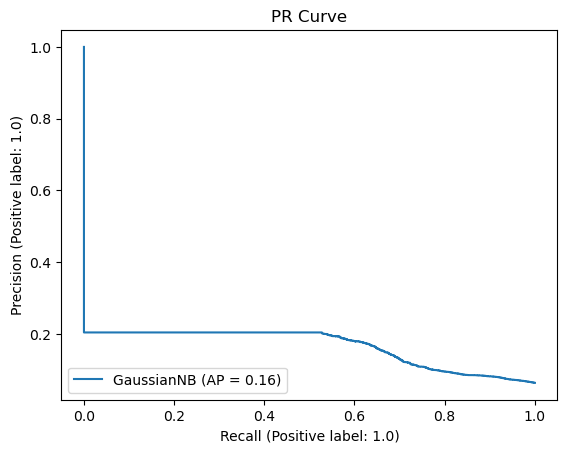

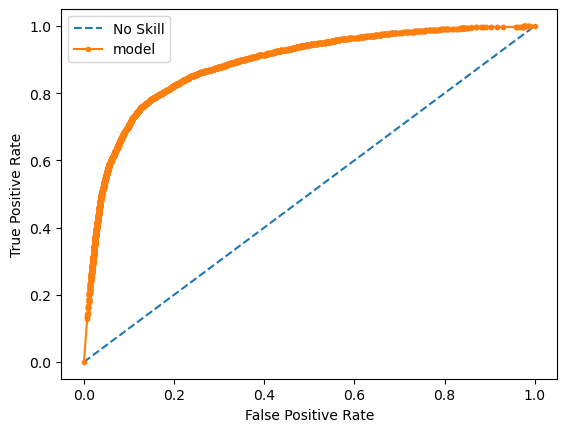

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


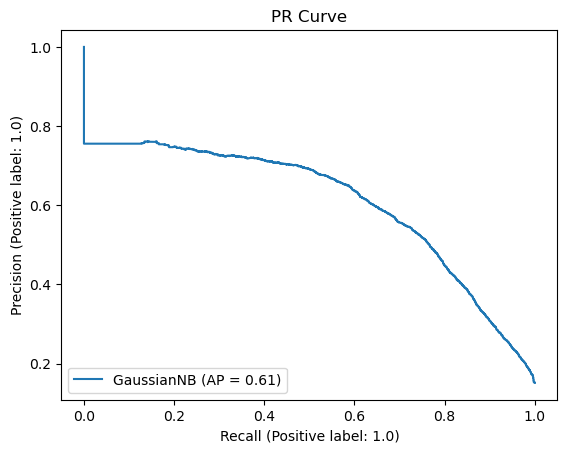

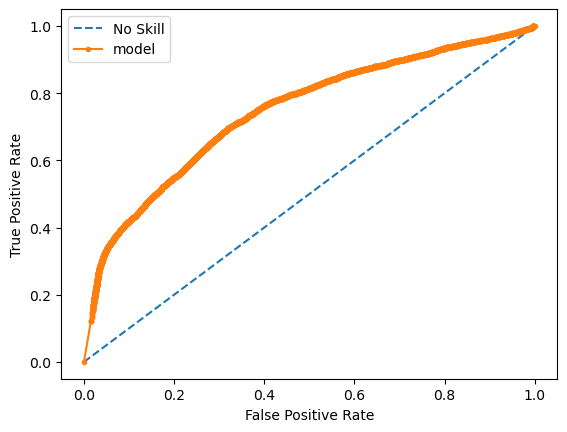

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


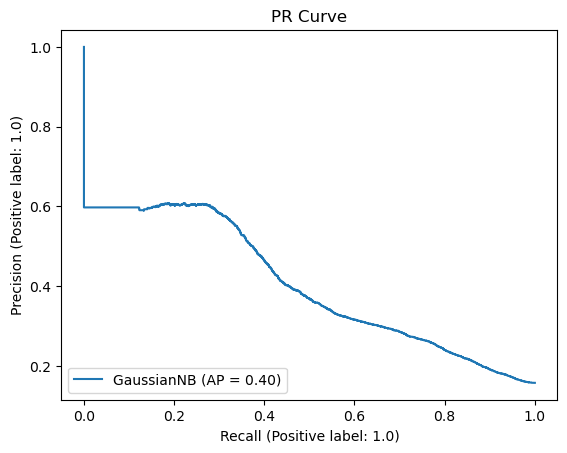

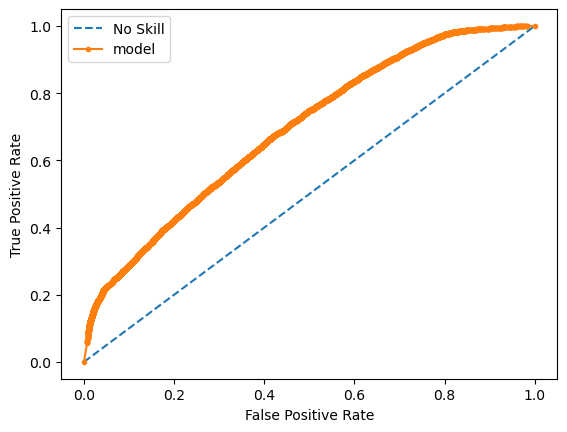

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


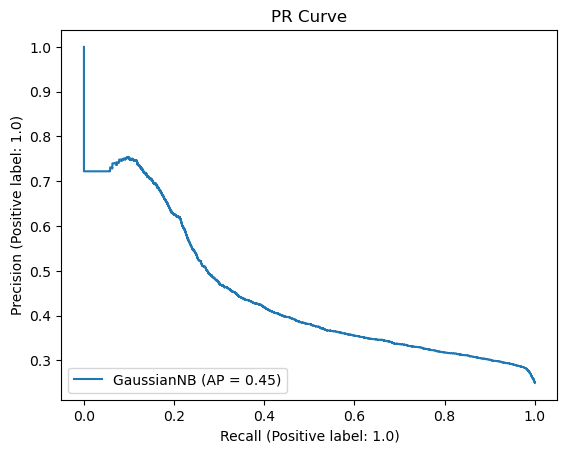

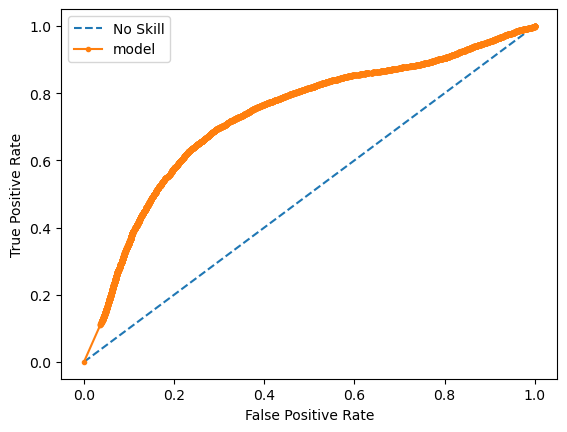

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


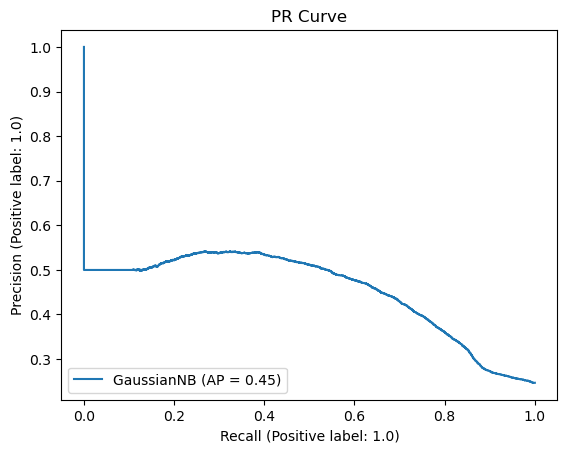

Here are the recall scores: [0.40066484 0.72336168 0.82298137 0.57557222 0.36577392 0.51539912]
Here are the precisions scores: [0.27385726 0.11892425 0.41939228 0.32411111 0.43359666 0.50761421]
Here are the accuracies scores: [0.73654514 0.65073165 0.80288938 0.74472966 0.72581845 0.75719246]
Here are the f1 scores: [0.32534138 0.20426614 0.55563321 0.41470003 0.39680808 0.51147705]


In [5]:
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
gridsearch = [1e-11,1e-10,1e-9,1e-8,1e-7]
for smooth in gridsearch:
    params = {
            'var_smoothing': smooth,
        }
    scores = score_model(GaussianNB,X,y,params = params, cv=kf,plotMatrix = False, plotROC = True)
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')

In [6]:
# Create a cv that specifies the folds of my dataset, basically to avoid shuffling
# Having 12 control patients, splits should be divisors of 12, eg: 2 fold, 3-fold, 4-fold, 6-fold, 12-fold
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import auc

def score_model_PR(model,X,y, params = None, cv=None,plotMatrix = None,plotROC = None,setTreshold = None,ax2 = None,modelname = '',label = None):
    """
    Creates folds manually, and upsamples within each fold.
    Returns an array of validation (recall) scores
    """
    #smoter = SMOTE(random_state=42)
    
    scores = []
    y_real = []
    y_proba = []
    
    mean_fpr = np.linspace(0, 1, 100)
    fig, ax = plt.subplots(figsize=(6, 6))
    
    for fold, (train_fold_index, val_fold_index) in enumerate(cv.split(X, y)):
        # Get the training data
        X_train_fold, y_train_fold = X[train_fold_index], y[train_fold_index]
        # Get the validation data
        X_val_fold, y_val_fold = X[val_fold_index], y[val_fold_index]

        # Upsample only the data in the training section
        X_train_fold_upsample, y_train_fold_upsample = upsample(X_train_fold,y_train_fold) 
        # Fit the model on the upsampled training data
        if params:
            model_obj = model(**params).fit(X_train_fold_upsample, y_train_fold_upsample)
        else:
            model_obj = model.fit(X_train_fold_upsample, y_train_fold_upsample)
        pred_proba = model_obj.predict_proba(X_val_fold)
        y_real.append(y_val_fold)
        preds = pred_proba[:,1]
        y_proba.append(preds)
        if(plotMatrix):
            # Display confusion matrix
            ConfusionMatrixDisplay.from_estimator(model_obj, X_val_fold, y_val_fold)
            plt.show()
        if(plotROC):
            viz = PrecisionRecallDisplay.from_predictions(
                y_val_fold,
                preds,
                name=f"PR fold {fold}",
                alpha=0.3,
                lw=1,
                ax=ax,
            )

        if(setTreshold != None):
            predictions = (model_obj.predict_proba(X_val_fold)[:,1] >= setTreshold).astype(bool)
        # Score the model on the (non-upsampled) validation data
        else:
            predictions = model_obj.predict(X_val_fold)
        scores.append(recall_score(y_val_fold, predictions))
        scores.append(precision_score(y_val_fold, predictions))
        scores.append(accuracy_score(y_val_fold, predictions))
        scores.append(f1_score(y_val_fold, predictions))
        
    y_real = np.concatenate(y_real)
    y_proba = np.concatenate(y_proba)
    if(plotROC):
        PrecisionRecallDisplay.from_predictions(
                    y_real,
                    y_proba,
                    name=f"PR AVG",
                    color="b",
                    lw=2,
                    alpha=0.8,
                    ax=ax,
                )
    if ax2:
        if label != None:
            PrecisionRecallDisplay.from_predictions(
                y_real,
                y_proba,
                name=f"{label}",
                lw=2,
                alpha=0.8,
                ax=ax2,
            )
        else:
            PrecisionRecallDisplay.from_predictions(
                y_real,
                y_proba,
                name=f"{str(list(params.items()))} {modelname}",
                lw=2,
                alpha=0.8,
                ax=ax2,
            )

    ax.set(
        xlim=[-0.05, 1.05],
        ylim=[-0.05, 1.05],
        xlabel="Precision",
        ylabel="Recall",
        title=f"Mean PR curve",
    )

    plt.show()

    return np.array(scores)

In [7]:
params = {
            'var_smoothing': smooth,
        }
list(params.items())

[('var_smoothing', 1e-07)]

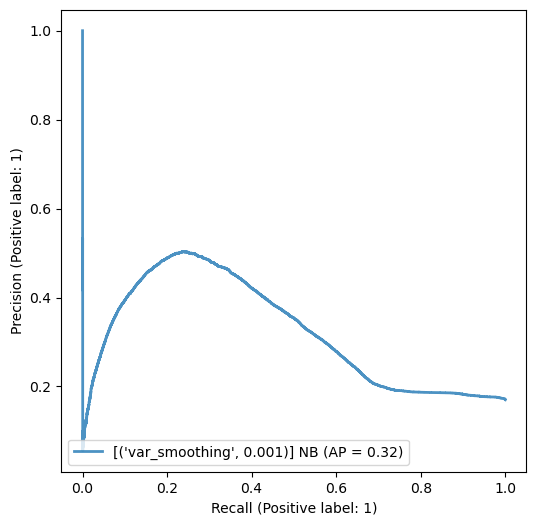

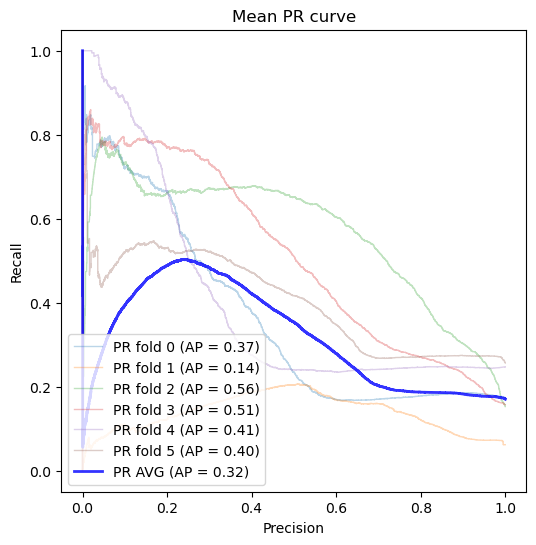

Here are the recall scores: [0.3572546  0.71035518 0.81283644 0.65489345 0.28542688 0.45053426]
Here are the precisions scores: [0.43293839 0.15894336 0.39107481 0.3474665  0.4462355  0.44089064]
Here are the accuracies scores: [0.82390873 0.74910094 0.78245908 0.75254216 0.73648313 0.72358631]
Here are the f1 scores: [0.39147204 0.25976402 0.52807855 0.45403557 0.34815951 0.44566028]


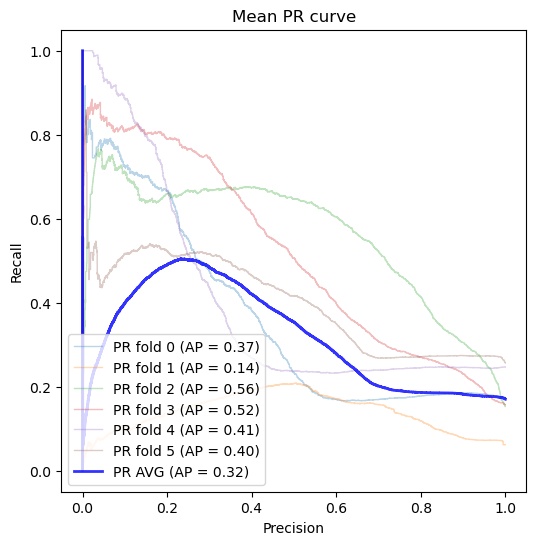

Here are the recall scores: [0.35510364 0.69584792 0.81014493 0.65134175 0.28454671 0.44374607]
Here are the precisions scores: [0.43476179 0.15801431 0.39433639 0.34868491 0.45505731 0.44158119]
Here are the accuracies scores: [0.82455977 0.75136409 0.78524926 0.75406126 0.73958333 0.72442336]
Here are the f1 scores: [0.39091594 0.2575449  0.53046838 0.45421397 0.35014699 0.44266098]


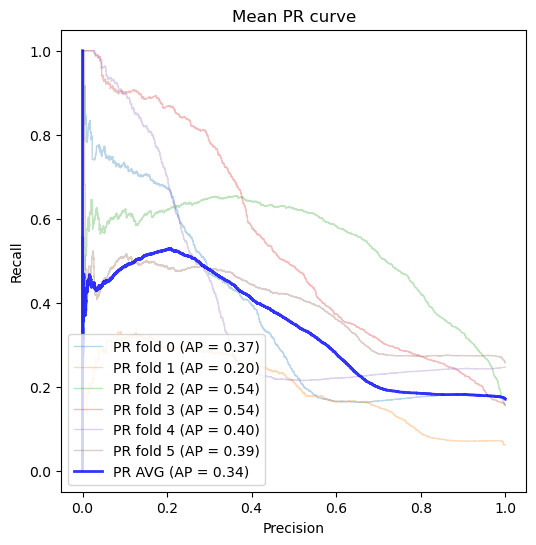

Here are the recall scores: [0.33965585 0.66383192 0.80020704 0.61227309 0.28014586 0.37360151]
Here are the precisions scores: [0.44733454 0.16328288 0.42268154 0.36211927 0.48977797 0.45638821]
Here are the accuracies scores: [0.82877604 0.76835317 0.80642361 0.76962426 0.75055804 0.73577009]
Here are the f1 scores: [0.38612871 0.26209757 0.55317017 0.45508543 0.35642297 0.41086611]


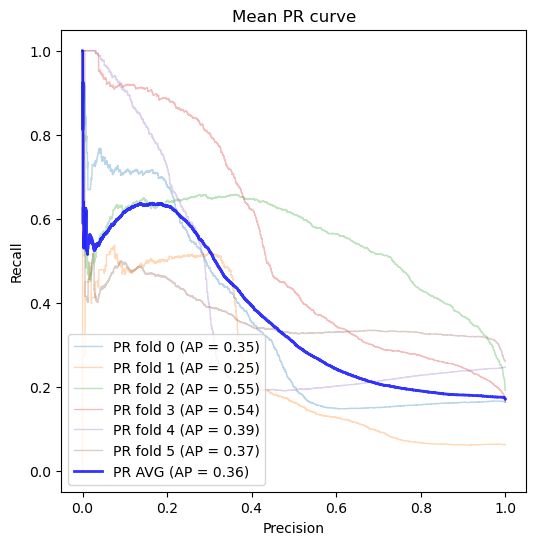

Here are the recall scores: [0.30269847 0.46223112 0.73291925 0.50434096 0.24154407 0.20804525]
Here are the precisions scores: [0.47718866 0.17769231 0.50134542 0.42261905 0.61867955 0.45243302]
Here are the accuracies scores: [0.83686756 0.83410838 0.85084945 0.81386409 0.77628968 0.74259053]
Here are the f1 scores: [0.37042355 0.25670232 0.59540829 0.45987765 0.34744077 0.2850254 ]


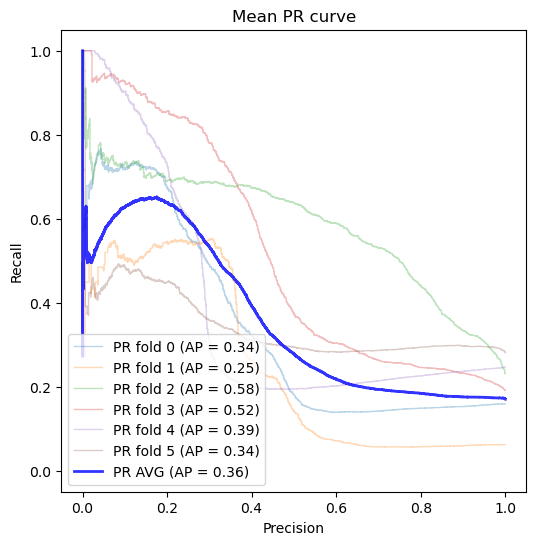

Here are the recall scores: [0.29018381 0.42771386 0.67598344 0.43725335 0.2211744  0.17724701]
Here are the precisions scores: [0.50579414 0.2315818  0.54065243 0.51451126 0.64955687 0.45323047]
Here are the accuracies scores: [0.84250992 0.8765811  0.86548239 0.84675719 0.77855283 0.74435764]
Here are the f1 scores: [0.36878728 0.30047443 0.60079124 0.47274667 0.32998781 0.25483463]


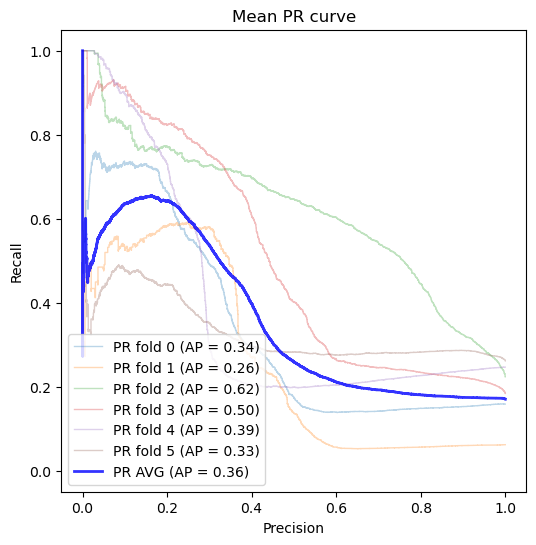

Here are the recall scores: [0.28197106 0.4132066  0.64741201 0.42166535 0.21513894 0.16756757]
Here are the precisions scores: [0.52284264 0.24947146 0.57471053 0.5403287  0.66966732 0.4523244 ]
Here are the accuracies scores: [0.8453621  0.88659474 0.87546503 0.85277158 0.78031994 0.74466766]
Here are the f1 scores: [0.36636179 0.31111111 0.60889884 0.47367838 0.32565664 0.24454229]


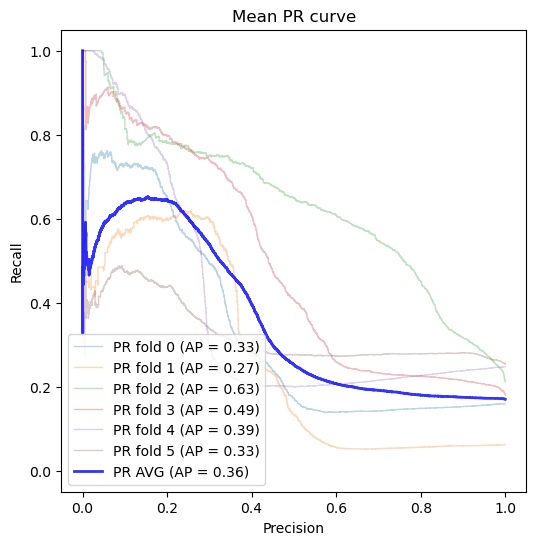

Here are the recall scores: [0.27356277 0.4102051  0.63167702 0.41456196 0.21199547 0.16329353]
Here are the precisions scores: [0.52475619 0.26181354 0.59024956 0.55420733 0.67874396 0.45387841]
Here are the accuracies scores: [0.84554812 0.89177207 0.87918527 0.85562376 0.78097098 0.74519469]
Here are the f1 scores: [0.3596401  0.3196258  0.61026103 0.4743199  0.32308135 0.2401775 ]


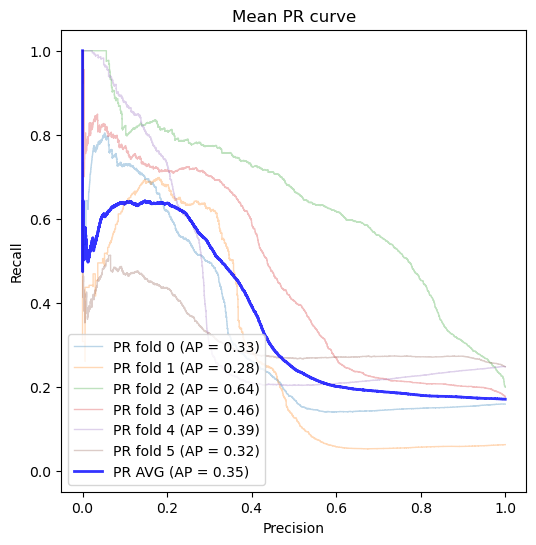

Here are the recall scores: [0.26007039 0.40270135 0.59751553 0.40272297 0.20709166 0.15512256]
Here are the precisions scores: [0.53221289 0.27912621 0.6183844  0.58032414 0.69876962 0.45102339]
Here are the accuracies scores: [0.84644717 0.89853051 0.88451761 0.86039807 0.78249008 0.74507068]
Here are the f1 scores: [0.34940234 0.32971534 0.60777088 0.47548049 0.31949564 0.23084838]


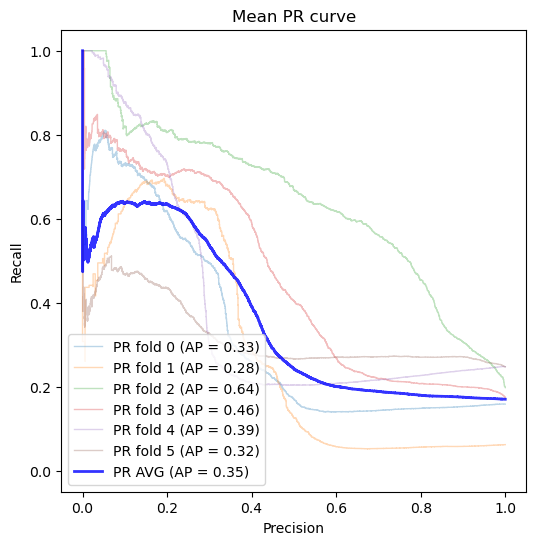

Here are the recall scores: [0.2587016  0.40270135 0.59130435 0.40094712 0.20671445 0.15474544]
Here are the precisions scores: [0.5328232  0.2831516  0.62100457 0.58357266 0.70136519 0.45174312]
Here are the accuracies scores: [0.84650918 0.89980159 0.88476562 0.8609251  0.78270709 0.74522569]
Here are the f1 scores: [0.34829538 0.33250723 0.60579065 0.47532164 0.31931631 0.23052434]


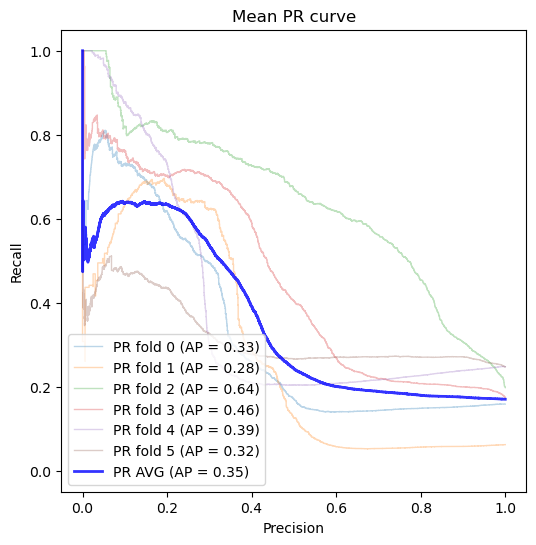

Here are the recall scores: [0.2587016  0.40270135 0.59068323 0.40094712 0.20671445 0.15449403]
Here are the precisions scores: [0.5328232  0.28355055 0.62102743 0.5837403  0.70136519 0.45150625]
Here are the accuracies scores: [0.84650918 0.8999256  0.88473462 0.8609561  0.78270709 0.74519469]
Here are the f1 scores: [0.34829538 0.33278214 0.60547538 0.47537724 0.31931631 0.23021448]


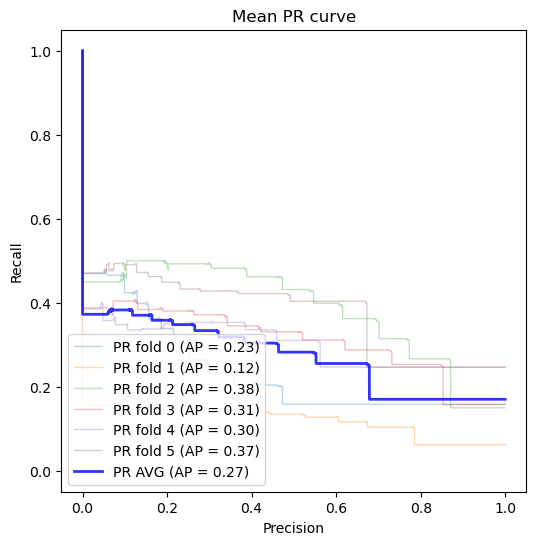

Here are the recall scores: [0.18615565 0.37668834 0.47267081 0.3421468  0.19200302 0.18780641]
Here are the precisions scores: [0.36060606 0.14598682 0.45769848 0.36505263 0.34107661 0.45013558]
Here are the accuracies scores: [0.81863839 0.82480779 0.83717758 0.8031374  0.7093254  0.74311756]
Here are the f1 scores: [0.24555068 0.21042336 0.46506417 0.35322876 0.2456959  0.26503459]


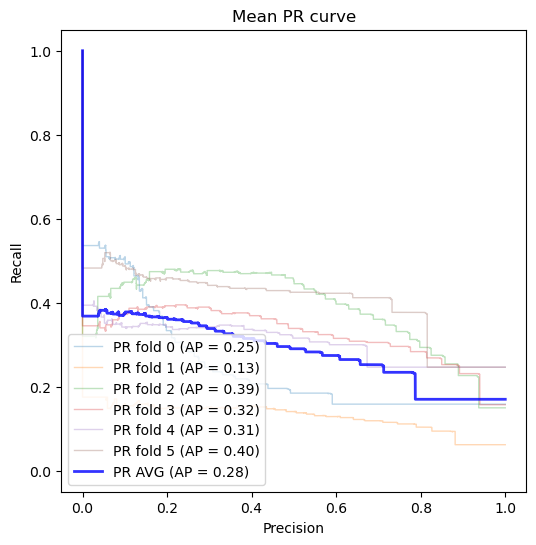

Here are the recall scores: [0.19084865 0.40870435 0.50041408 0.3601026  0.19753552 0.18416091]
Here are the precisions scores: [0.35988201 0.15423825 0.45093284 0.37389879 0.34611148 0.4510468 ]
Here are the accuracies scores: [0.81789435 0.82446677 0.83395337 0.8047185  0.71013145 0.74352059]
Here are the f1 scores: [0.24942499 0.22395833 0.47438665 0.36687104 0.25152097 0.26153709]


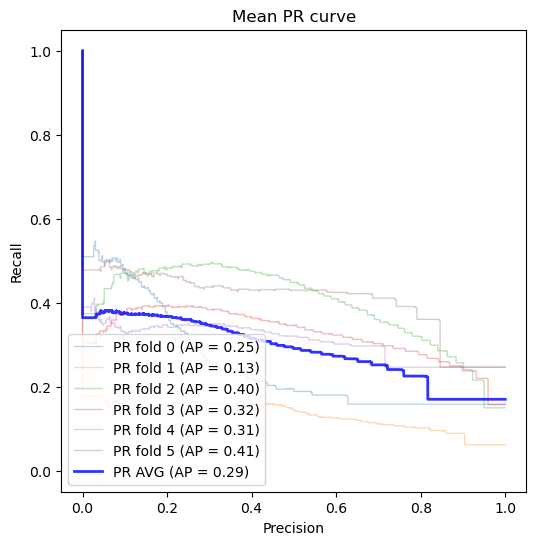

Here are the recall scores: [0.19964803 0.41070535 0.49151139 0.3660221  0.20181064 0.19333752]
Here are the precisions scores: [0.37522969 0.15676914 0.45348615 0.37369057 0.34324209 0.4683313 ]
Here are the accuracies scores: [0.82040551 0.8265749  0.83516245 0.80400546 0.70799231 0.7469308 ]
Here are the f1 scores: [0.2606254  0.22692095 0.47173373 0.36981659 0.25417689 0.27368983]


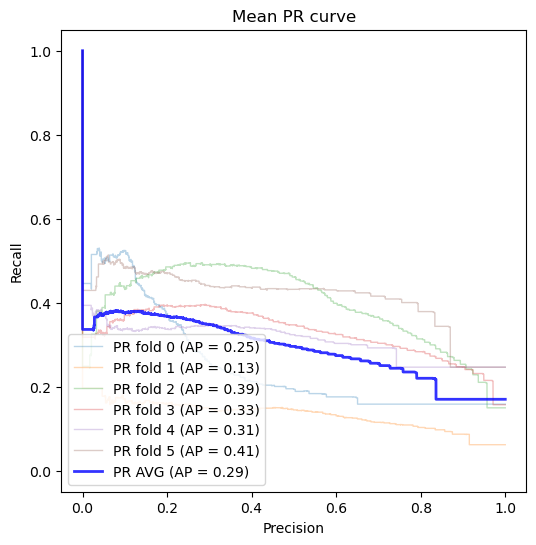

Here are the recall scores: [0.19886586 0.38469235 0.5136646  0.37726914 0.20193638 0.19509742]
Here are the precisions scores: [0.37198244 0.14647619 0.4543124  0.37831421 0.33668763 0.47101669]
Here are the accuracies scores: [0.81975446 0.82294767 0.83479043 0.8047495  0.70514013 0.74745784]
Here are the f1 scores: [0.25917431 0.2121672  0.48216889 0.37779095 0.25245618 0.27591111]


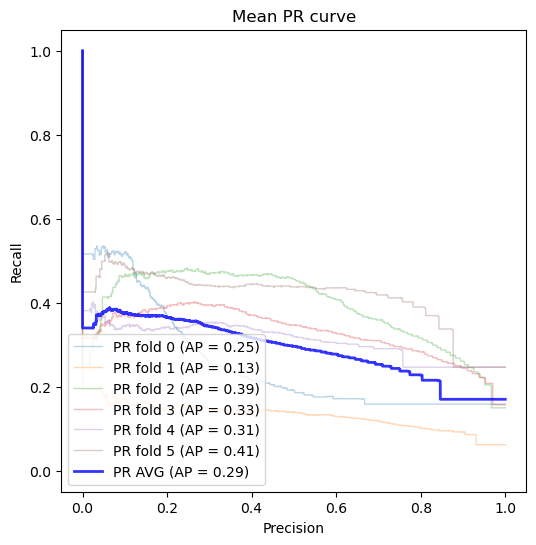

Here are the recall scores: [0.19573719 0.36968484 0.4989648  0.37115233 0.20319376 0.19258328]
Here are the precisions scores: [0.37787844 0.14252652 0.45695867 0.38255034 0.34201058 0.4653706 ]
Here are the accuracies scores: [0.82139757 0.82310268 0.83618552 0.80707465 0.70715526 0.74631076]
Here are the f1 scores: [0.25788999 0.20573497 0.4770388  0.37676515 0.2549298  0.2724282 ]


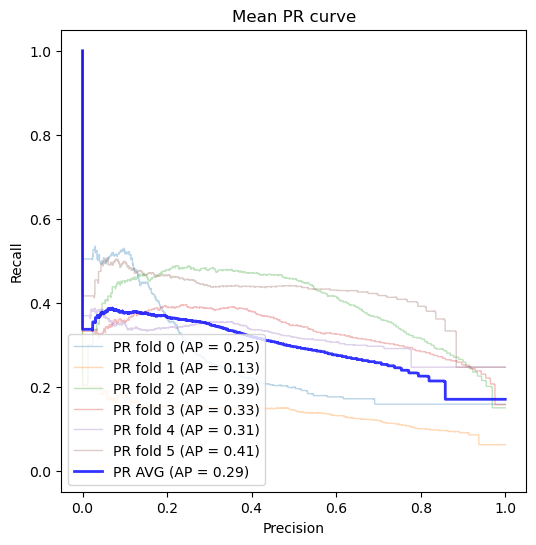

Here are the recall scores: [0.19612828 0.3871936  0.51200828 0.38003157 0.20407393 0.19308611]
Here are the precisions scores: [0.37467314 0.14844649 0.45268168 0.38589461 0.34053714 0.4646098 ]
Here are the accuracies scores: [0.82065352 0.82437376 0.83423239 0.80757068 0.7063182  0.74612475]
Here are the f1 scores: [0.25747658 0.21461251 0.48052074 0.38294065 0.25520874 0.27279993]


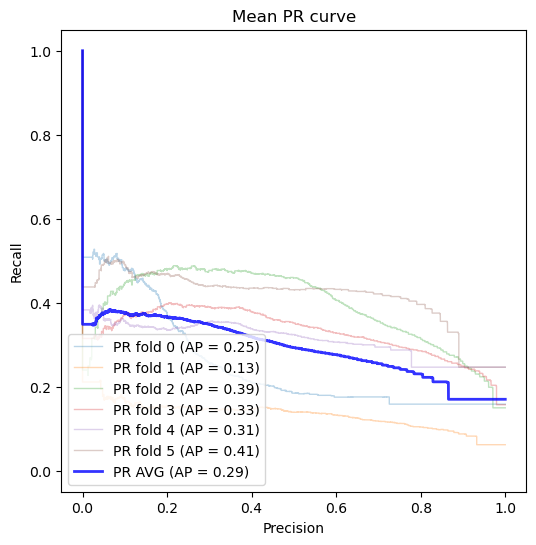

Here are the recall scores: [0.19984357 0.37468734 0.51118012 0.3804262  0.20093047 0.19384035]
Here are the precisions scores: [0.37394804 0.14401077 0.45764597 0.3857543  0.33444956 0.46684832]
Here are the accuracies scores: [0.82009549 0.82322669 0.83609251 0.80747768 0.70439608 0.74658978]
Here are the f1 scores: [0.26048171 0.20805556 0.48293399 0.38307173 0.25104077 0.27393853]


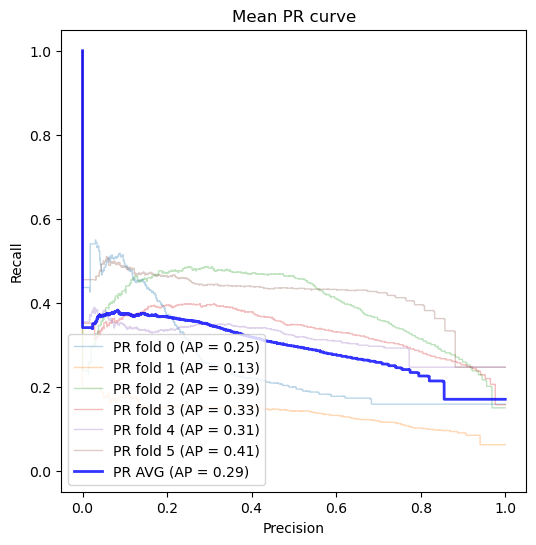

Here are the recall scores: [0.19886586 0.4022011  0.51118012 0.37726914 0.20243933 0.19157762]
Here are the precisions scores: [0.37239107 0.15109942 0.45722222 0.38148444 0.3345107  0.46406821]
Here are the accuracies scores: [0.81984747 0.82291667 0.8359375  0.80605159 0.70405506 0.74606275]
Here are the f1 scores: [0.25927342 0.21967213 0.48269795 0.37936508 0.25223249 0.27119851]


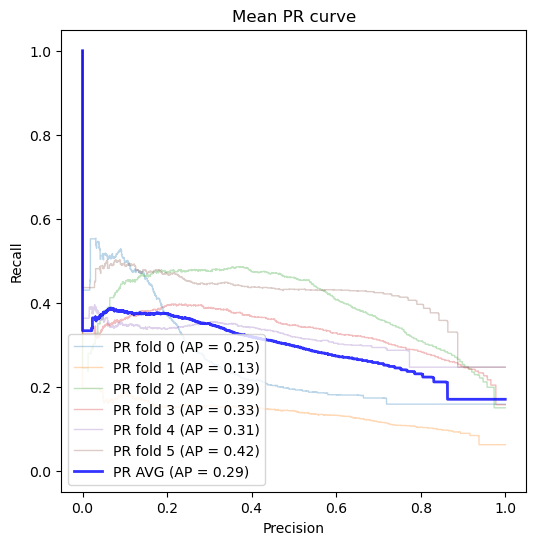

Here are the recall scores: [0.20043019 0.38269135 0.50621118 0.36523283 0.19602666 0.19333752]
Here are the precisions scores: [0.37164612 0.14874587 0.45777944 0.37660224 0.33620876 0.46776156]
Here are the accuracies scores: [0.81950645 0.82601687 0.83627852 0.80527654 0.70634921 0.7468068 ]
Here are the f1 scores: [0.26041667 0.21422571 0.48077868 0.37083041 0.24765687 0.27359246]


KeyboardInterrupt: 

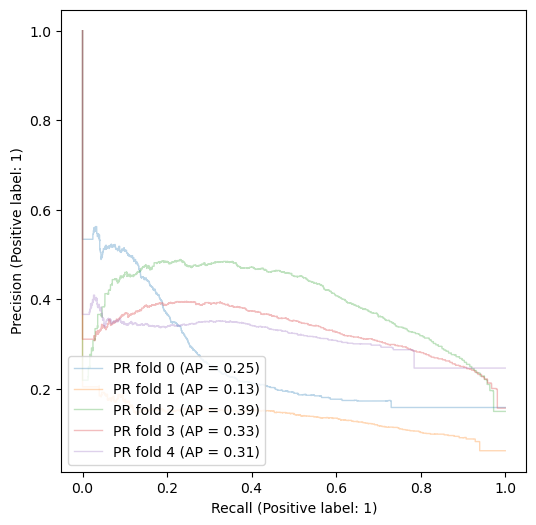

In [10]:
fig2, ax2 = plt.subplots(figsize=(6, 6))
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)
X,y = getBalancedXYData(mode = 'thickness',normmode = 'EQ-hist')
gridsearch = [1e-3,1e-2,1e-1,1,3,6,10,100,1000,10000]
for smooth in gridsearch:
    params = {
            'var_smoothing': smooth,
        }
    scores = score_model_PR(GaussianNB,X,y,params = params, cv=kf,plotMatrix = False, plotROC = True,ax2 = ax2,modelname = 'NB')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
plt.show()


# Test different RANDOMFOREST 
#fig2, ax2 = plt.subplots(figsize=(6, 6))
gridsearch = [10,30,50,75,100,125,150,125,150,175,200]
for num in gridsearch:
    params = {
            'n_estimators': num,
        }
    scores = score_model_PR(RandomForestClassifier,X,y,params = params, cv=kf,plotMatrix = False, plotROC = True,ax2 = ax2,modelname = 'RF')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
ax2.legend(loc="upper right")
fig2

In [ ]:
fig2

In [ ]:
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
gridsearch = [1e-11,1e-10,1e-9,1e-8,1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1,10,100]
for smooth in gridsearch:
    params = {
            'var_smoothing': smooth,
        }
    scores = score_model(GaussianNB,X,y,params = params, cv=kf,plotMatrix = False, plotROC = True)
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')


96384 20972 75412
(75412, 5)


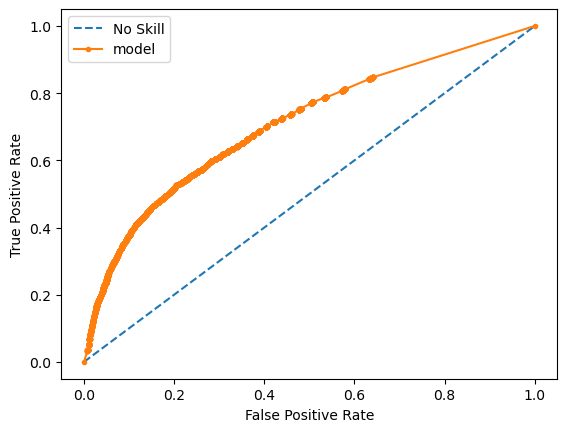

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


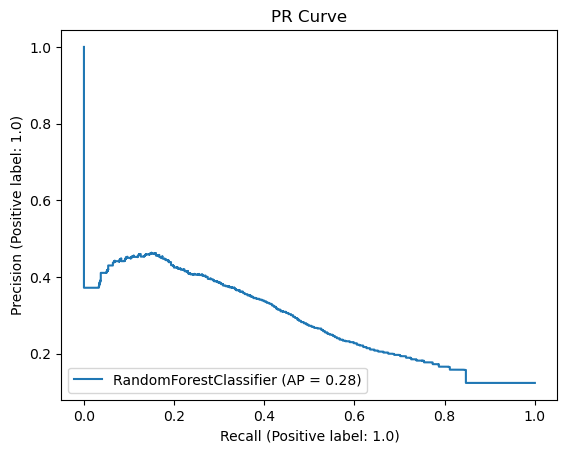

96384 11925 84459
(84459, 5)


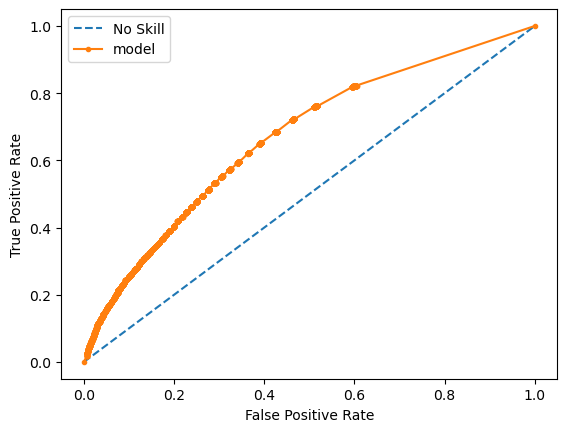

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


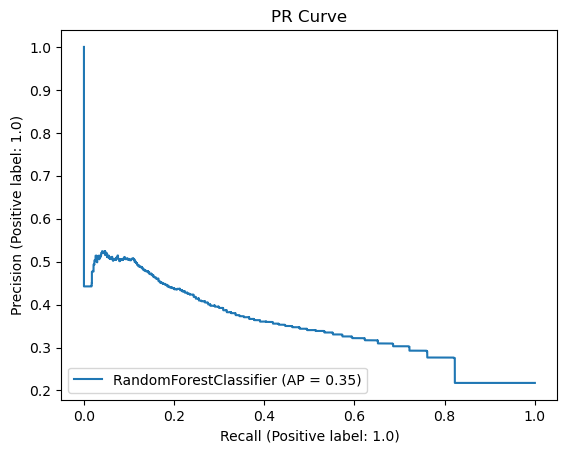

Here are the recall scores: [0.42163522 0.16522029]
Here are the precisions scores: [0.32451271 0.4593663 ]
Here are the accuracies scores: [0.81985599 0.77605204]
Here are the f1 scores: [0.36675298 0.24302998]


In [205]:
# Example of the model in action
kf = KFold(n_splits=2, shuffle=False)
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
scores = score_model(RandomForestClassifier,X,y, cv=kf,plotMatrix = False, plotROC = True)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

In [188]:
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
clf = make_pipeline(LinearSVC(random_state=0, tol=1e-5))

scores = score_model(GaussianNB,X,y, cv=kf,plotMatrix = False, plotROC = None,setTreshold = 0.18 )
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

160640 27783 132857
(132857, 5)
160640 30867 129773
(129773, 5)
160640 28116 132524
(132524, 5)
160640 27833 132807
(132807, 5)
160640 24944 135696
(135696, 5)
160640 24942 135698
(135698, 5)
Here are the recall scores: [0.83535393 0.88423645 0.99853587 0.97946288 0.90368414 0.68535512]
Here are the precisions scores: [0.1817563  0.08974551 0.15740191 0.16500333 0.24820417 0.2683335 ]
Here are the accuracies scores: [0.37518675 0.42601469 0.20433889 0.21551295 0.2985869  0.45938123]
Here are the f1 scores: [0.29855336 0.1629522  0.27193757 0.28242797 0.38944431 0.38566831]


In [174]:
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)

scores = score_model(GaussianNB,X,y, cv=kf,plotMatrix = False)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

160640 27783 132857
(132857, 5)
160640 30867 129773
(129773, 5)
160640 28116 132524
(132524, 5)
160640 27833 132807
(132807, 5)
160640 24944 135696
(135696, 5)
160640 24942 135698
(135698, 5)
Here are the recall scores: [0.35705905 0.72118227 0.81175486 0.65560821 0.28781592 0.44638592]
Here are the precisions scores: [0.43106704 0.16261246 0.3880224  0.34837356 0.44515753 0.43495835]
Here are the accuracies scores: [0.82264691 0.74772784 0.78146788 0.75242779 0.73490413 0.71934138]
Here are the f1 scores: [0.39058824 0.26538566 0.52506257 0.4549815  0.34959908 0.44059805]


In [175]:
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)

scores = score_model(GaussianNB,X,y, cv=kf,plotMatrix = False)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

106880 8637 98243
(98243, 70)
106880 11249 95631
(95631, 70)
106880 10648 96232
(96232, 70)
106880 10650 96230
(96230, 70)
106880 9720 97160
(97160, 70)
106880 10206 96674
(96674, 70)
Here are the recall scores: [0.20055788 1.         0.99237611 1.         0.89768185 0.6860119 ]
Here are the precisions scores: [0.2589125  0.163447   0.3428446  0.3247263  0.4501002  0.37277628]
Here are the accuracies scores: [0.7696482  0.76702844 0.859375   0.84707148 0.85965569 0.86152695]
Here are the f1 scores: [0.22602955 0.28097026 0.5096248  0.49025417 0.59957288 0.48305973]


In [176]:
X,y = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)

scores = score_model(GaussianNB,X,y, cv=kf,plotMatrix = False)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

53760 19146 34614
(34614, 70)
53760 19618 34142
(34142, 70)
53760 17468 36292
(36292, 70)
53760 17183 36577
(36577, 70)
53760 15224 38536
(38536, 70)
53760 14736 39024
(39024, 70)
Here are the recall scores: [0.9058208  0.46357616 0.4059869  0.534937   0.46890479 0.52062637]
Here are the precisions scores: [0.26908879 0.09406796 0.28145266 0.4092901  0.73532796 0.62163249]
Here are the accuracies scores: [0.63671875 0.50837054 0.51367188 0.59821429 0.64518229 0.56017485]
Here are the f1 scores: [0.41491911 0.15639962 0.33243968 0.46375372 0.57264479 0.56666361]


In [146]:
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)

scores = score_model(RandomForestClassifier,X,y, cv=kf)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

160640 27783 132857
(132857, 70)
160640 30867 129773
(129773, 70)
160640 28116 132524
(132524, 70)
160640 27833 132807
(132807, 70)
160640 24944 135696
(135696, 70)
160640 24942 135698
(135698, 70)
Here are the recall scores: [0.22624169 0.49655172 0.3974064  0.26402054 0.17678863 0.15889378]
Here are the precisions scores: [0.59608449 0.21761658 0.53176602 0.44212963 0.80434783 0.46317332]
Here are the accuracies scores: [0.85243401 0.85539094 0.85825448 0.83148655 0.78557644 0.74614044]
Here are the f1 scores: [0.32799433 0.30261183 0.45487192 0.33061325 0.28986702 0.2366155 ]


In [ ]:
# Creation of NP arrays X and y
import cv2

pathsamd = r'C:\Users\line\Desktop\Mauro\3_DataSet\OCT_balanced\amdP'
pathscontrol = r'C:\Users\line\Desktop\Mauro\3_DataSet\OCT_balanced\controlP'
def getXYdata(paths, mode,rootpath = None,normmode = 'Z-score'):
    def normalize(img,normmode = 'Z-score'):
        if normmode == 'Z-score':
            img = dataset.z_score(img)
        elif normmode == 'EQ-hist': 
            img = exposure.equalize_hist(img)
        elif normmode == 'CLAHE':
            #TO Implement normalization by zone
            # Adaptive Equalization
            img = exposure.equalize_adapthist(img/max((img.max(),-img.min())), clip_limit=0.03)            
        return img
    
    def getxmin(rootpath):
        themin = 100000
        allpaths =  glob.glob(os.path.join(rootpath,'amdP' + '\*.pickle')) + glob.glob(os.path.join(rootpath,'controlP' + '\*.pickle'))
        for path in allpaths:
            PPocts = pd.read_pickle(path)
            for PPoct in PPocts:
                xnew = PPoct.image()
                if(xnew.shape[0] < themin):
                    themin = xnew.shape[0]
        return themin
    
    if mode == 'thickness':
        xmin = 5 
    elif mode =='raw':
        xmin = getxmin(rootpath)
        
    X = np.empty((0,xmin))
    y = np.empty((0,))
    for path in paths:
        PPocts = pd.read_pickle(path)
        for PPoct in PPocts:
            if mode == 'thickness':
                xnew = np.transpose(PPoct.thicknesses())
            elif mode == 'raw':
                xnew = np.transpose(normalize(PPoct.image(),normmode = normmode))
                xnew = cv2.resize(xnew, dsize=(xmin,768 ))
            ynew = PPoct.label()
            #stack vertically the x and y
            X = np.vstack((X,xnew))
            y = np.hstack((y,ynew))
    return X,y  #,groupvect

In [ ]:
basepath = r'C:\Users\line\Desktop\Mauro\3_DataSet\OCT_balanced'
paths = glob.glob(os.path.join(basepath,'controlP' + '\*.pickle'))
paths2 = glob.glob(os.path.join(basepath,'amdP' + '\*.pickle'))
merged = [[paths[2*i],paths[2*i+1],paths2[i]]  for i in range(len(paths2))]
flattenedmerged = [item for sublist in merged for item in sublist]
print(flattenedmerged)
X,y = getXYdata(flattenedmerged, mode = 'raw',rootpath = basepath,normmode = 'EQ-hist')

In [ ]:
print(len(flattenedmerged)*768*14)

In [ ]:
print(X.shape,y.shape)

In [ ]:
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)

scores = score_model(GaussianNB,X,y, cv=kf)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

In [ ]:
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)

scores = score_model(RandomForestClassifier,X,y, cv=kf)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

In [ ]:
basepath = r'C:\Users\line\Desktop\Mauro\3_DataSet\OCT_balanced'
paths = glob.glob(os.path.join(basepath,'controlP' + '\*.pickle'))
X,y = getXYdata(paths, mode = 'raw',rootpath = basepath,normmode = 'EQ-hist')
# Example of the model in action
kf = KFold(n_splits=6, shuffle=False)

scores = score_model(RandomForestClassifier,X,y, cv=kf)
print(f'Here are the recall scores: {scores[::4]}')
print(f'Here are the precisions scores: {scores[1::4]}')
print(f'Here are the accuracies scores: {scores[2::4]}')
print(f'Here are the f1 scores: {scores[3::4]}')

# Hyperparameter optimization example: gridsearch

In [4]:
# Define cross val number of splits for hyperparam optimization
kf = KFold(n_splits=6, shuffle=False)

In [6]:
X.shape

(193536, 70)

EQ-hist


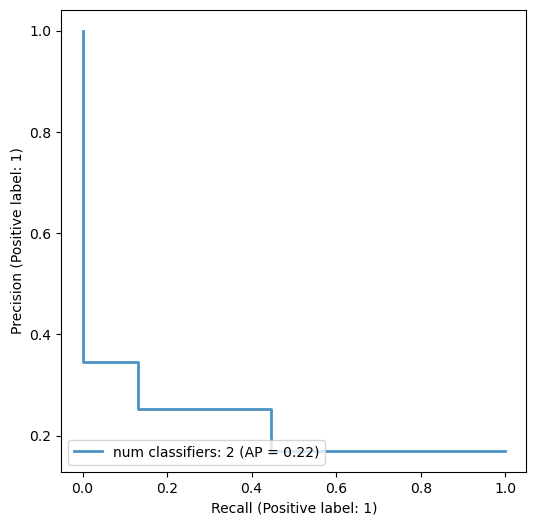

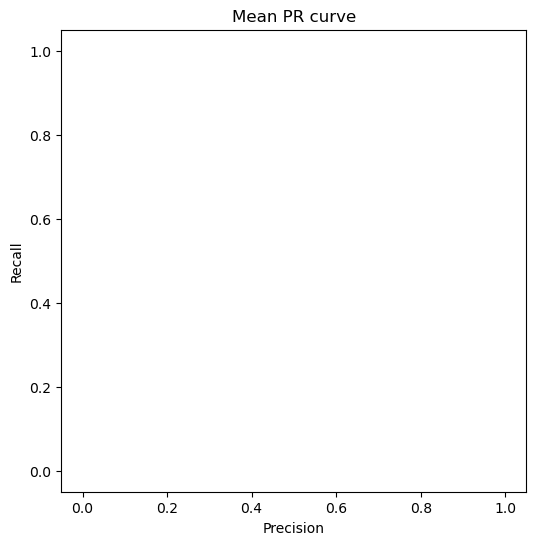

Here are the recall scores: [0.23319099 0.0729405 ]
Here are the precisions scores: [0.30284906 0.46153846]
Here are the accuracies scores: [0.83911004 0.78059896]
Here are the f1 scores: [0.26349402 0.12597258]


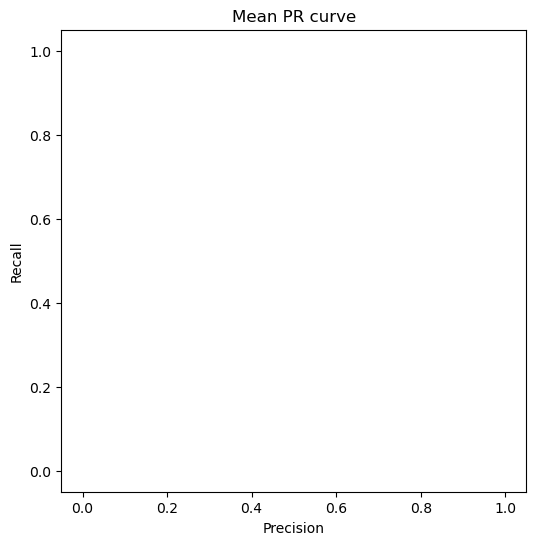

Here are the recall scores: [0.39847609 0.11837338]
Here are the precisions scores: [0.2928255  0.48705375]
Here are the accuracies scores: [0.80699198 0.78187004]
Here are the f1 scores: [0.33757758 0.19045793]


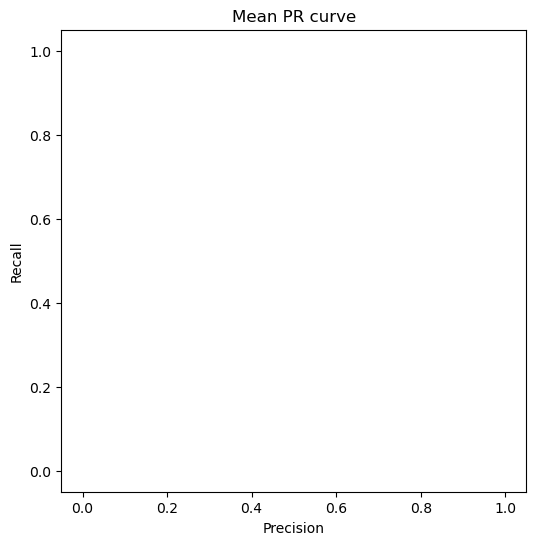

Here are the recall scores: [0.33894331 0.07274981]
Here are the precisions scores: [0.34944751 0.60316206]
Here are the accuracies scores: [0.84053613 0.78862847]
Here are the f1 scores: [0.34411527 0.12983919]


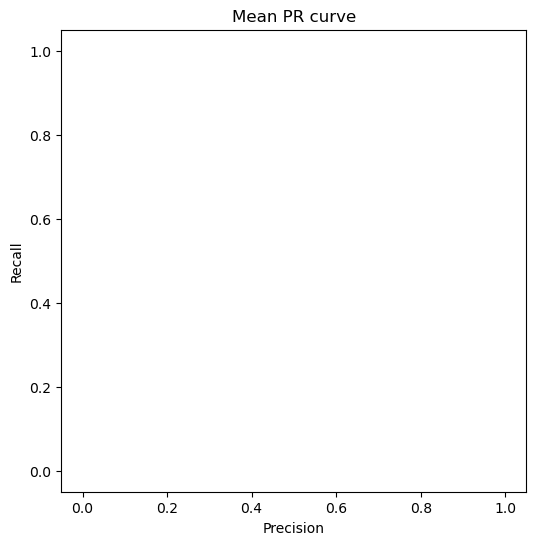

Here are the recall scores: [0.35518714 0.05882914]
Here are the precisions scores: [0.35644064 0.64170567]
Here are the accuracies scores: [0.84126984 0.78886615]
Here are the f1 scores: [0.35581278 0.10777763]


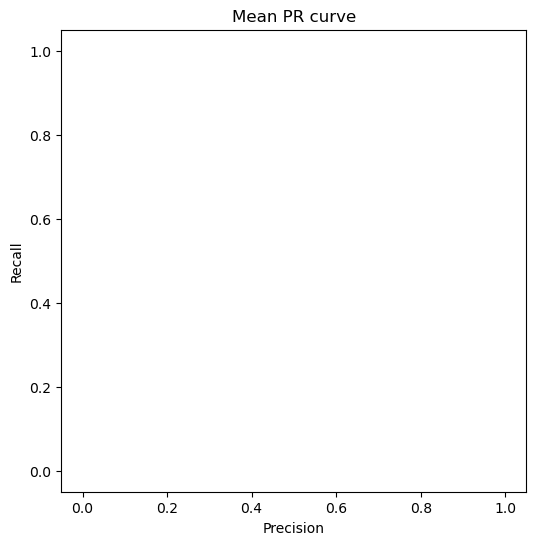

Here are the recall scores: [0.36615591 0.05968726]
Here are the precisions scores: [0.36347768 0.64870466]
Here are the accuracies scores: [0.84263393 0.78916584]
Here are the f1 scores: [0.36481188 0.10931634]


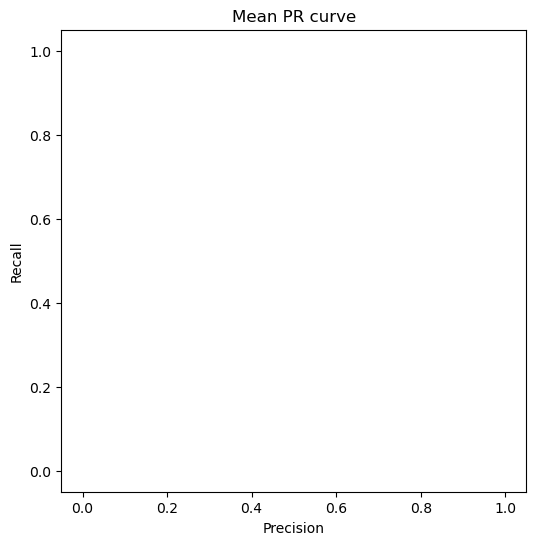

Here are the recall scores: [0.37787826 0.06021167]
Here are the precisions scores: [0.37573891 0.66091052]
Here are the accuracies scores: [0.84573413 0.78958953]
Here are the f1 scores: [0.37680554 0.11036833]


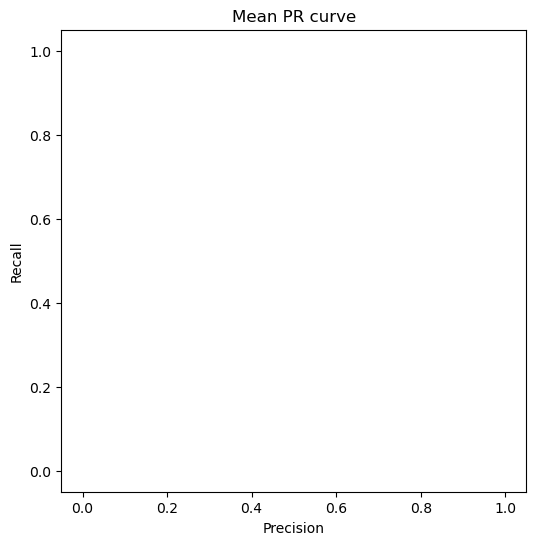

Here are the recall scores: [0.39043791 0.06073608]
Here are the precisions scores: [0.37208746 0.67729931]
Here are the accuracies scores: [0.84345031 0.7901269 ]
Here are the f1 scores: [0.38104188 0.1114757 ]


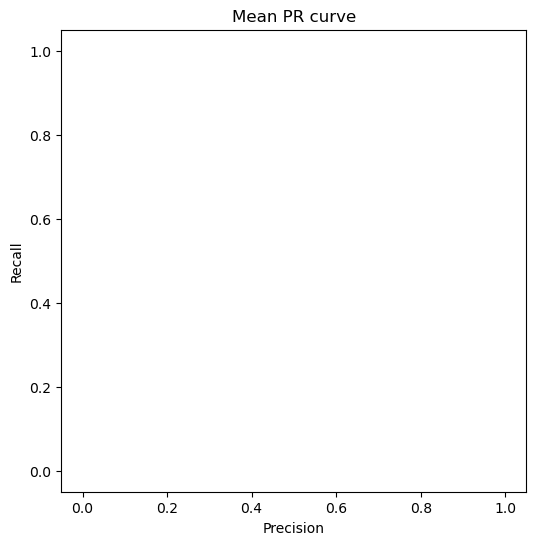

Here are the recall scores: [0.38533032 0.0585431 ]
Here are the precisions scores: [0.3783606  0.68222222]
Here are the accuracies scores: [0.84600281 0.79001323]
Here are the f1 scores: [0.38181366 0.10783281]


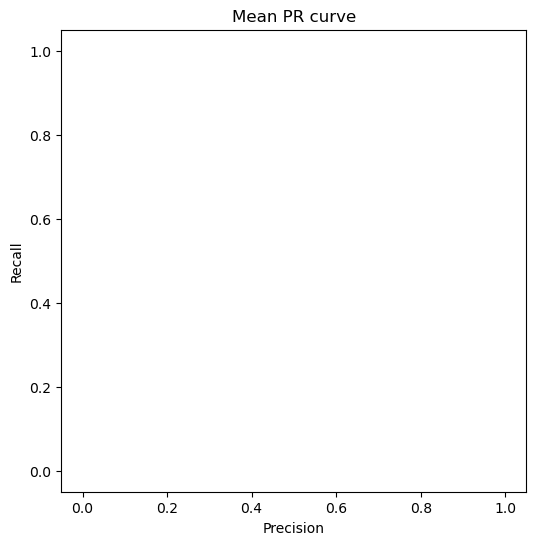

Here are the recall scores: [0.38064138 0.05706522]
Here are the precisions scores: [0.37757475 0.69230769]
Here are the accuracies scores: [0.84611648 0.79010623]
Here are the f1 scores: [0.37910186 0.10543933]


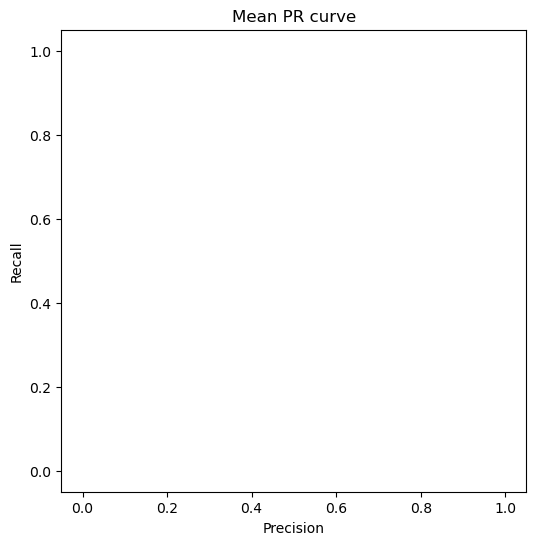

Here are the recall scores: [0.37812945 0.0560164 ]
Here are the precisions scores: [0.37892264 0.6928066 ]
Here are the accuracies scores: [0.84675719 0.78999256]
Here are the f1 scores: [0.37852563 0.10365208]


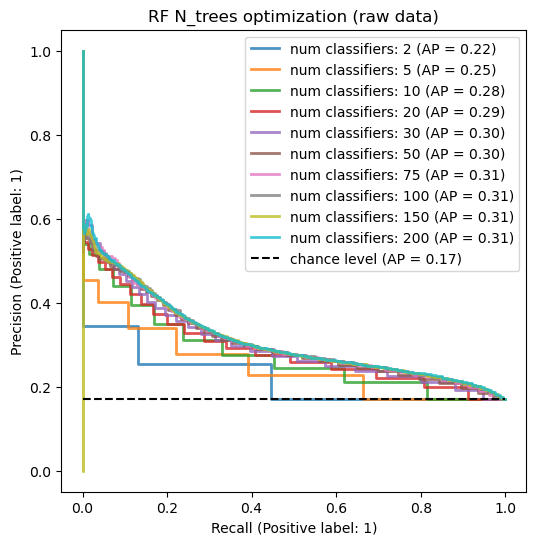

In [42]:
# Hyperparameter tuning example
mode = 'raw'
norm = 'EQ-hist'
X,y = getBalancedXYData(mode = mode,normmode = norm)
fig2, ax2 = plt.subplots(figsize=(6, 6))
gridsearch = [2,5,10,20,30,50,75,100,150,200]
for num in gridsearch:
    params = {
            'n_estimators': num,
        }
    scores = score_model_PR(RandomForestClassifier,X,y, params = params, cv=kf,plotMatrix = False,plotROC = False,ax2 = ax2,modelname = 'RF',label = f'num classifiers: {num}')
    #scores = score_model(RandomForestClassifier,X,y,params = params, cv=kf,plotMatrix = False, plotROC = True,ax2 = ax2,modelname = 'RF')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
ax2.legend(loc="upper right")
ax2.set_title(f"RF N_trees optimization (raw data)")
fig2

EQ-hist


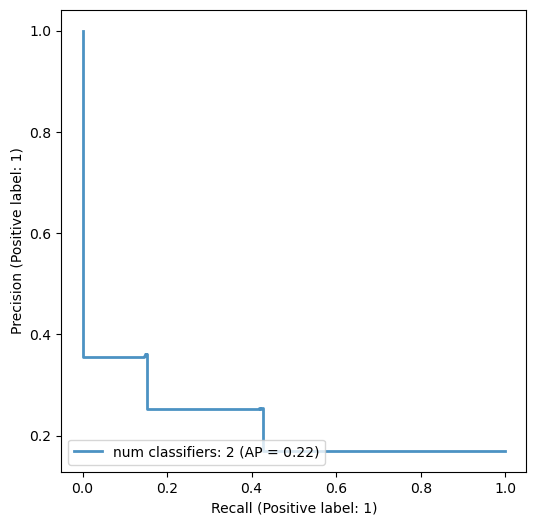

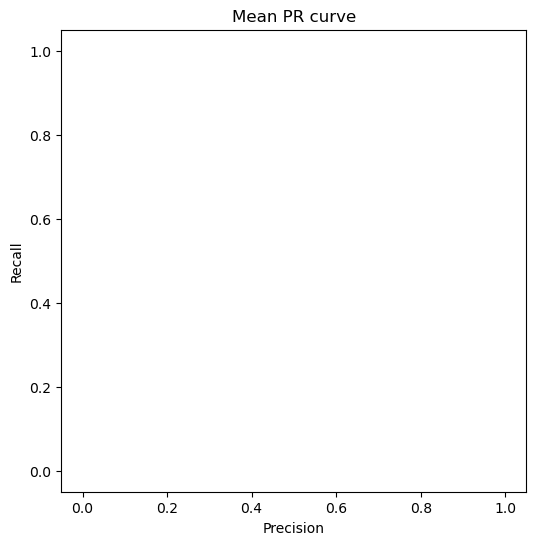

Here are the recall scores: [0.25881269 0.09158085]
Here are the precisions scores: [0.31134166 0.48351372]
Here are the accuracies scores: [0.83786996 0.78188037]
Here are the f1 scores: [0.2826574  0.15399415]


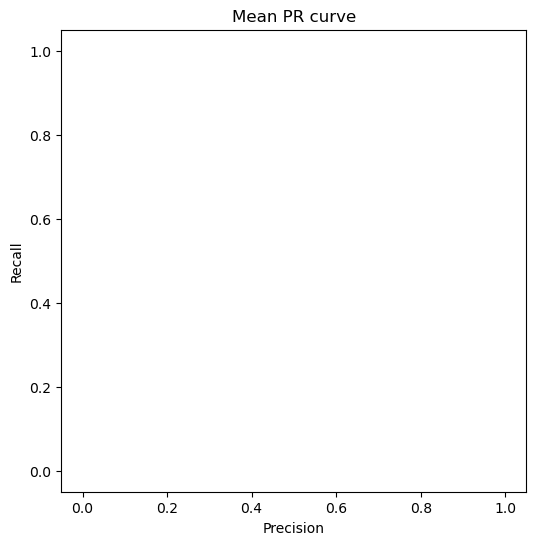

Here are the recall scores: [0.44310475 0.15403318]
Here are the precisions scores: [0.27876106 0.46455787]
Here are the accuracies scores: [0.78977555 0.77813947]
Here are the f1 scores: [0.34222524 0.23135584]


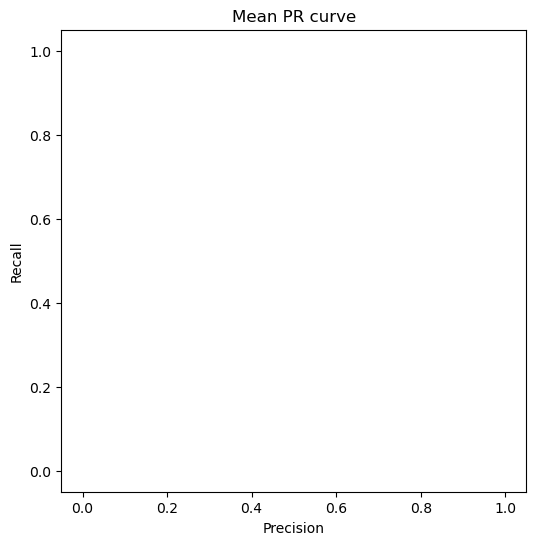

Here are the recall scores: [0.3933685  0.11250953]
Here are the precisions scores: [0.33342796 0.5099395 ]
Here are the accuracies scores: [0.82807333 0.78418485]
Here are the f1 scores: [0.36092652 0.1843462 ]


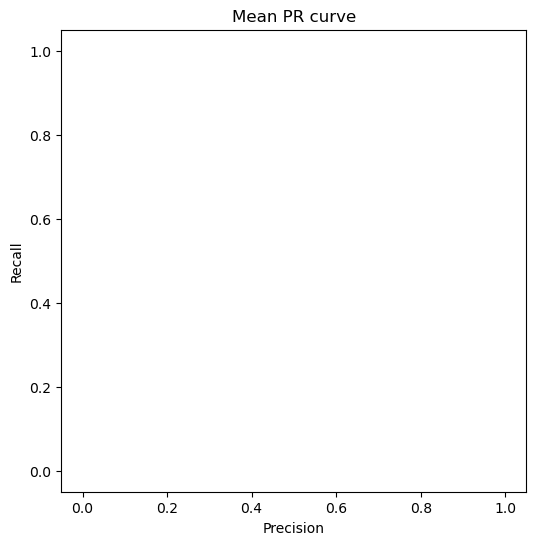

Here are the recall scores: [0.41991125 0.11136537]
Here are the precisions scores: [0.33244945 0.50529959]
Here are the accuracies scores: [0.82434276 0.78374049]
Here are the f1 scores: [0.37109664 0.18250713]


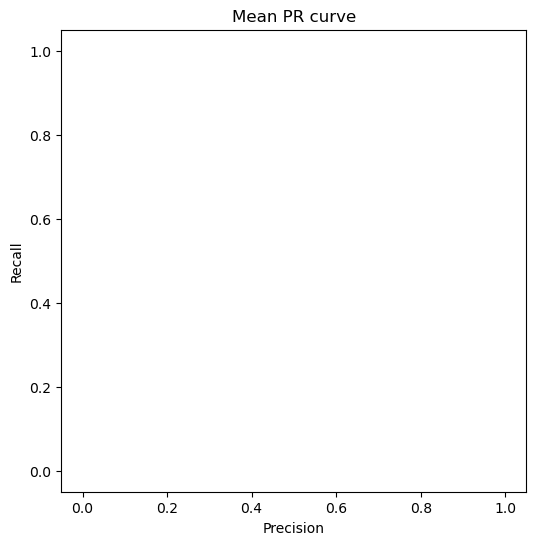

Here are the recall scores: [0.40299757 0.11699085]
Here are the precisions scores: [0.33172514 0.5320902 ]
Here are the accuracies scores: [0.82612021 0.78629299]
Here are the f1 scores: [0.36390443 0.19180866]


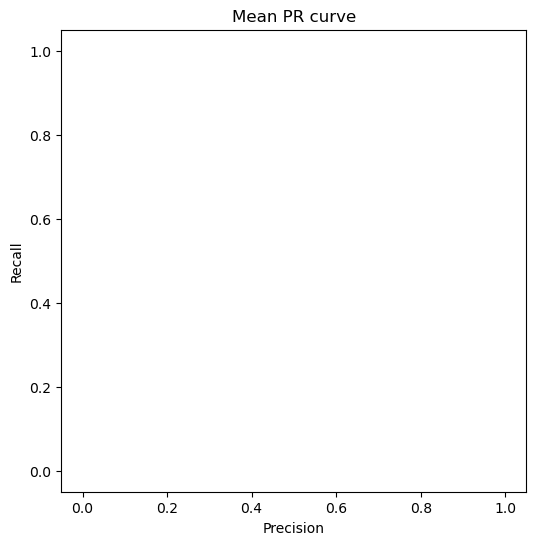

Here are the recall scores: [0.40902621 0.12028032]
Here are the precisions scores: [0.33217734 0.55268346]
Here are the accuracies scores: [0.8255725  0.78820478]
Here are the f1 scores: [0.36661788 0.1975647 ]


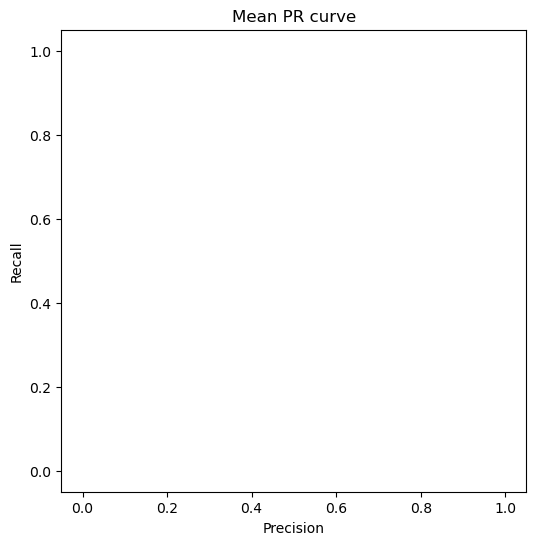

Here are the recall scores: [0.4214184  0.12252098]
Here are the precisions scores: [0.3286106 0.5337487]
Here are the accuracies scores: [0.82232763 0.78659268]
Here are the f1 scores: [0.36927253 0.19929433]


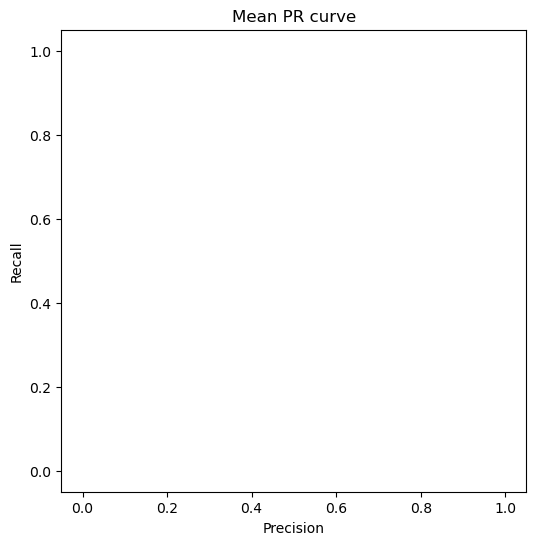

Here are the recall scores: [0.41530604 0.11751526]
Here are the precisions scores: [0.33313184 0.53459119]
Here are the accuracies scores: [0.82523148 0.78653067]
Here are the f1 scores: [0.36970781 0.19267597]


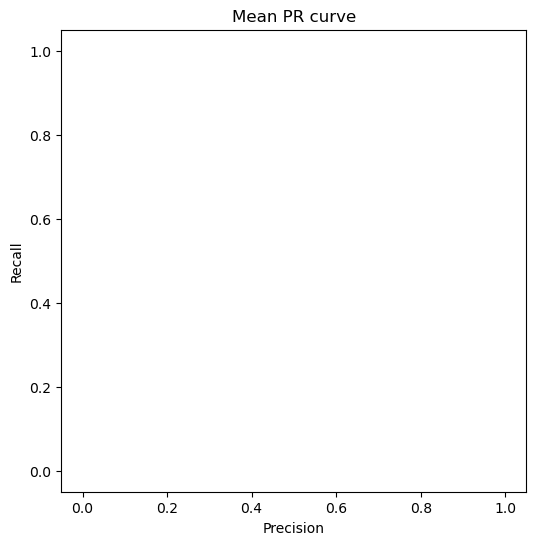

Here are the recall scores: [0.41128695 0.11980359]
Here are the precisions scores: [0.33597811 0.54382168]
Here are the accuracies scores: [0.82701926 0.78741939]
Here are the f1 scores: [0.36983774 0.19635113]


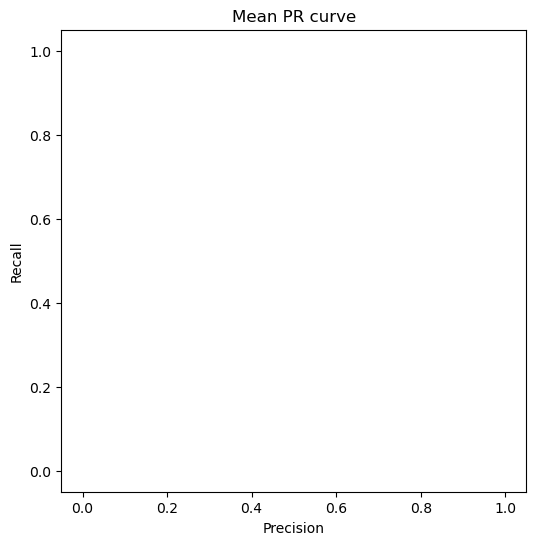

Here are the recall scores: [0.40860755 0.11865942]
Here are the precisions scores: [0.33251567 0.54679262]
Here are the accuracies scores: [0.82577918 0.78763641]
Here are the f1 scores: [0.3666554  0.19500157]


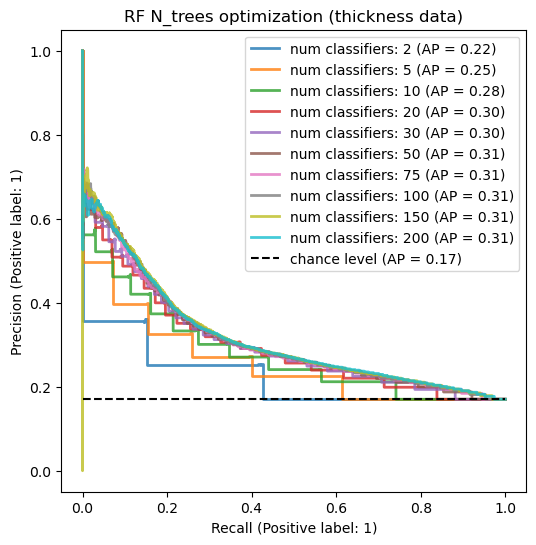

In [43]:
# Hyperparameter tuning example
mode = 'thickness'
norm = 'EQ-hist'
X,y = getBalancedXYData(mode = mode,normmode = norm)
fig2, ax2 = plt.subplots(figsize=(6, 6))
gridsearch = [2,5,10,20,30,50,75,100,150,200]
for num in gridsearch:
    params = {
            'n_estimators': num,
        }
    scores = score_model_PR(RandomForestClassifier,X,y, params = params, cv=kf,plotMatrix = False,plotROC = False,ax2 = ax2,modelname = 'RF',label = f'num classifiers: {num}')
    #scores = score_model(RandomForestClassifier,X,y,params = params, cv=kf,plotMatrix = False, plotROC = True,ax2 = ax2,modelname = 'RF')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
ax2.legend(loc="upper right")
ax2.set_title(f"RF N_trees optimization (thickness data)")
fig2

EQ-hist


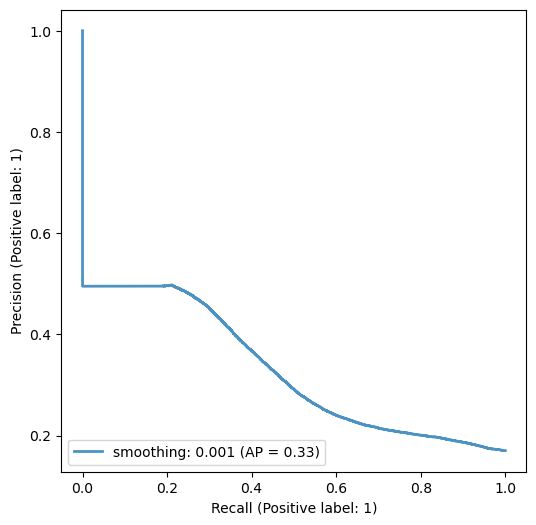

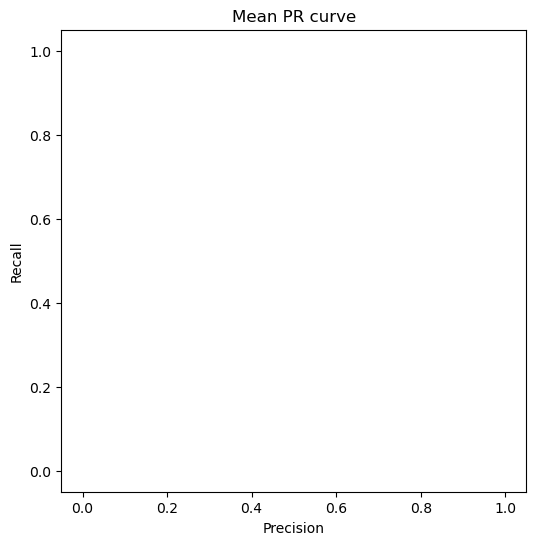

Here are the recall scores: [0.64129616 0.36517925]
Here are the precisions scores: [0.25482433 0.41977203]
Here are the accuracies scores: [0.72427869 0.75297619]
Here are the f1 scores: [0.36472297 0.3905772 ]


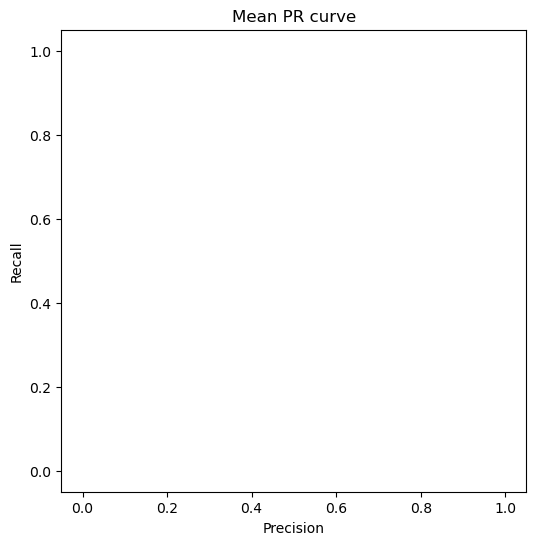

Here are the recall scores: [0.6395378  0.36584668]
Here are the precisions scores: [0.25675676 0.42049315]
Here are the accuracies scores: [0.72702753 0.75324487]
Here are the f1 scores: [0.36641002 0.3912711 ]


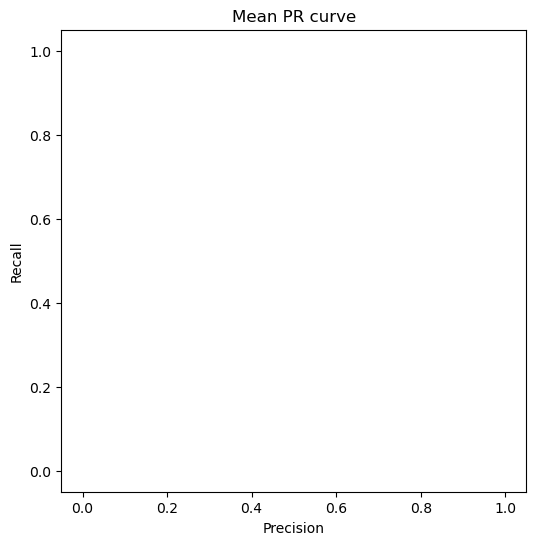

Here are the recall scores: [0.62371264 0.35979214]
Here are the precisions scores: [0.26725746 0.42394113]
Here are the accuracies scores: [0.74250785 0.75524967]
Here are the f1 scores: [0.37418059 0.38924132]


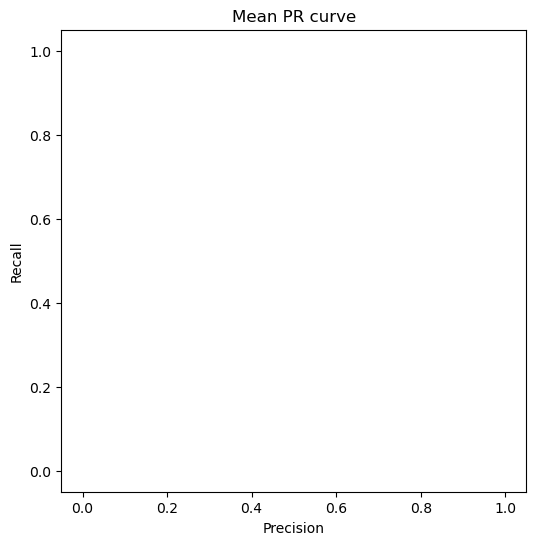

Here are the recall scores: [0.58720589 0.34544241]
Here are the precisions scores: [0.29481251 0.41947435]
Here are the accuracies scores: [0.77570064 0.75448495]
Here are the f1 scores: [0.39254429 0.37887582]


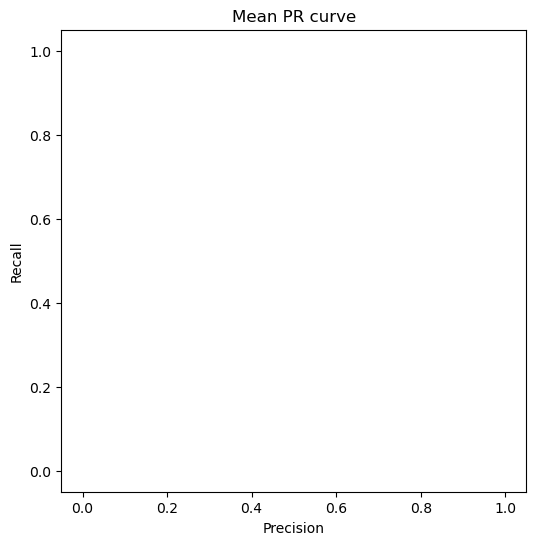

Here are the recall scores: [0.57556728 0.3488749 ]
Here are the precisions scores: [0.30582373 0.41082356]
Here are the accuracies scores: [0.78637566 0.75040303]
Here are the f1 scores: [0.39941894 0.37732347]


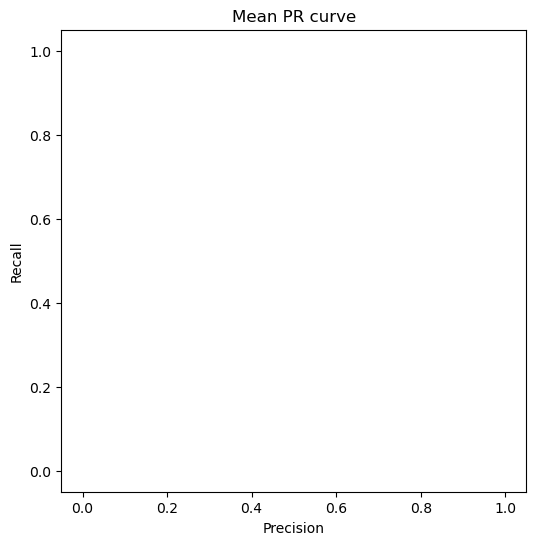

Here are the recall scores: [0.57062715 0.35102021]
Here are the precisions scores: [0.31070484 0.40592094]
Here are the accuracies scores: [0.79076761 0.7479642 ]
Here are the f1 scores: [0.40233787 0.37647961]


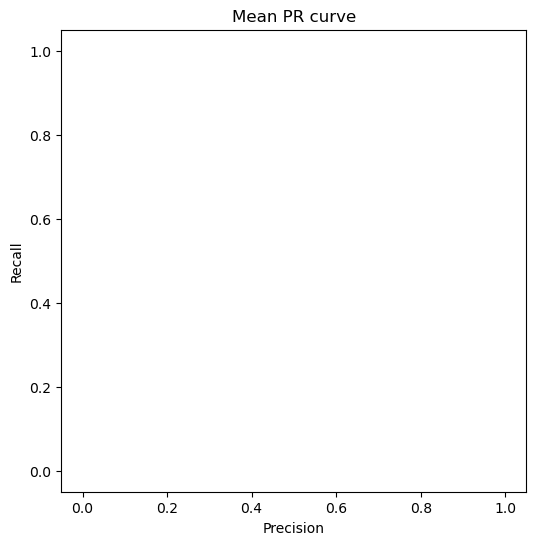

Here are the recall scores: [0.56803148 0.35206903]
Here are the precisions scores: [0.3130162 0.4036622]
Here are the accuracies scores: [0.79282407 0.7468068 ]
Here are the f1 scores: [0.40361733 0.3761045 ]


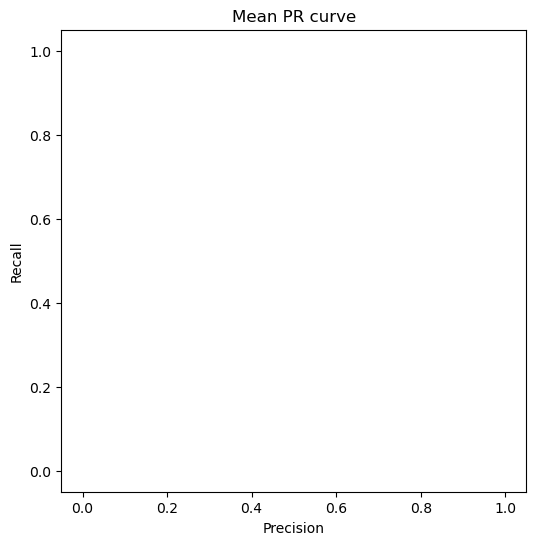

Here are the recall scores: [0.56417985 0.35383295]
Here are the precisions scores: [0.31660558 0.40075594]
Here are the accuracies scores: [0.79591394 0.74524636]
Here are the f1 scores: [0.40559819 0.37583553]


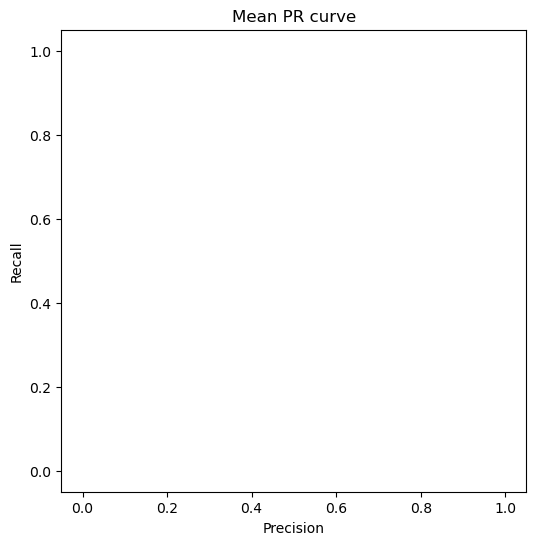

Here are the recall scores: [0.5637612  0.35402365]
Here are the precisions scores: [0.31699623 0.40015088]
Here are the accuracies scores: [0.79624463 0.74493634]
Here are the f1 scores: [0.4058102  0.37567663]


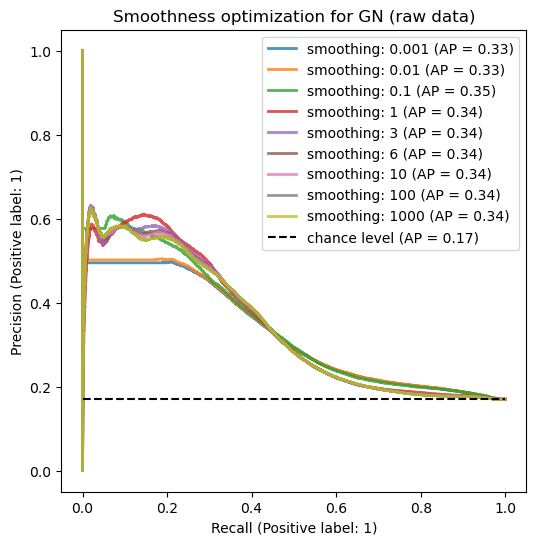

In [44]:
# Hyperparameter tuning example
mode = 'raw'
norm = 'EQ-hist'
X,y = getBalancedXYData(mode = mode,normmode = norm)
fig2, ax2 = plt.subplots(figsize=(6, 6))
gridsearch = [1e-3,1e-2,1e-1,1,3,6,10,100,1000]
for smooth in gridsearch:
    params = {
            'var_smoothing': smooth,
        }
    scores = score_model_PR(GaussianNB,X,y, params = params, cv=kf,plotMatrix = False,plotROC = False,ax2 = ax2,modelname = 'NB',label = f'smoothing: {smooth}')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
ax2.legend(loc="upper right")
ax2.set_title(f"Smoothness optimization for GN (raw data)")
fig2

EQ-hist


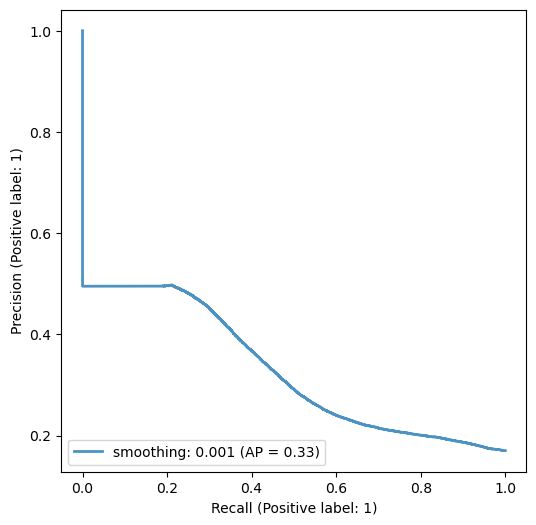

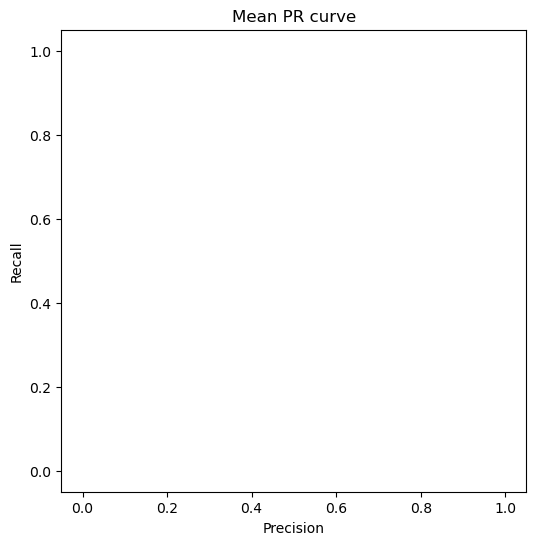

Here are the recall scores: [0.64129616 0.36517925]
Here are the precisions scores: [0.25482433 0.41977203]
Here are the accuracies scores: [0.72427869 0.75297619]
Here are the f1 scores: [0.36472297 0.3905772 ]


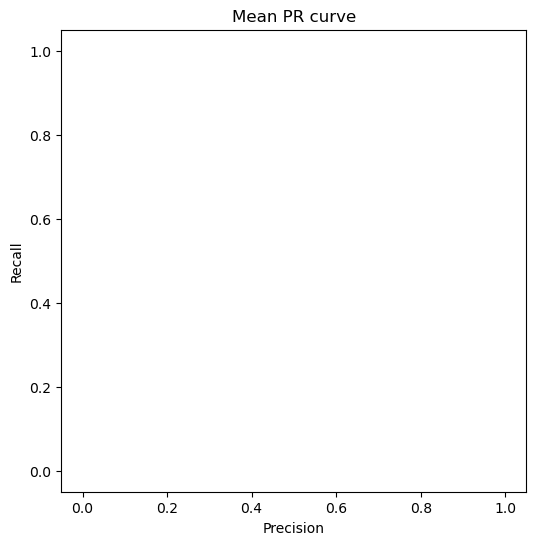

Here are the recall scores: [0.6395378  0.36584668]
Here are the precisions scores: [0.25675676 0.42049315]
Here are the accuracies scores: [0.72702753 0.75324487]
Here are the f1 scores: [0.36641002 0.3912711 ]


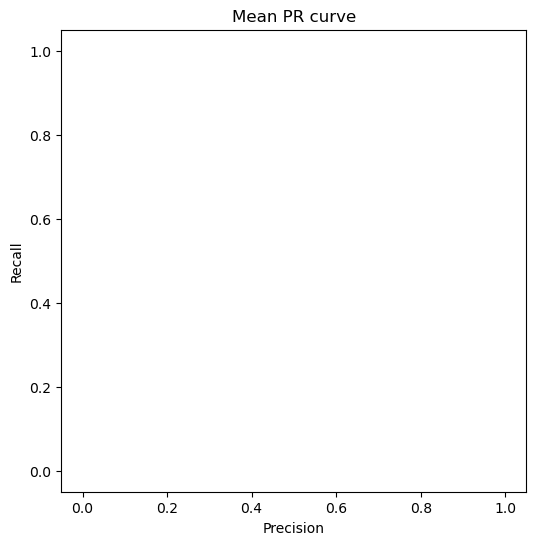

Here are the recall scores: [0.62371264 0.35979214]
Here are the precisions scores: [0.26725746 0.42394113]
Here are the accuracies scores: [0.74250785 0.75524967]
Here are the f1 scores: [0.37418059 0.38924132]


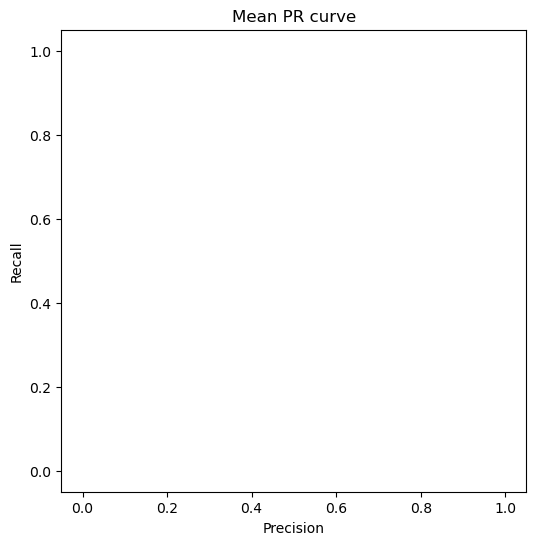

Here are the recall scores: [0.58720589 0.34544241]
Here are the precisions scores: [0.29481251 0.41947435]
Here are the accuracies scores: [0.77570064 0.75448495]
Here are the f1 scores: [0.39254429 0.37887582]


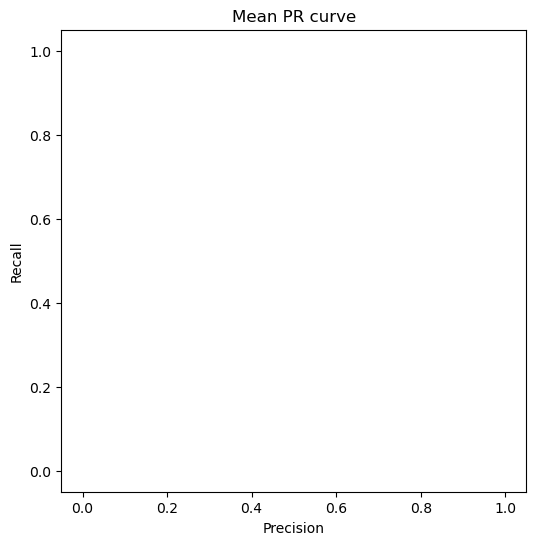

Here are the recall scores: [0.57556728 0.3488749 ]
Here are the precisions scores: [0.30582373 0.41082356]
Here are the accuracies scores: [0.78637566 0.75040303]
Here are the f1 scores: [0.39941894 0.37732347]


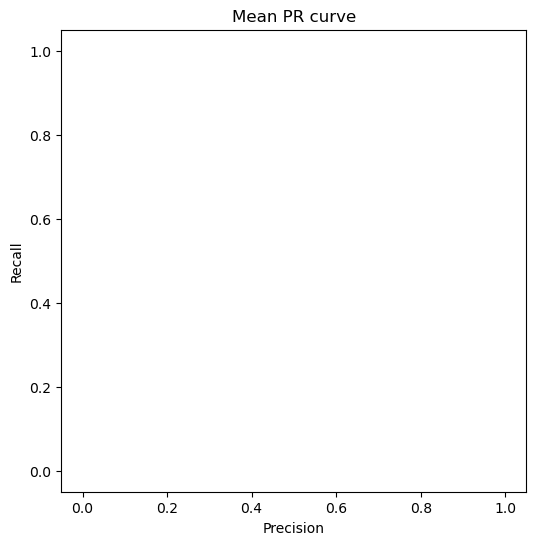

Here are the recall scores: [0.57062715 0.35102021]
Here are the precisions scores: [0.31070484 0.40592094]
Here are the accuracies scores: [0.79076761 0.7479642 ]
Here are the f1 scores: [0.40233787 0.37647961]


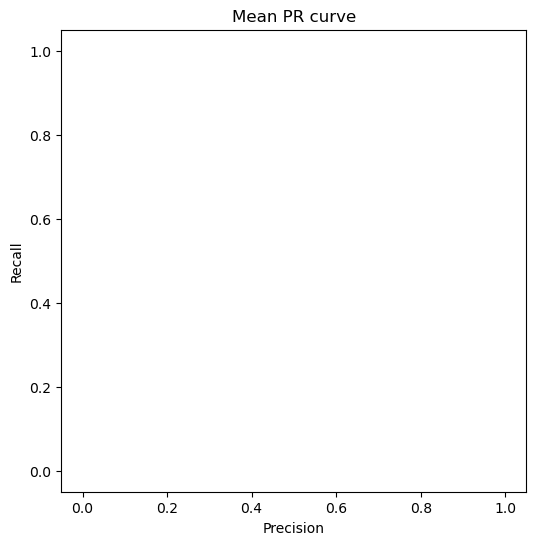

Here are the recall scores: [0.56803148 0.35206903]
Here are the precisions scores: [0.3130162 0.4036622]
Here are the accuracies scores: [0.79282407 0.7468068 ]
Here are the f1 scores: [0.40361733 0.3761045 ]


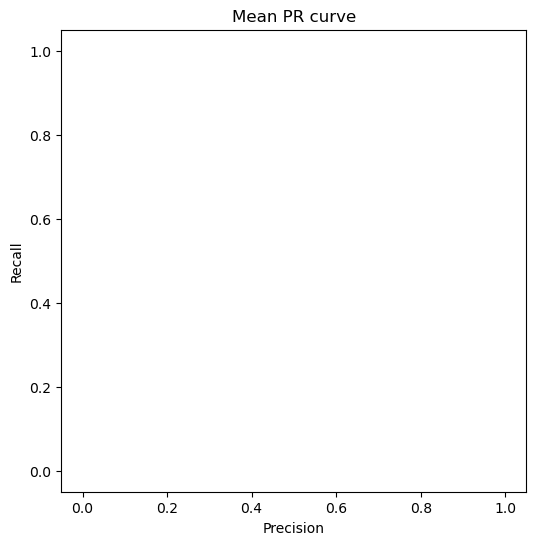

Here are the recall scores: [0.56417985 0.35383295]
Here are the precisions scores: [0.31660558 0.40075594]
Here are the accuracies scores: [0.79591394 0.74524636]
Here are the f1 scores: [0.40559819 0.37583553]


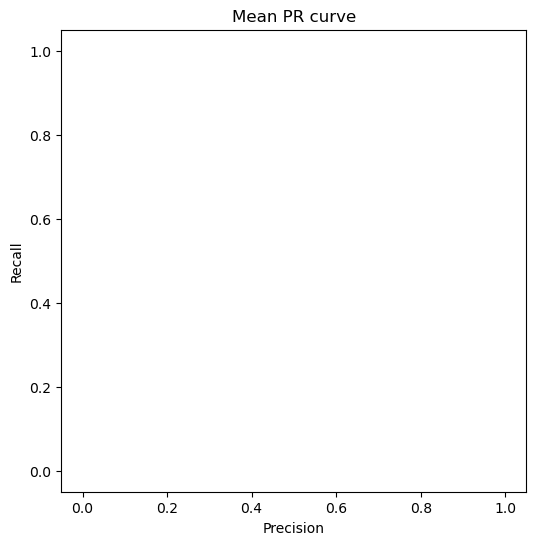

Here are the recall scores: [0.5637612  0.35402365]
Here are the precisions scores: [0.31699623 0.40015088]
Here are the accuracies scores: [0.79624463 0.74493634]
Here are the f1 scores: [0.4058102  0.37567663]


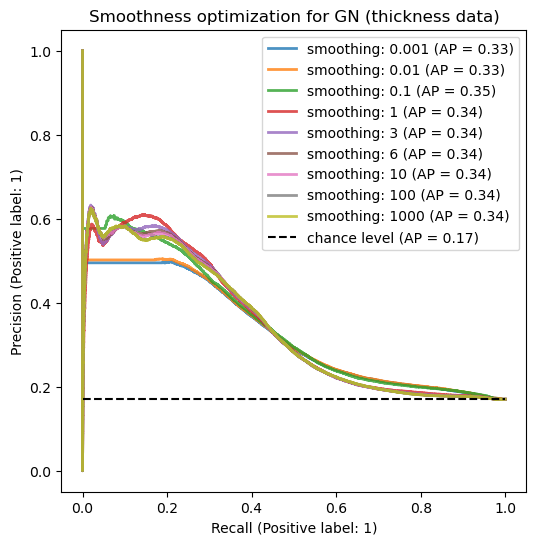

In [45]:
# Hyperparameter tuning example
mode = 'raw'
norm = 'EQ-hist'
X,y = getBalancedXYData(mode = mode,normmode = norm)
fig2, ax2 = plt.subplots(figsize=(6, 6))
gridsearch = [1e-3,1e-2,1e-1,1,3,6,10,100,1000]
for smooth in gridsearch:
    params = {
            'var_smoothing': smooth,
        }
    scores = score_model_PR(GaussianNB,X,y, params = params, cv=kf,plotMatrix = False,plotROC = False,ax2 = ax2,modelname = 'NB',label = f'smoothing: {smooth}')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
ax2.legend(loc="upper right")
ax2.set_title(f"Smoothness optimization for GN (thickness data)")
fig2

# Comparison between different images normalizations
In this section we compare different normalizations, namely no trasformations, Histogram norm, z-score norm, adaptive histogram norm

In [46]:
from sklearn.calibration import CalibratedClassifierCV
clf = CalibratedClassifierCV(LinearSVC(tol =  1e-5,random_state = 0))


Z-score
EQ-hist
CLAHE
Plot for R with data raw to compare normalizations :
normalizzazione: 


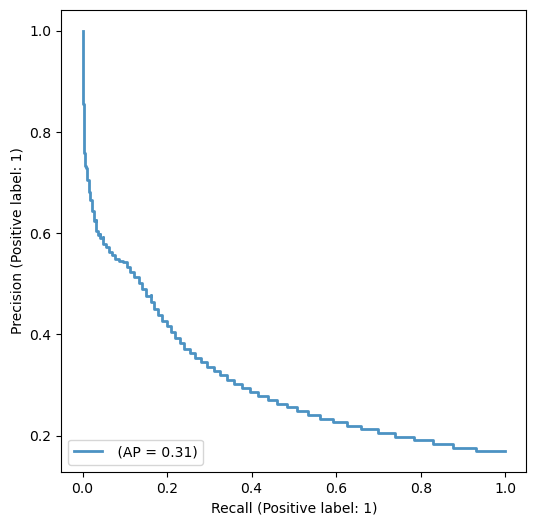

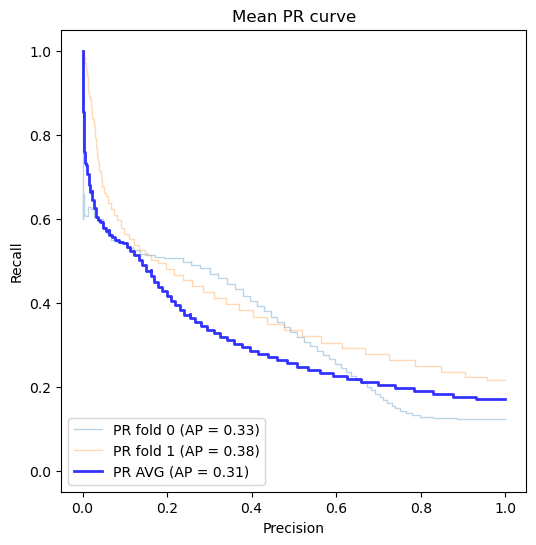

Plot for R with data raw to compare normalizations :
normalizzazione: Z-score


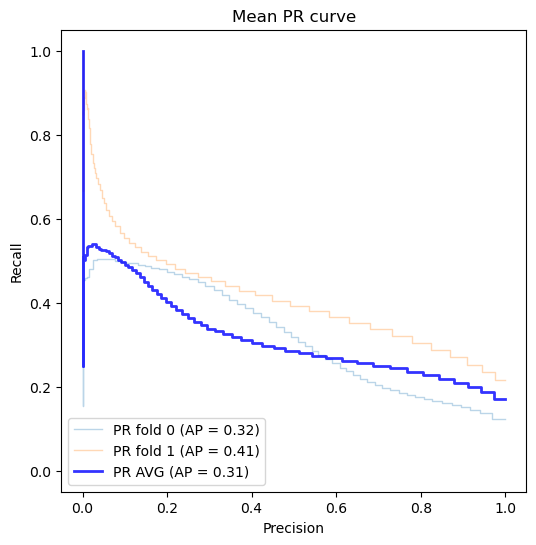

Plot for R with data raw to compare normalizations :
normalizzazione: EQ-hist


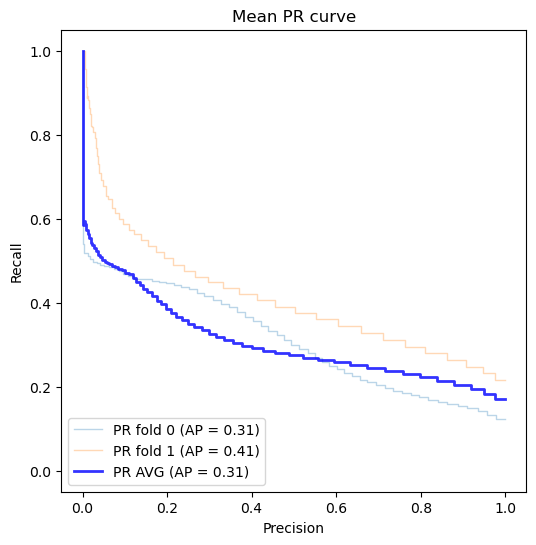

Plot for R with data raw to compare normalizations :
normalizzazione: CLAHE


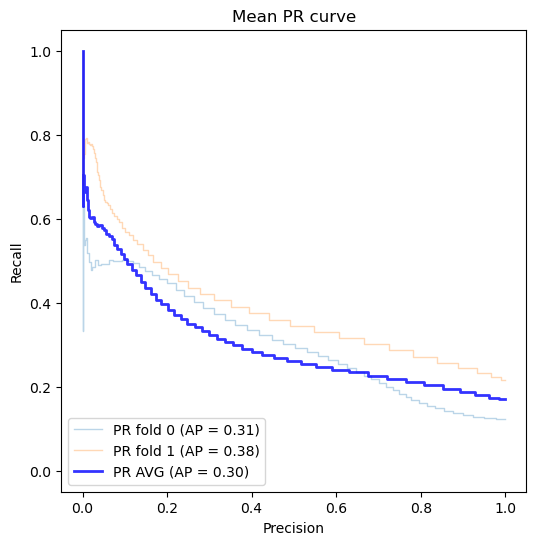

Plot for B with data raw to compare normalizations :
normalizzazione: 


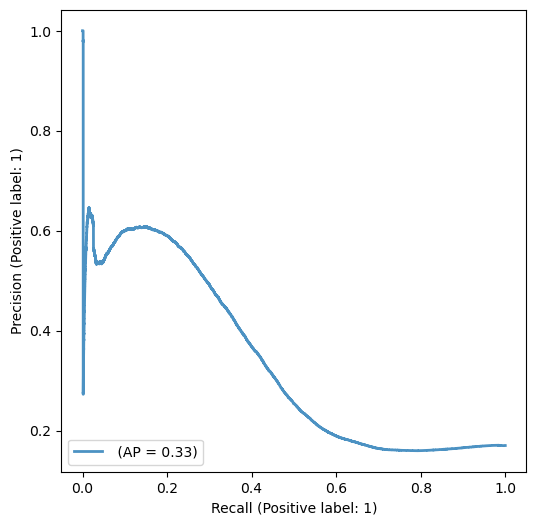

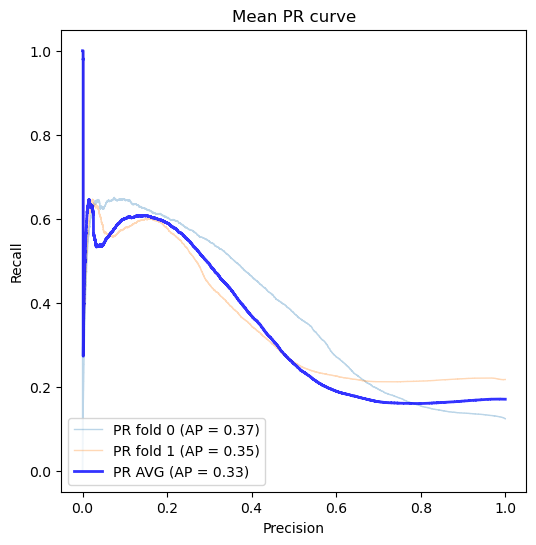

Plot for B with data raw to compare normalizations :
normalizzazione: Z-score


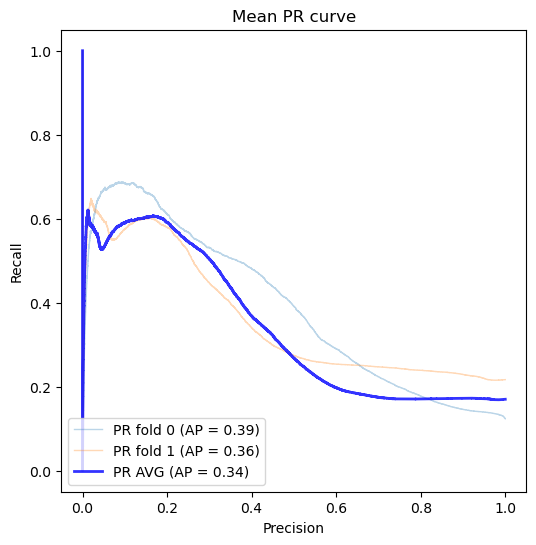

Plot for B with data raw to compare normalizations :
normalizzazione: EQ-hist


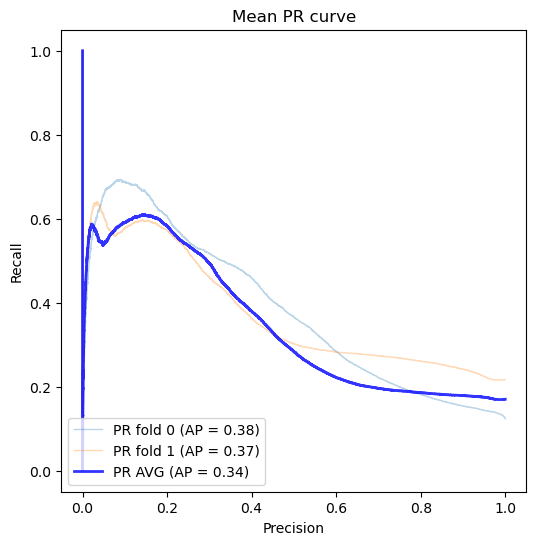

Plot for B with data raw to compare normalizations :
normalizzazione: CLAHE


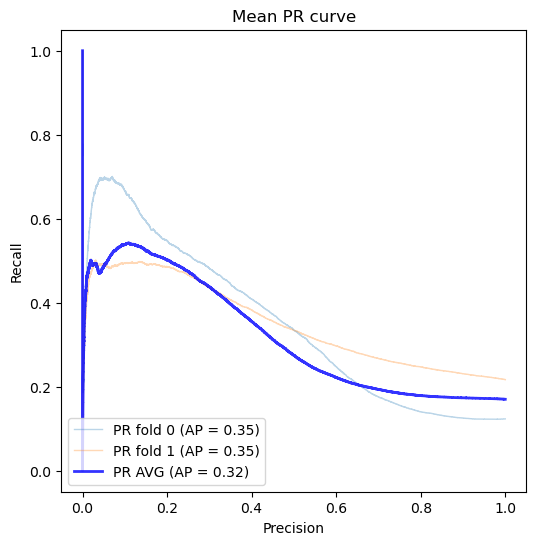

Plot for M with data raw to compare normalizations :
normalizzazione: 


C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to 

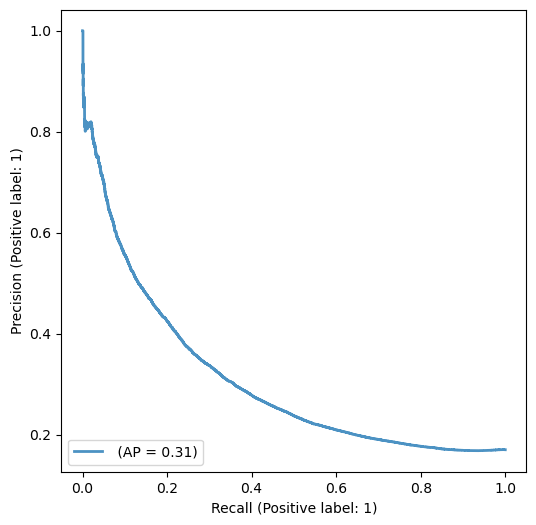

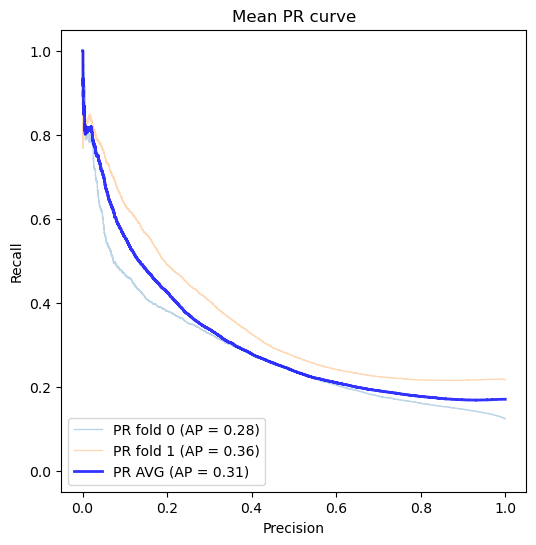

Plot for M with data raw to compare normalizations :
normalizzazione: Z-score


C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to 

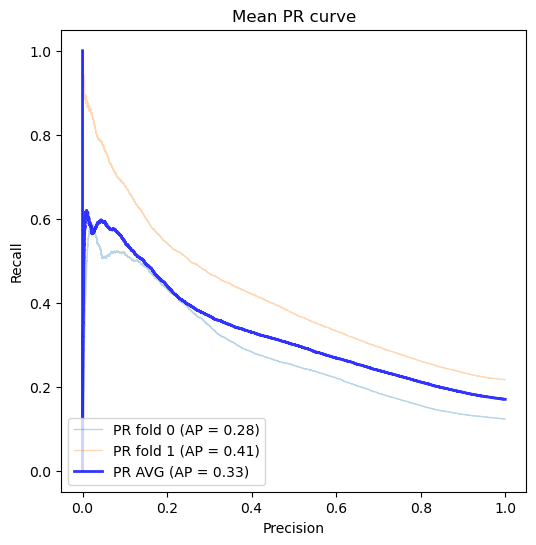

Plot for M with data raw to compare normalizations :
normalizzazione: EQ-hist


C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to 

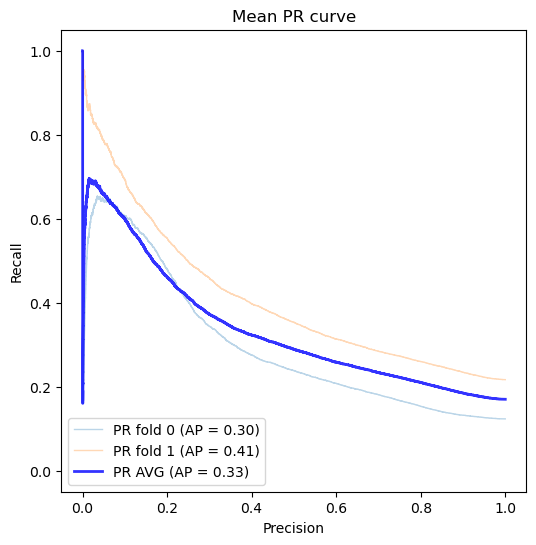

Plot for M with data raw to compare normalizations :
normalizzazione: CLAHE


C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to 

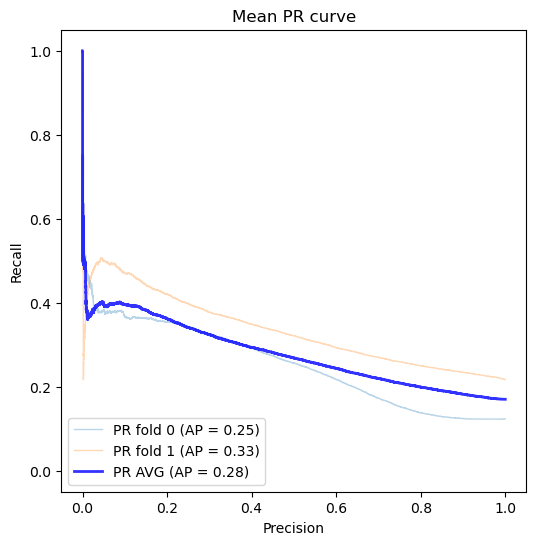


Z-score
EQ-hist
CLAHE
Plot for R with data thickness to compare normalizations :
normalizzazione: 


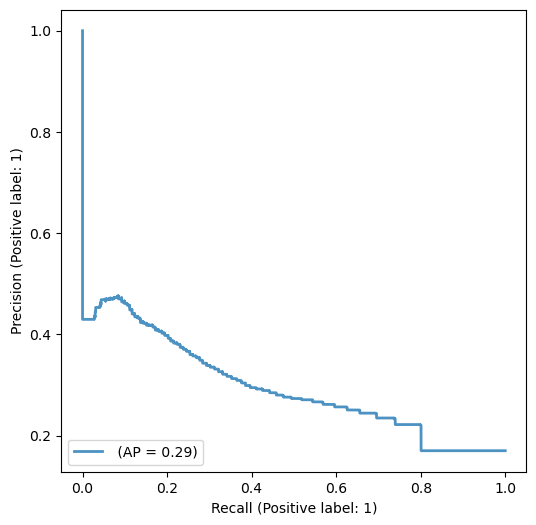

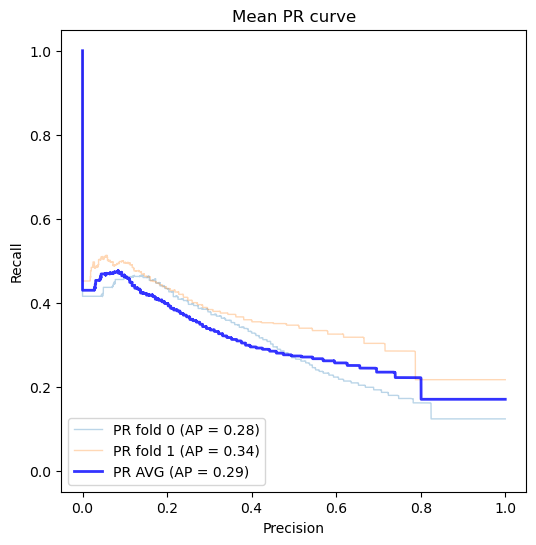

Plot for R with data thickness to compare normalizations :
normalizzazione: Z-score


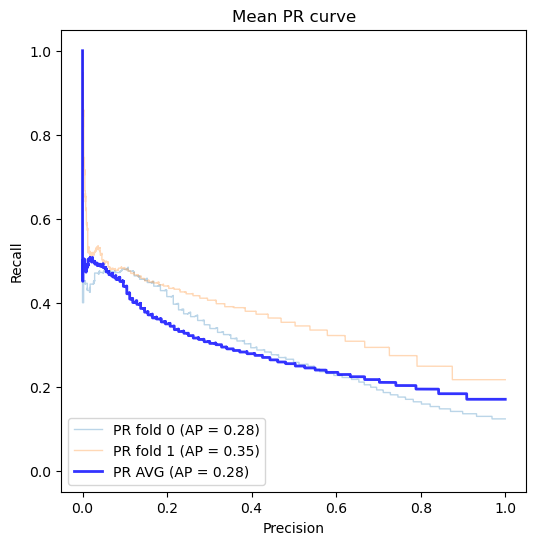

Plot for R with data thickness to compare normalizations :
normalizzazione: EQ-hist


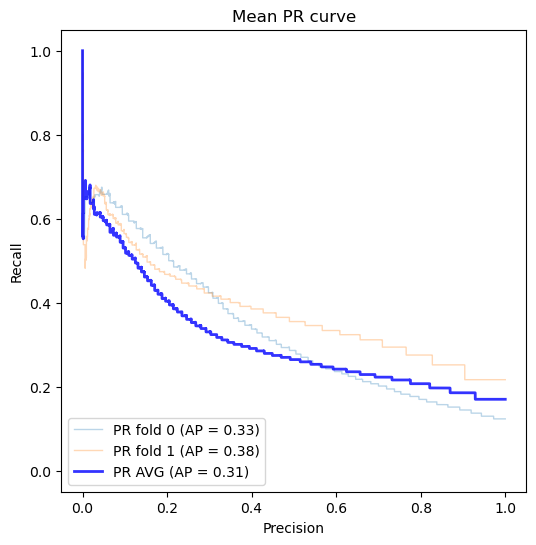

Plot for R with data thickness to compare normalizations :
normalizzazione: CLAHE


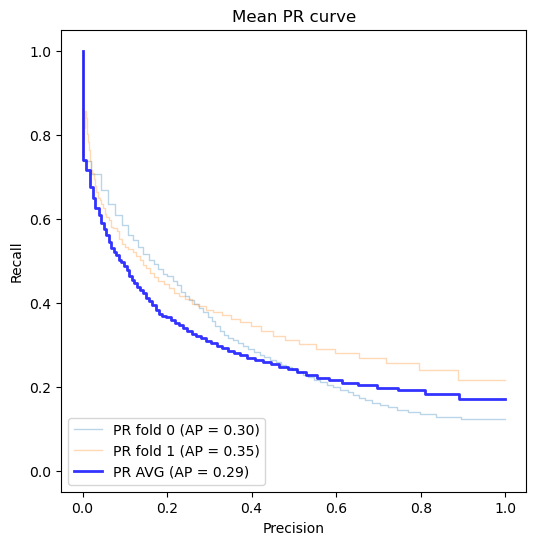

Plot for B with data thickness to compare normalizations :
normalizzazione: 


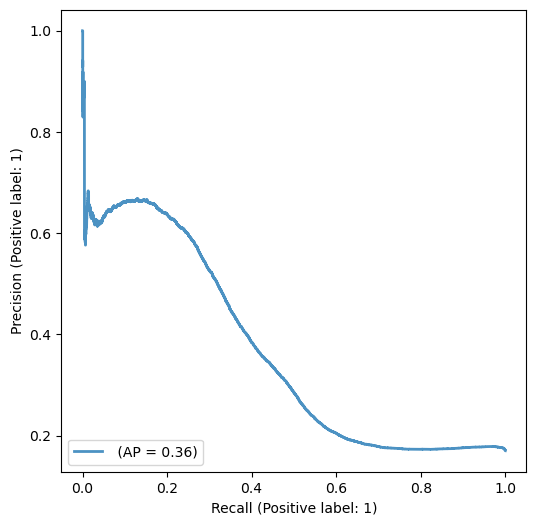

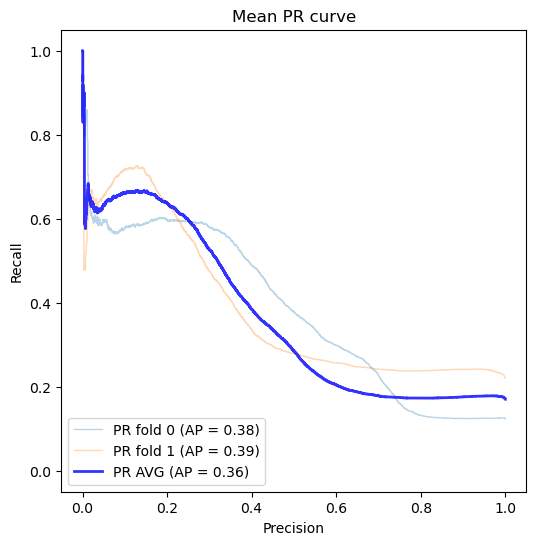

Plot for B with data thickness to compare normalizations :
normalizzazione: Z-score


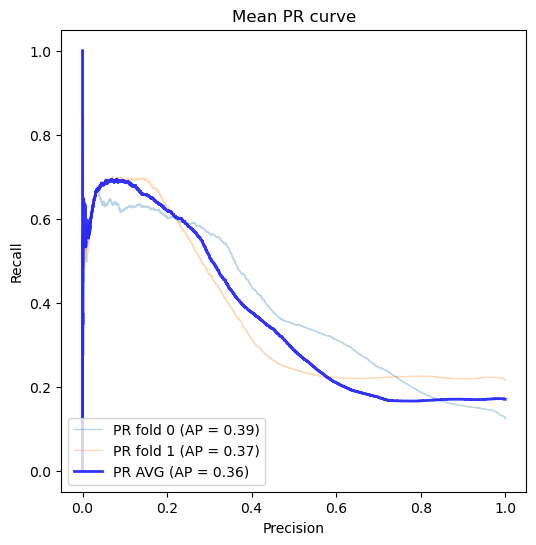

Plot for B with data thickness to compare normalizations :
normalizzazione: EQ-hist


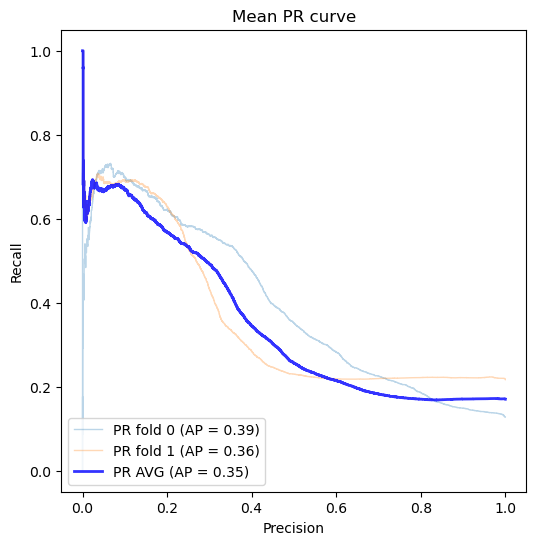

Plot for B with data thickness to compare normalizations :
normalizzazione: CLAHE


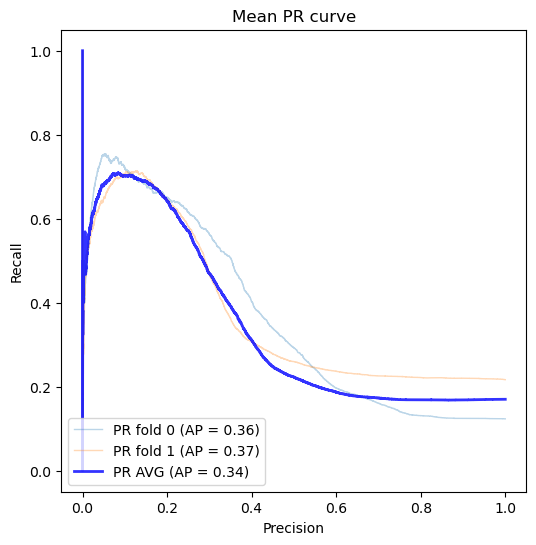

Plot for M with data thickness to compare normalizations :
normalizzazione: 


C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to 

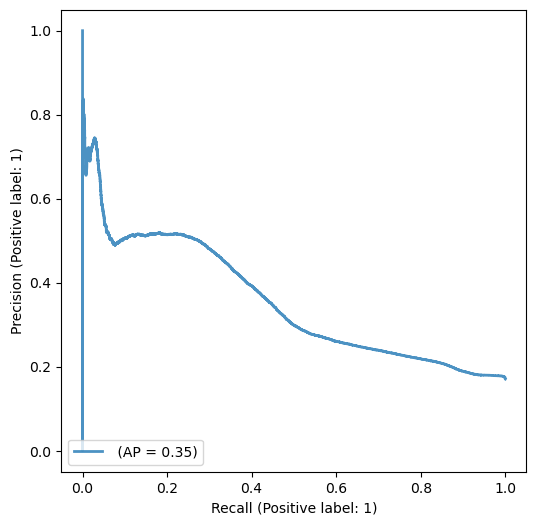

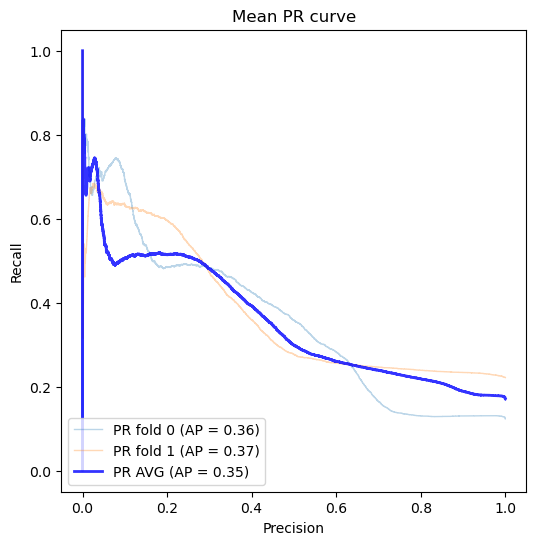

Plot for M with data thickness to compare normalizations :
normalizzazione: Z-score


C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


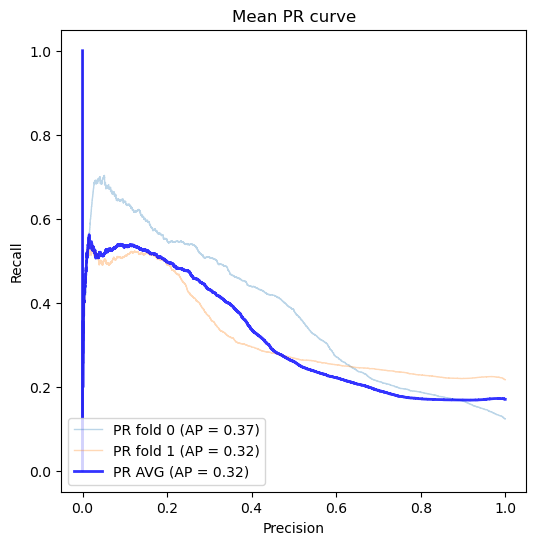

Plot for M with data thickness to compare normalizations :
normalizzazione: EQ-hist


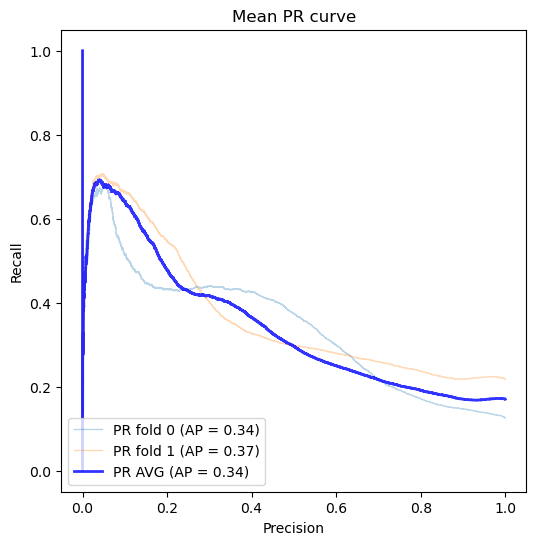

Plot for M with data thickness to compare normalizations :
normalizzazione: CLAHE


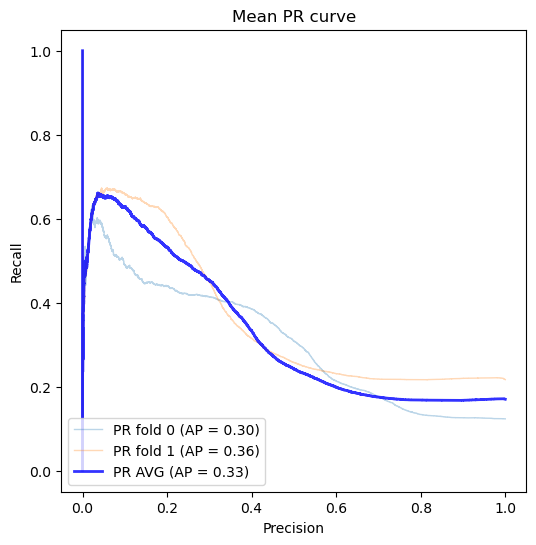

In [47]:
modes = ['raw','thickness']
figs = []


norms = ['','Z-score','EQ-hist','CLAHE']
# models = [RandomForestClassifier,GaussianNB,SVC(gamma='auto')]
# names = ['RF','NB','SVM']
# params = [None,{
#         'var_smoothing': smooth,
#     }, None]
models = [RandomForestClassifier,GaussianNB,clf]
names = ['RF','NB','SVM']
params = [{
            'n_estimators': 60,
        },{
        'var_smoothing': 1,
    },None]

for mode in modes:
    Xs = []
    ys = []
    for norm in norms:
        X,y = getBalancedXYData(mode = mode,normmode = norm)
        Xs.append(X)
        ys.append(y)
    # For mode = mode
    for j,model in enumerate(models):
        param = params[j]
        name = names[j]
        fig2, ax2 = plt.subplots(figsize=(6, 6))
        kf = KFold(n_splits=2, shuffle=False)
        for i in range(len(Xs)):
            X = Xs[i]
            y = ys[i]
            print(f'Plot for {name[j]} with data {mode} to compare normalizations :')
            print(f'normalizzazione: {norms[i]}')
            scores = score_model_PR(model,X,y, params = param, cv=kf,plotMatrix = False,plotROC = True,setTreshold = False,ax2 = ax2,modelname = name,label = norms[i])
            #scores = score_model_ROC(model,X,y,params = param, cv=kf,plotMatrix = False, plotROC = True,ax2 = ax2,modelname = name)
        ax2.legend(loc="upper right")
        ax2.set_title(f"PR curve with data type: {mode}, model: {names[j]}")
        ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
        figs.append(fig2)

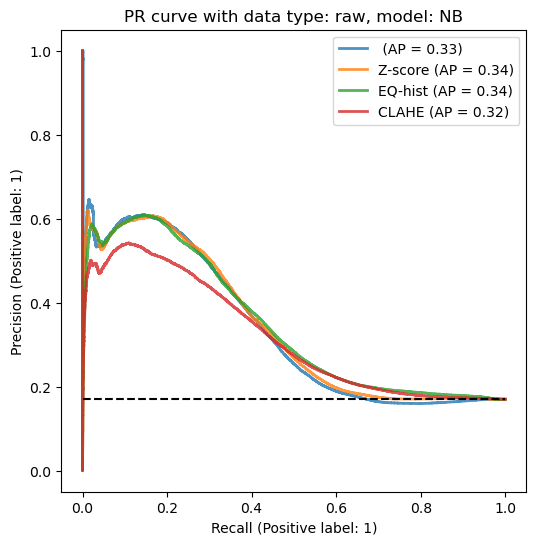

In [48]:
figs[1]

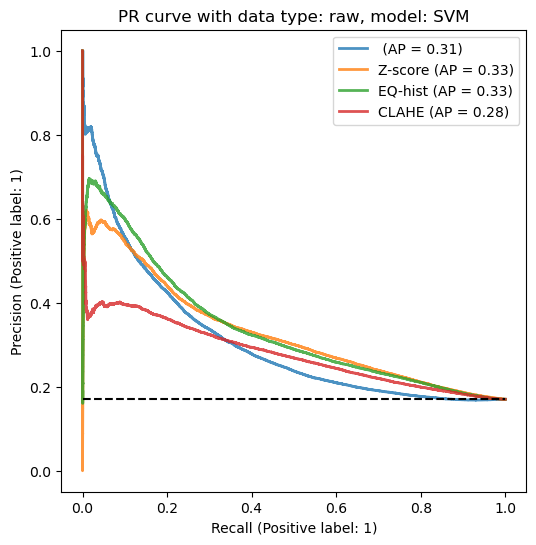

In [49]:
figs[2]

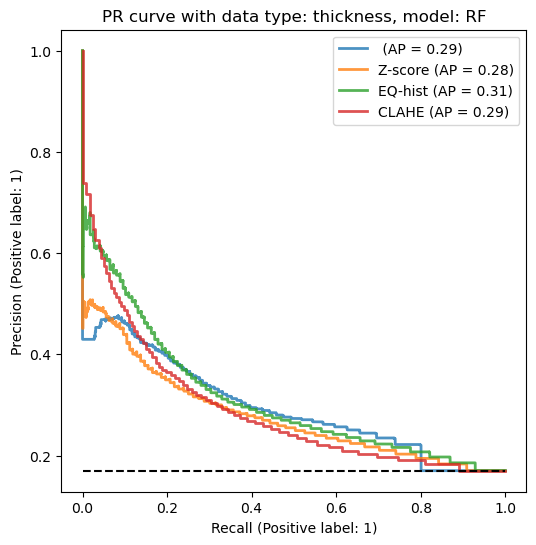

In [50]:
figs[3]

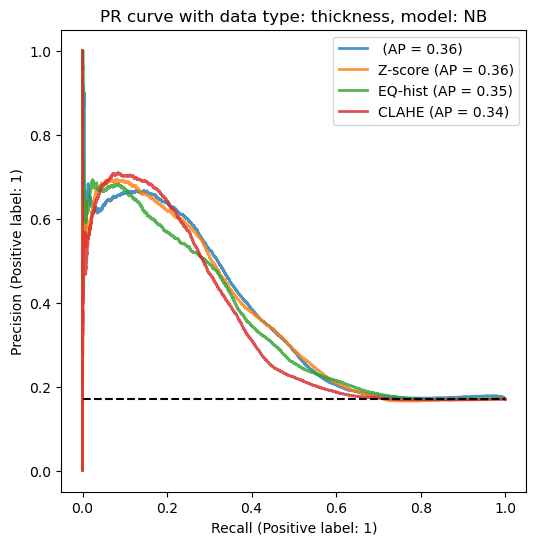

In [51]:
figs[4]

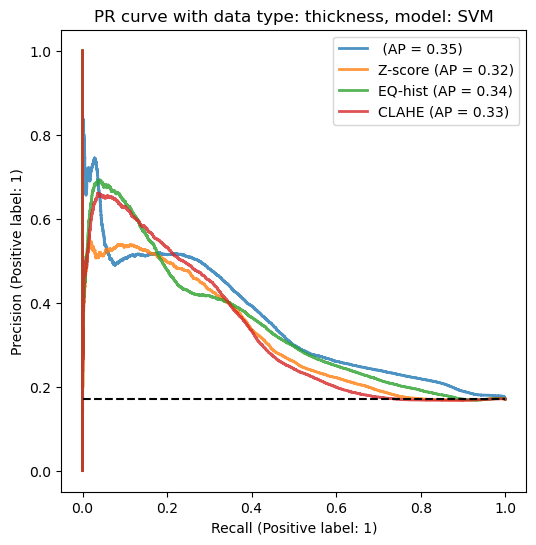

In [52]:
figs[5]

# Which data is better? thickness or raw data?
=> ROC dei tre modelli (Cval con optimal hyperparams)
=> PR dei tre modelli (Cval con optimal hyperparams)

In [ ]:
modes = ['raw','thickness']
figs = []


norms = ['','Z-score','EQ-hist','CLAHE']
# models = [RandomForestClassifier,GaussianNB,SVC(gamma='auto')]
# names = ['RF','NB','SVM']
# params = [None,{
#         'var_smoothing': smooth,
#     }, None]
models = [RandomForestClassifier,GaussianNB,clf]
names = ['RF','NB','SVM']
params = [{
            'n_estimators': 60,
        },{
        'var_smoothing': 1,
    },None]

EQ-hist

Plot for RF comparing the two data sources:


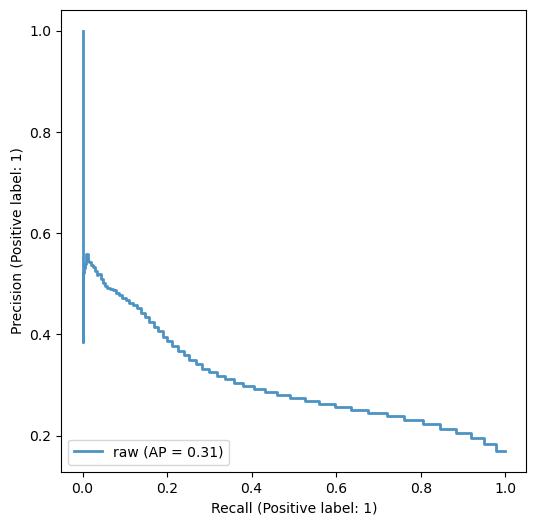

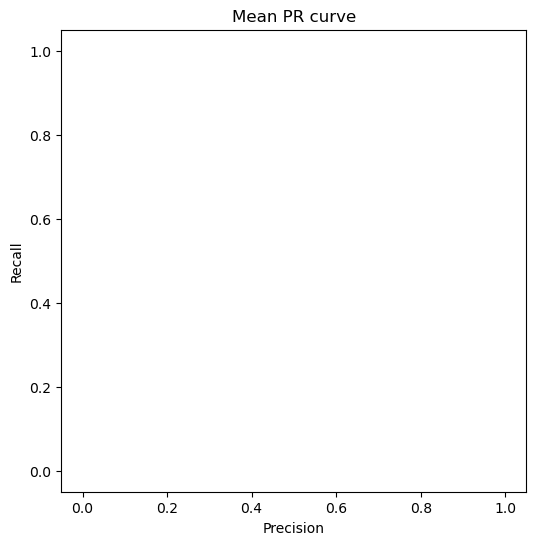

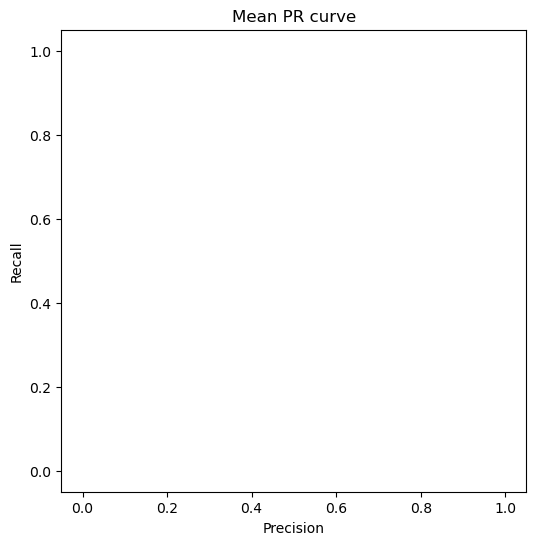

Plot for NB comparing the two data sources:


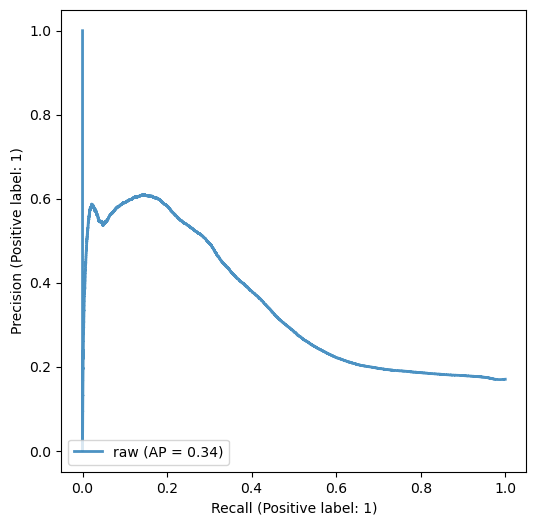

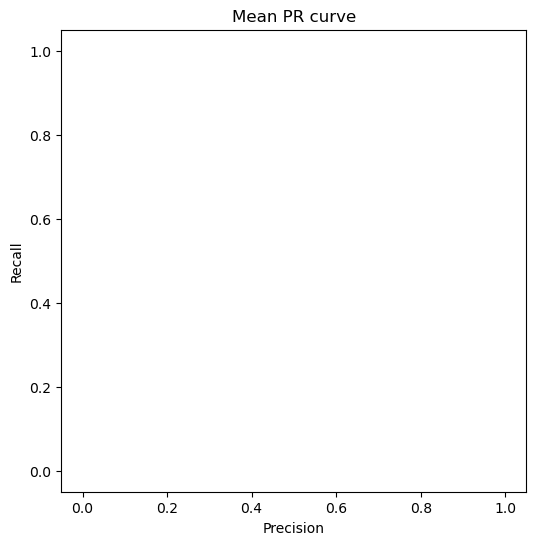

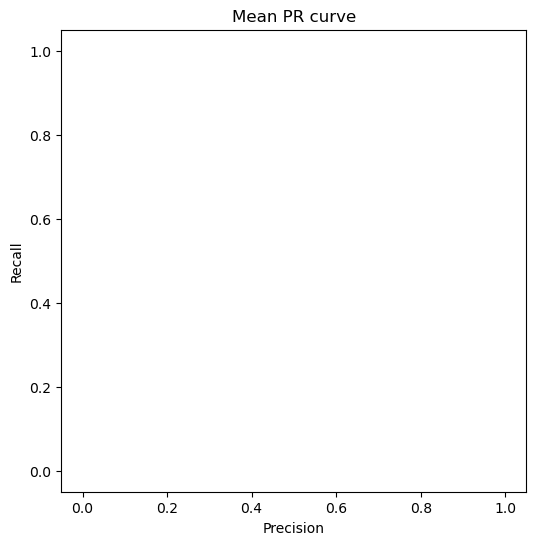

Plot for SVM comparing the two data sources:


C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to 

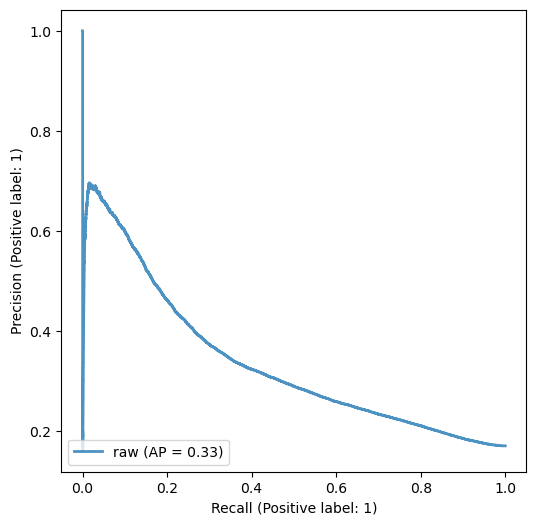

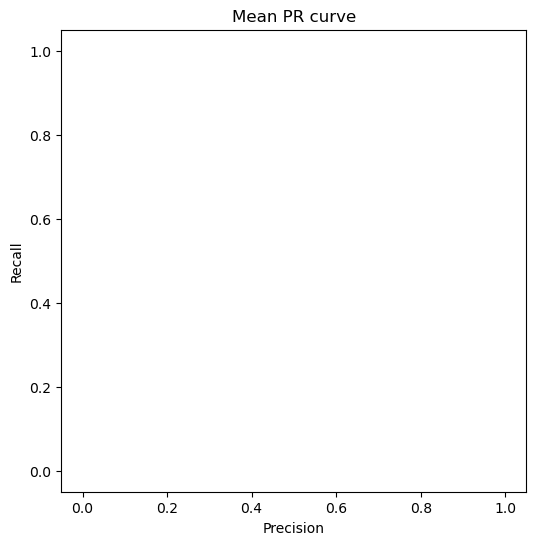

C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\line\.conda\envs\OCT\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to 

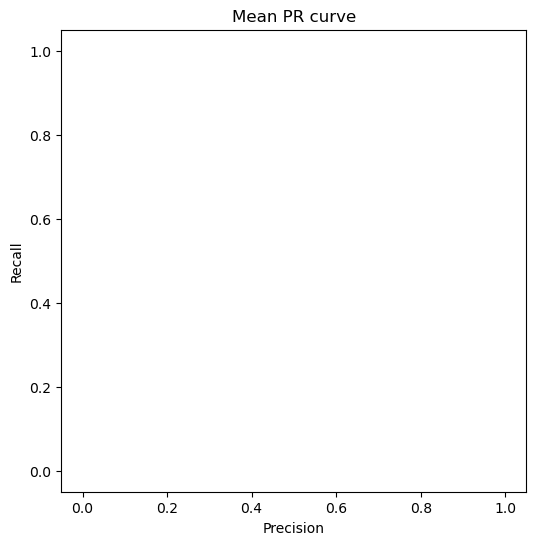

In [53]:
#PLOT PR CURVE FOR THE TWO DATASETS FOR A GIVEN MODEL
Xr,yr = getBalancedXYData(mode = 'raw',normmode = 'EQ-hist')
Xt,yt = getBalancedXYData(mode = 'thickness',normmode = '')
modes = ['raw','thickness']
figs = []

clf = CalibratedClassifierCV(LinearSVC(tol =  1e-5,random_state = 0))
models = [RandomForestClassifier,GaussianNB,clf]
names = ['RF','NB','SVM']
params = [{
            'n_estimators': 60,
        },{
        'var_smoothing': 1,
    },None]

for j,model in enumerate(models):
    param = params[j]
    name = names[j]
    fig2, ax2 = plt.subplots(figsize=(6, 6))
    kf = KFold(n_splits=2, shuffle=False)
    print(f'Plot for {names[j]} comparing the two data sources:')
    scores = score_model_PR(model,Xr,yr, params = param, cv=kf,plotMatrix = False,plotROC = False,setTreshold = False,ax2 = ax2,modelname = name,label = 'raw')
    scores = score_model_PR(model,Xt,yt, params = param, cv=kf,plotMatrix = False,plotROC = False,setTreshold = False,ax2 = ax2,modelname = name,label = 'thickness')
    ax2.legend(loc="upper right")
    ax2.set_title(f"{names[j]} perfomances on the two data sources")
    ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
    figs.append(fig2)

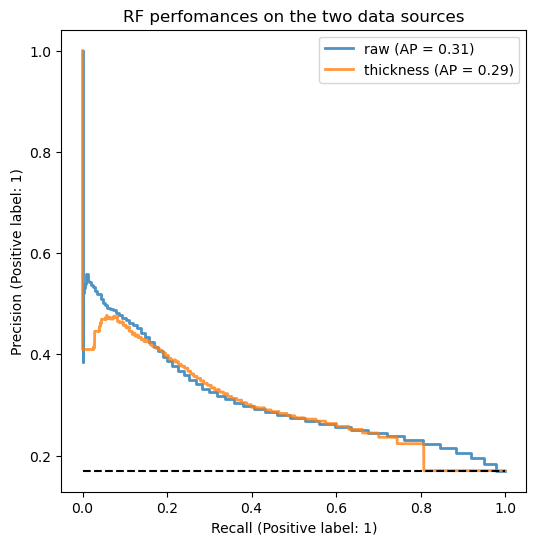

In [54]:
figs[0]

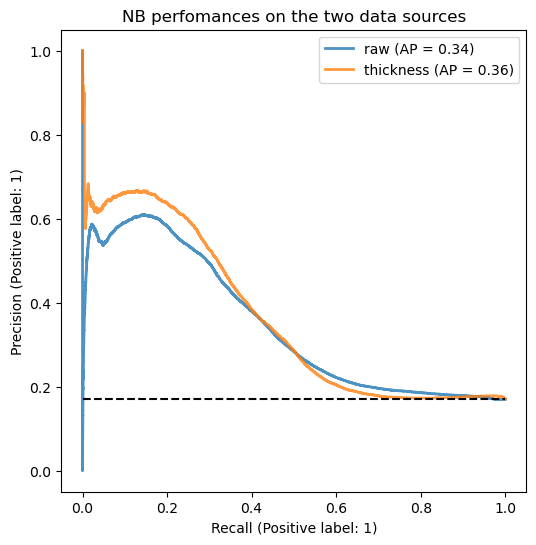

In [55]:
figs[1]

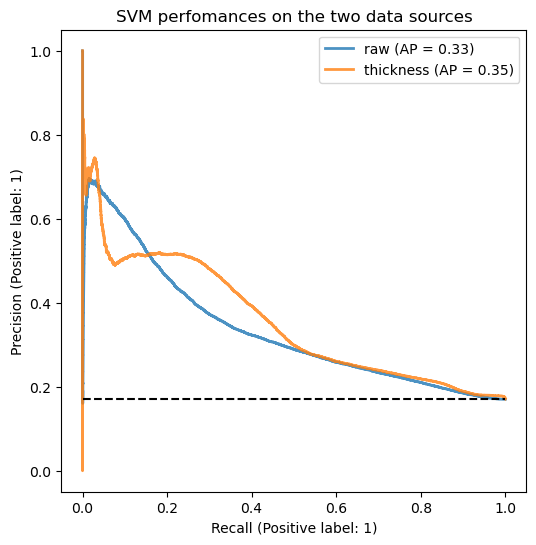

In [56]:
figs[2]

In [70]:
y.mean()

0.1700923859126984

In [ ]:
from sklearn.svm import SVC
Cs = [1.0,1.5,2,5]
for C in Cs:
    model = SVC(C = C,probability = True,cache_size = 4000)
    scores = score_model_PR(model,Xt,yt, params = None, cv=kf,plotMatrix = False,plotROC = True,setTreshold = False,ax2 = None,modelname = name,label = 'thickness')

# Context increase tests:
# increasing context it's easy: we need to take

In [5]:
# Create base dataset
mode = 'thickness'
norm = 'EQ-hist'
X,y = getBalancedXYData(mode = mode,normmode = norm)

EQ-hist


In [6]:
X.shape

(193536, 5)

In [4]:
def increaseContex(X,y,stride, width):
    # Only odd width, the central column is also the labeling column
    assert width%2 == 1
    xmin = X.shape[1]
    # size of flattened vector
    Xnew = np.empty((0,width*xmin)) 
    # stack flattened vectors
    for i in range(0,len(X)-width +1,stride):
        wdw = X[i:i+width]
        xnew = np.reshape(wdw, (1,-1))
        Xnew = np.vstack((Xnew,xnew))
    ynew = y[width//2:len(y) - width//2:stride]
    return Xnew,ynew


def getXYdataContext(paths, mode,rootpath = None,normmode = 'Z-score',stride = 15, width = 25):
    def normalize(img,normmode = 'Z-score'):
        if normmode == 'Z-score':
            img = dataset.z_score(img)
        elif normmode == 'EQ-hist': 
            img = exposure.equalize_hist(img)
        elif normmode == 'CLAHE':
            #TO Implement normalization by zone
            # Adaptive Equalization
            img = exposure.equalize_adapthist(img/max((img.max(),-img.min())), clip_limit=0.03)            
        return img
    
    def getxmin(rootpath):
        themin = 100000
        allpaths =  glob.glob(os.path.join(rootpath,'amdP' + '\*.pickle')) + glob.glob(os.path.join(rootpath,'controlP' + '\*.pickle'))
        for path in allpaths:
            PPocts = pd.read_pickle(path)
            for PPoct in PPocts:
                xnew = PPoct.image()
                if(xnew.shape[0] < themin):
                    themin = xnew.shape[0]
        return themin
    print(normmode)
    if mode == 'thickness':
        xmin = 5 
    elif mode =='raw':
        xmin = getxmin(rootpath)
        
    X = np.empty((0,xmin*width))
    y = np.empty((0,))
    for path in paths:
        PPocts = pd.read_pickle(path)
        for PPoct in PPocts:
            if mode == 'thickness':
                xnew = np.transpose(normalize(PPoct.thicknesses(),normmode = normmode))
            elif mode == 'raw':
                xnew = np.transpose(normalize(PPoct.image(),normmode = normmode))
                xnew = cv2.resize(xnew, dsize=(xmin,768 ))
            ynew = PPoct.label()
            
            
            xnew,ynew = increaseContex(xnew,ynew,stride, width)
            #stack vertically the x and y
            X = np.vstack((X,xnew))
            y = np.hstack((y,ynew))
    return X,y  #,groupvect

def getBalancedXYDataContext(mode = 'thickness',normmode = 'EQ-hist',stride = 15, width = 25):
    rootpath = r'C:\Users\line\Desktop\Mauro\3_DataSet\OCT_balanced'
    paths = glob.glob(os.path.join(rootpath,'controlP' + '\*.pickle'))
    paths2 = glob.glob(os.path.join(rootpath,'amdP' + '\*.pickle'))
    merged = [[paths[2*i],paths[2*i+1],paths2[i]]  for i in range(len(paths2))]
    flattenedmerged = [item for sublist in merged for item in sublist]
    paths = flattenedmerged
    return getXYdataContext(paths, mode = mode,rootpath = rootpath,normmode = normmode,stride = stride, width = width)

In [19]:
X,y = getBalancedXYDataContext()

EQ-hist


In [20]:
X.shape

(12600, 125)

In [21]:
y.shape

(12600,)

EQ-hist
(96516, 15)
width: 3


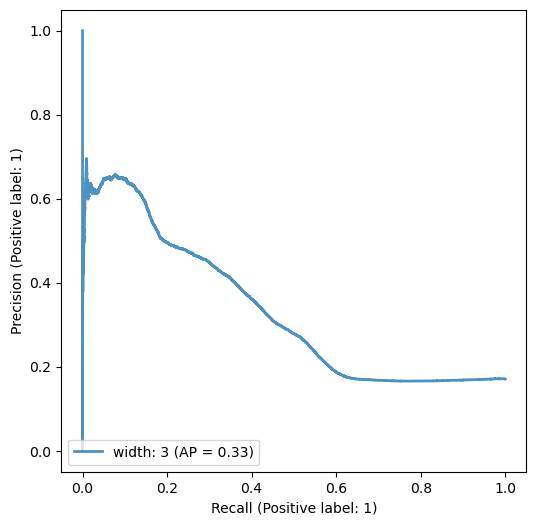

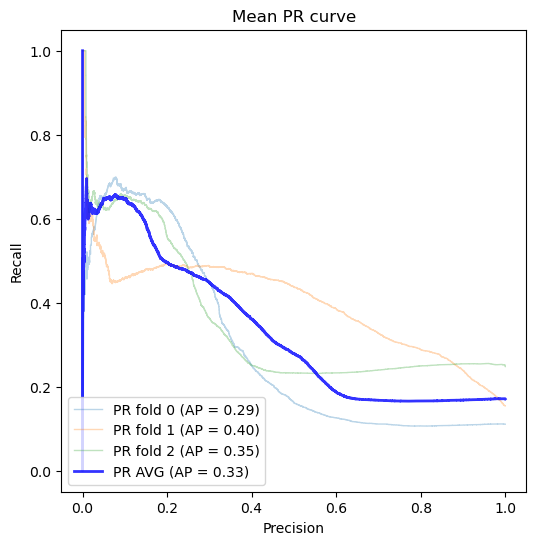

EQ-hist
(96264, 25)
width: 5


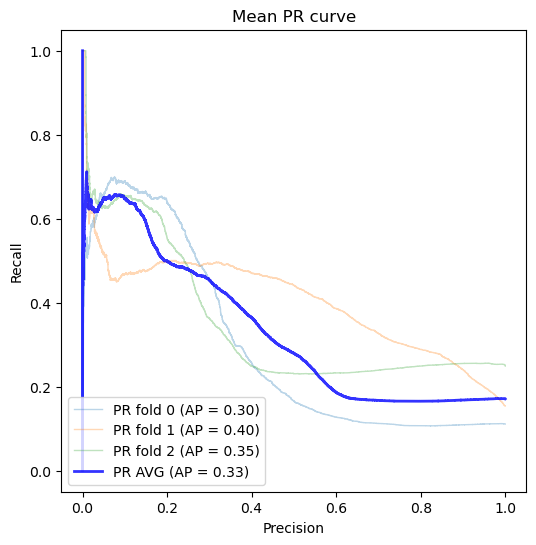

EQ-hist
(96012, 35)
width: 7


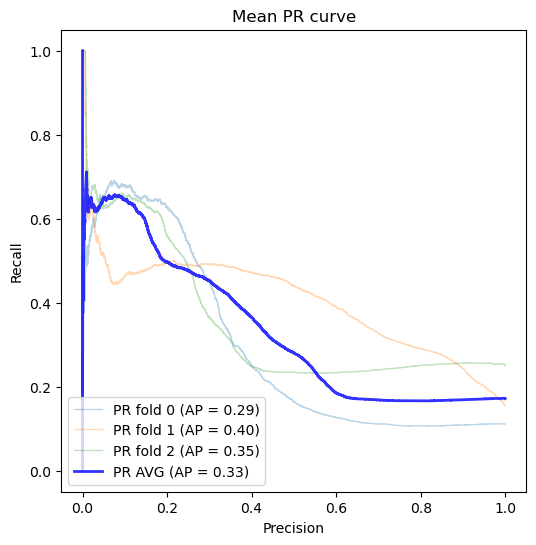

EQ-hist
(95760, 45)
width: 9


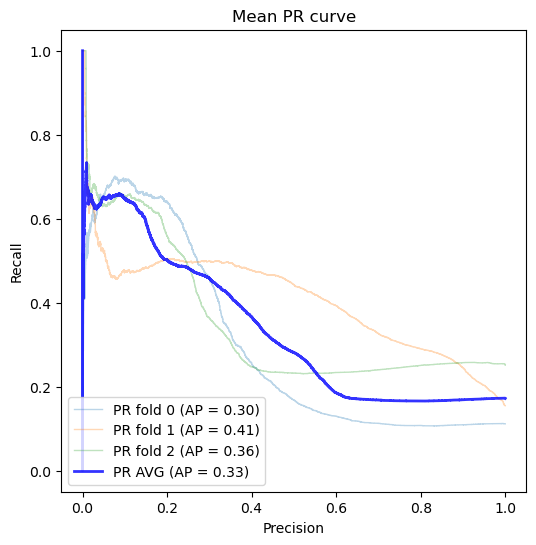

EQ-hist
(95256, 65)
width: 13


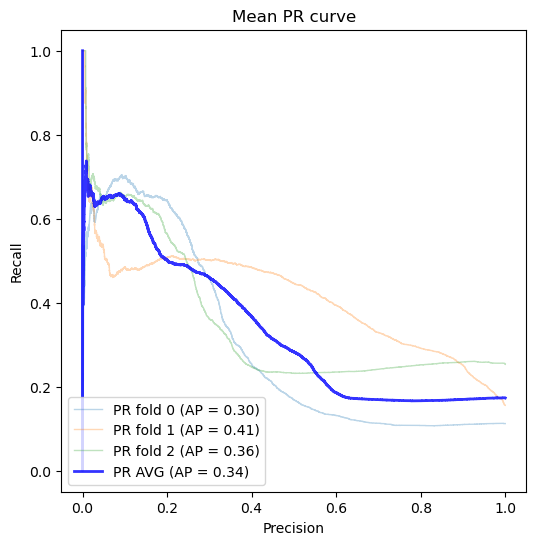

EQ-hist
(94752, 85)
width: 17


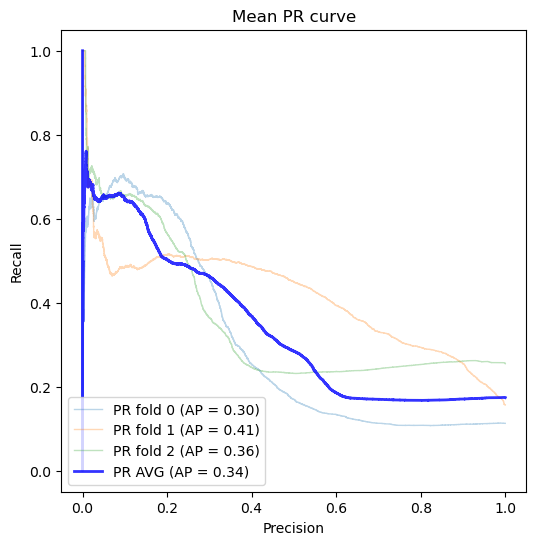

EQ-hist
(94248, 105)
width: 21


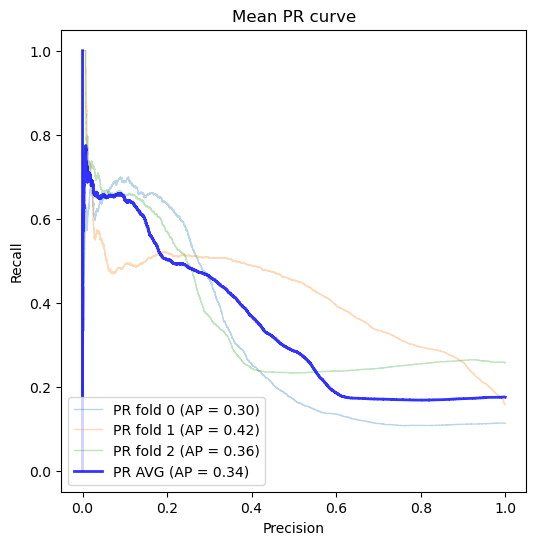

EQ-hist
(32004, 35)
width: 7


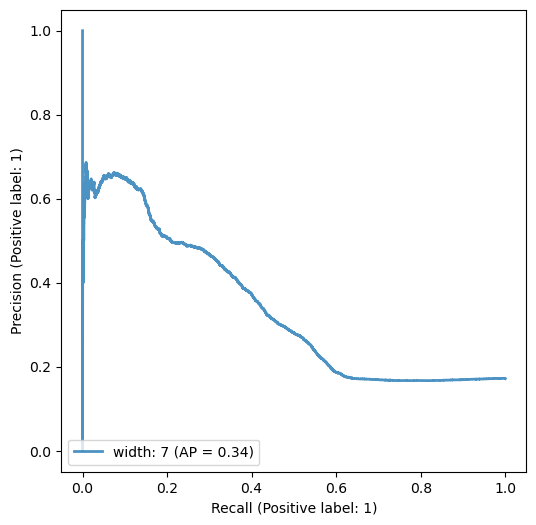

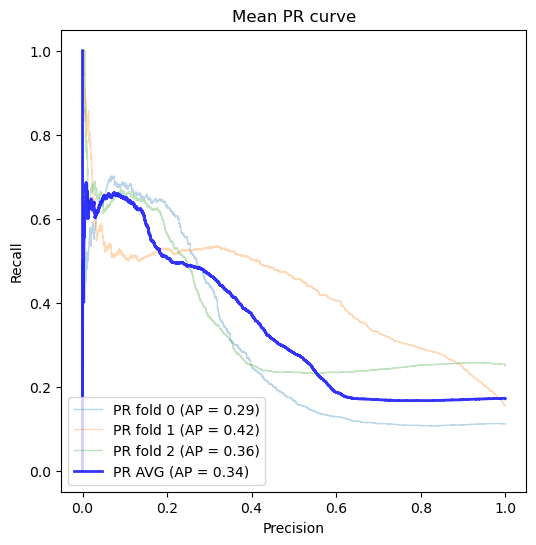

EQ-hist
(31752, 65)
width: 13


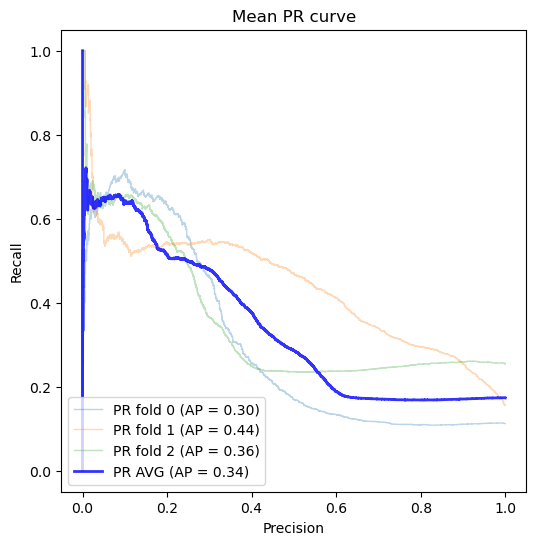

EQ-hist
(31500, 95)
width: 19


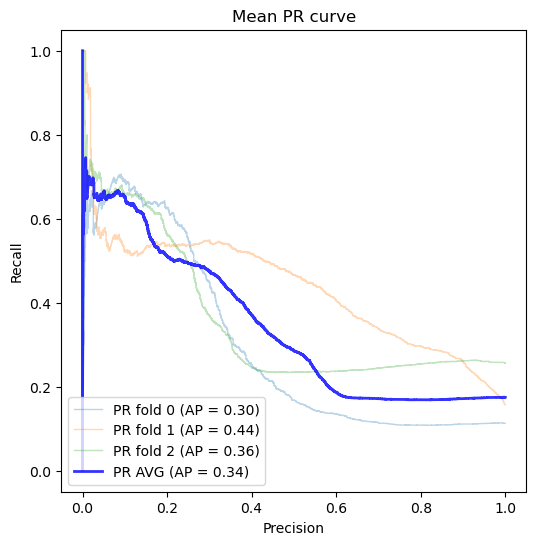

EQ-hist
(31248, 125)
width: 25


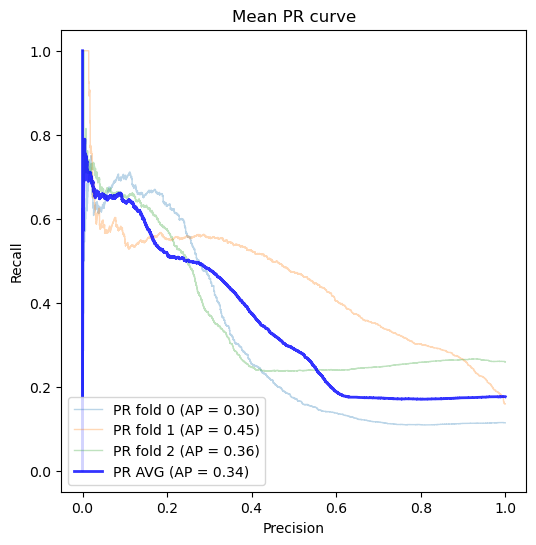

EQ-hist
(30744, 185)
width: 37


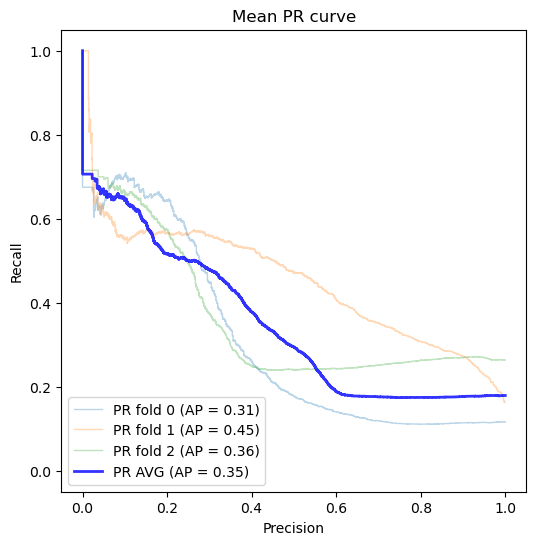

EQ-hist
(30240, 245)
width: 49


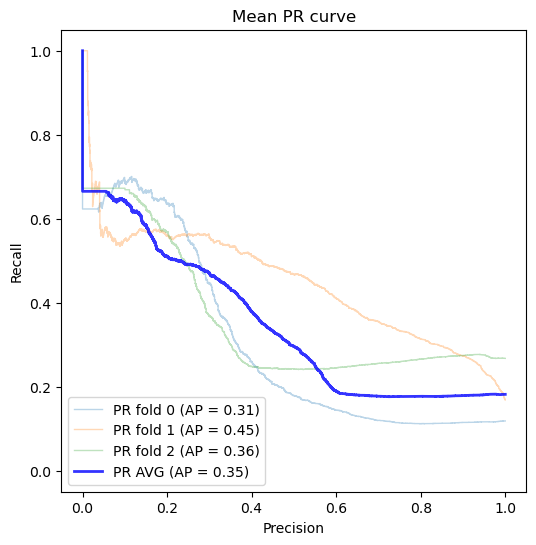

EQ-hist
(29736, 305)
width: 61


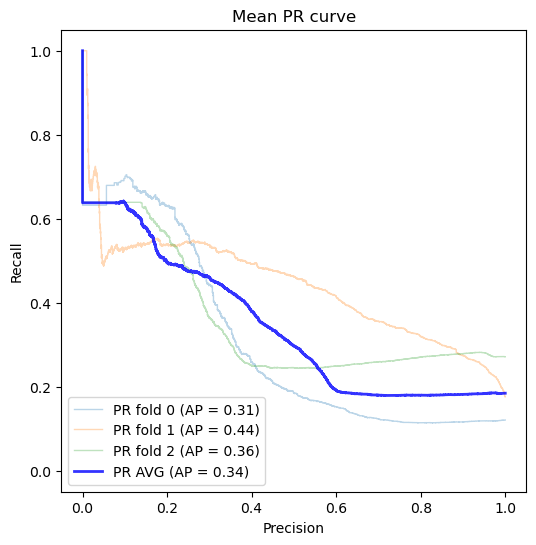

EQ-hist
(19152, 55)
width: 11


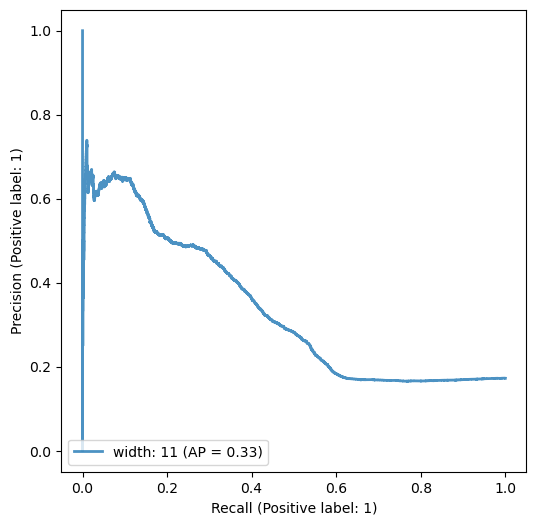

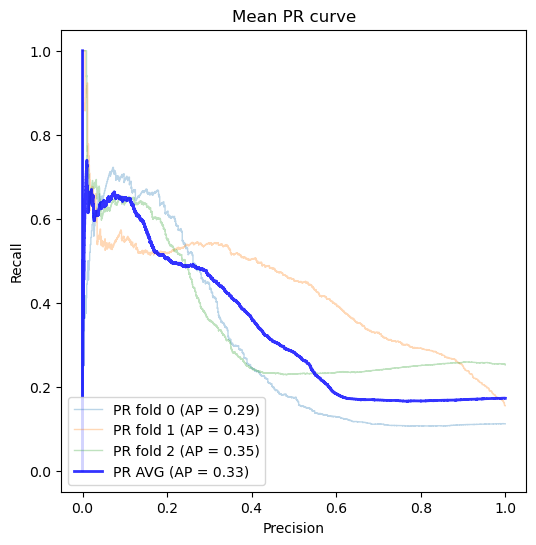

EQ-hist
(18900, 105)
width: 21


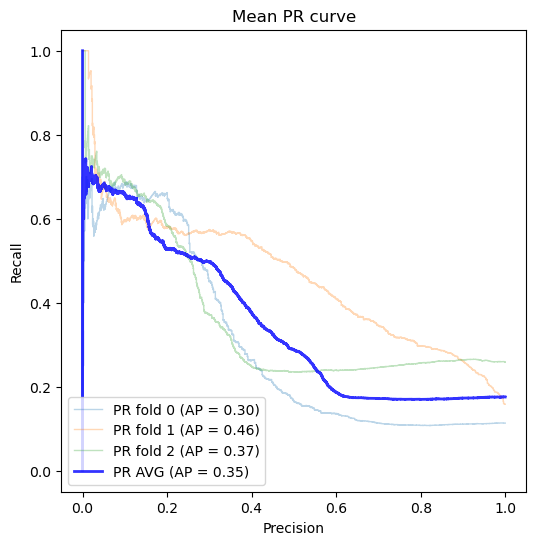

EQ-hist
(18648, 155)
width: 31


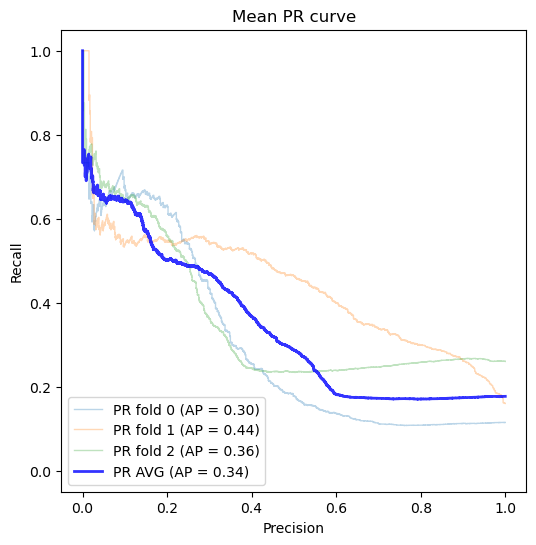

EQ-hist
(18396, 205)
width: 41


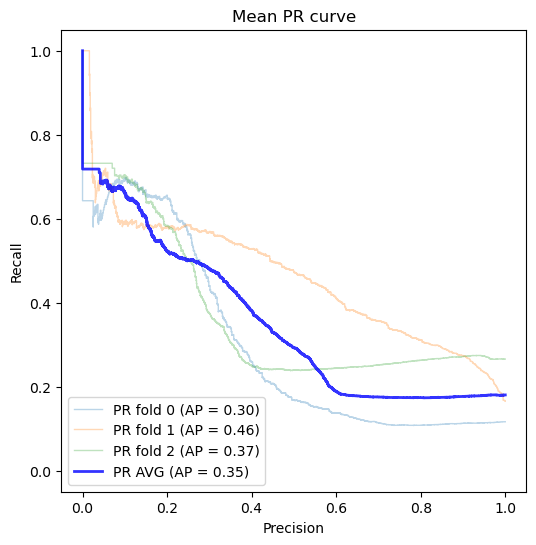

EQ-hist
(17892, 305)
width: 61


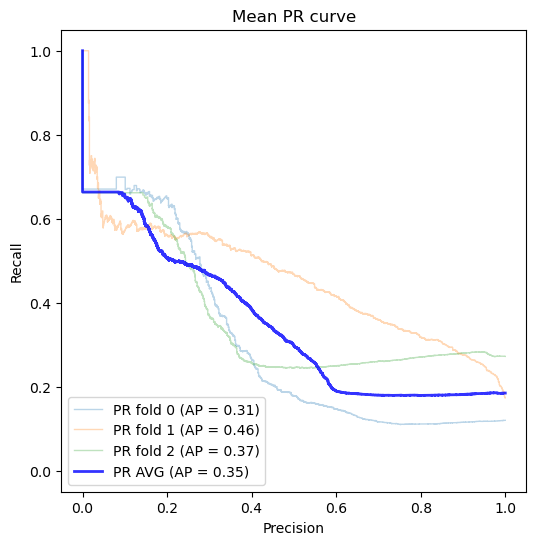

EQ-hist
(17388, 405)
width: 81


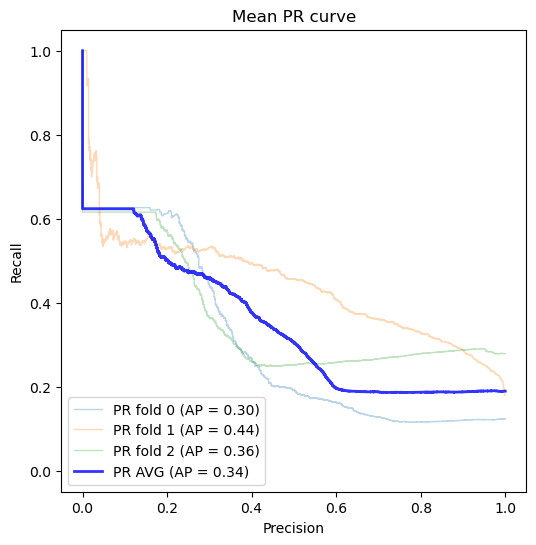

EQ-hist
(16884, 505)
width: 101


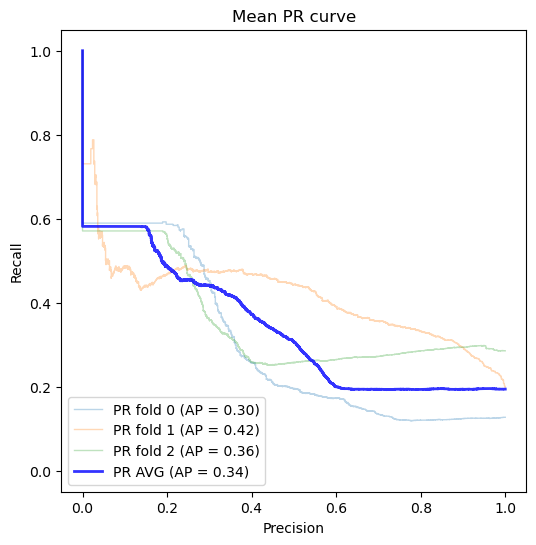

EQ-hist
(9576, 105)
width: 21


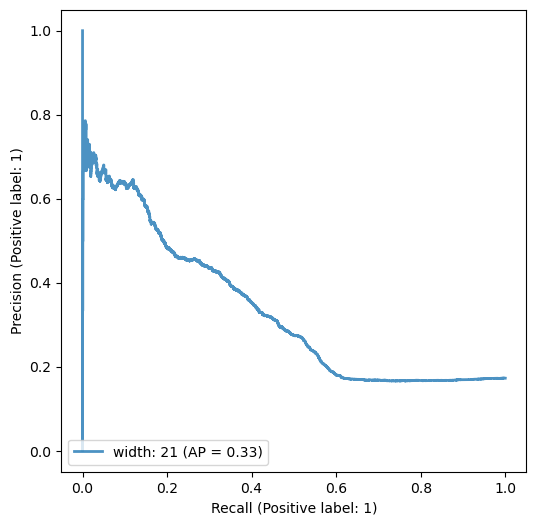

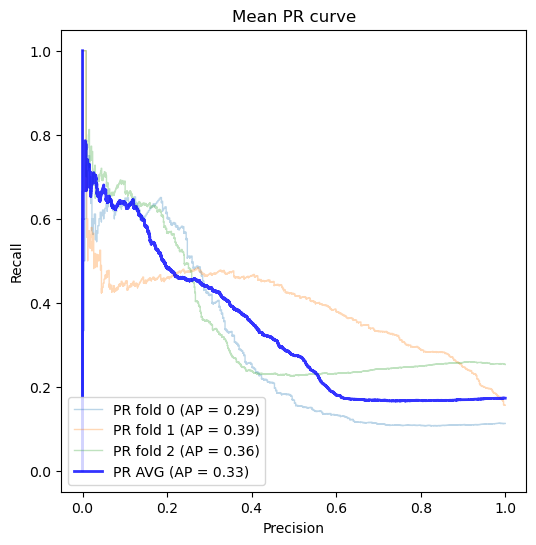

EQ-hist
(9324, 205)
width: 41


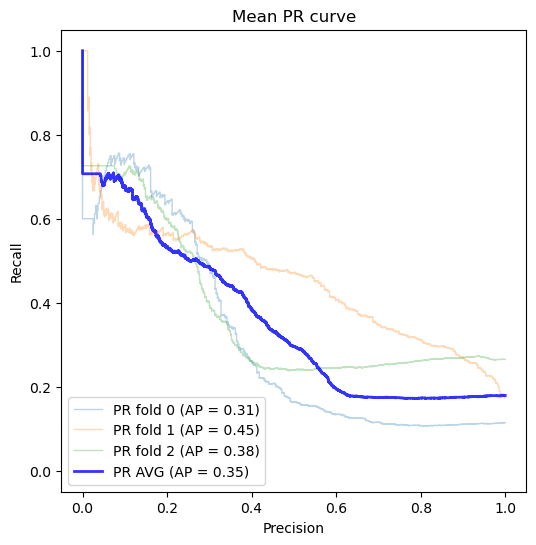

EQ-hist
(9072, 305)
width: 61


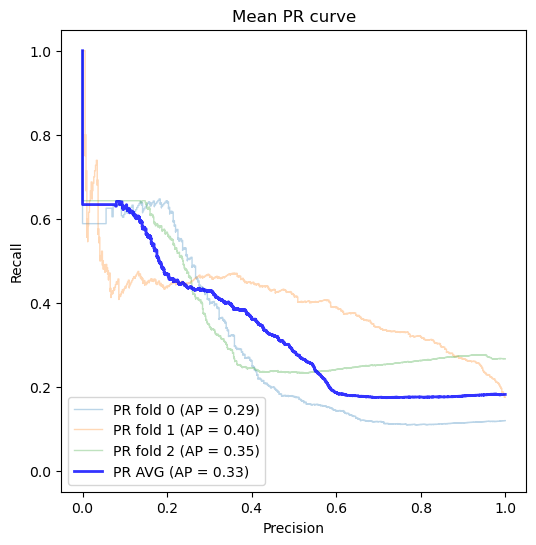

EQ-hist
(8820, 405)
width: 81


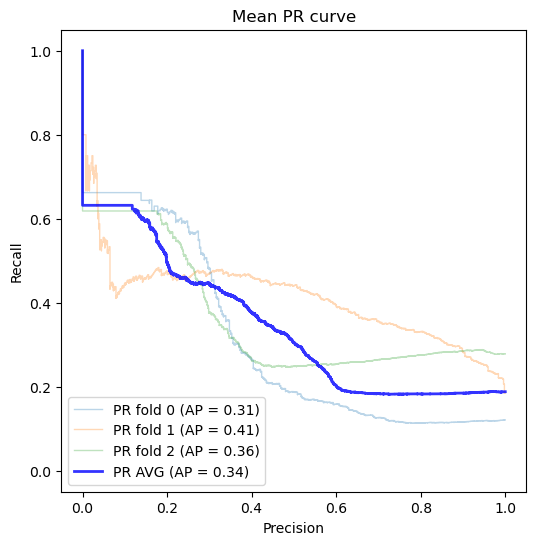

EQ-hist
(8316, 605)
width: 121


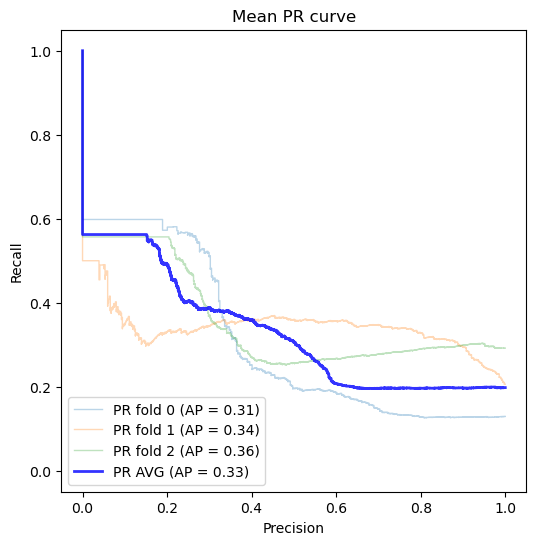

EQ-hist
(7812, 805)
width: 161


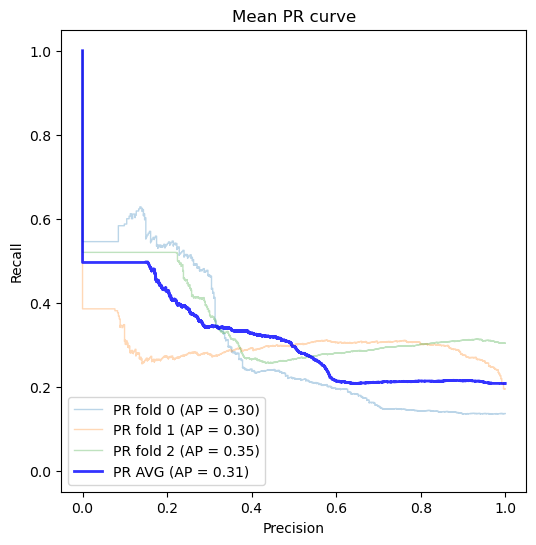

EQ-hist
(7308, 1005)
width: 201


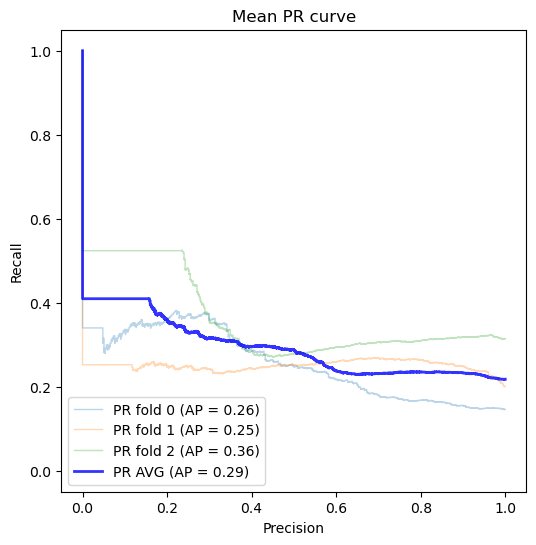

In [14]:
# widths = [1,5,10,20,50,100,150]

#widths = [101,111,121,131,141,151,161]
# stride = 1
strides = [2,6,10,20]
mode = 'thickness'
figs = []

kf = KFold(n_splits=3, shuffle=False)
param = {
        'var_smoothing': 1,
    }
for s in strides:
    fig2, ax2 = plt.subplots(figsize=(6, 6))
    widths = [int(1*s)+ 1,int(2*s) + 1,int(3*s)+ 1,int(4*s) + 1,int(6*s) +1 ,int(8*s)+1,int(10*s)+1]
    for w in widths:
        X,y = getBalancedXYDataContext(width = w,stride = s,mode =mode)
        print(X.shape)
        print(f'width: {w}')
        scores = score_model_PR(GaussianNB,X,y, params = param, cv=kf,plotMatrix = False,plotROC = True,setTreshold = False,ax2 = ax2,modelname = 'NB',label = f'width: {w}')
        #scores = score_model_ROC(model,X,y,params = param, cv=kf,plotMatrix = False, plotROC = True,ax2 = ax2,modelname = name)
    ax2.legend(loc="upper right")
    ax2.set_title(f"NB PR curve with data type: {mode}, stride: {s}")
    ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
    figs.append(fig2)

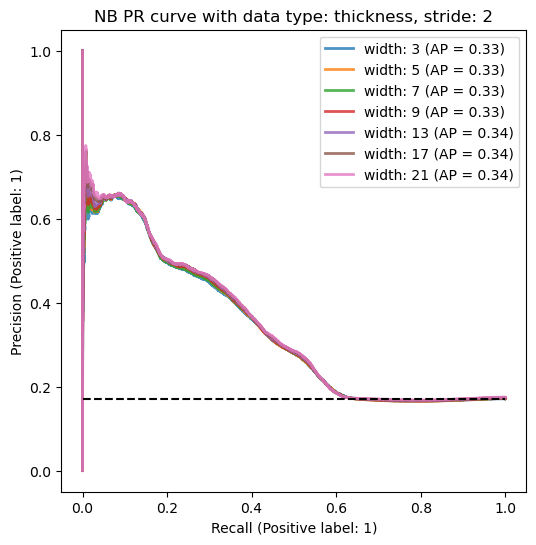

In [15]:
figs[0]

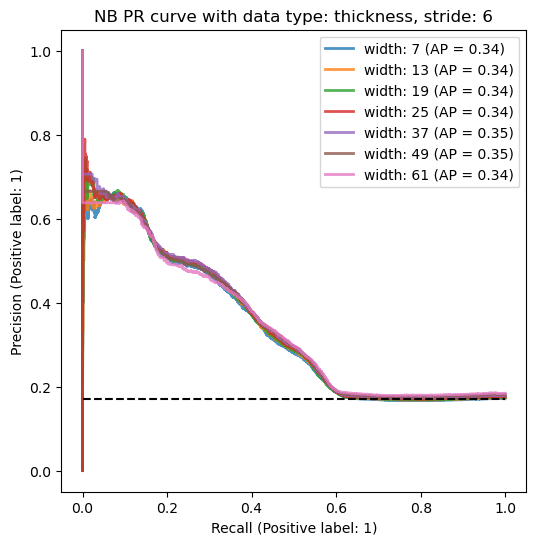

In [16]:
figs[1]

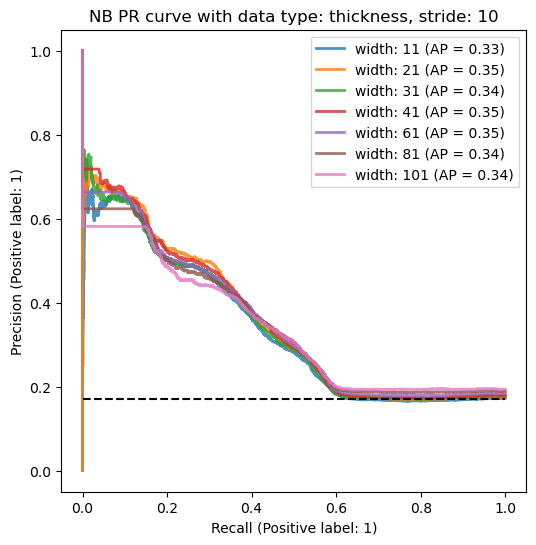

In [17]:
figs[2]

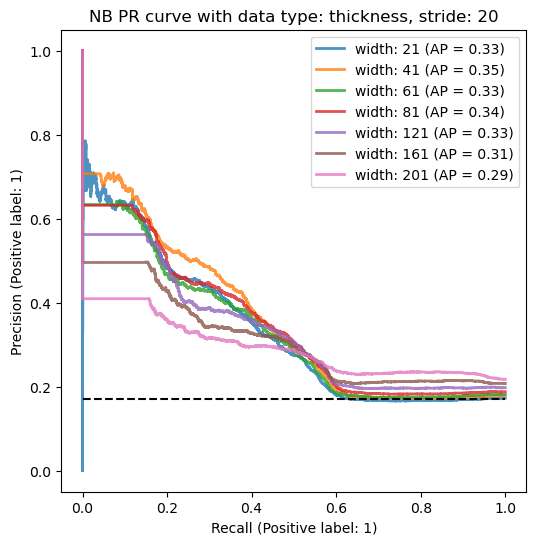

In [18]:
figs[3]

In [19]:
figs[4]

IndexError: list index out of range

EQ-hist
(193536, 70)
width: 1


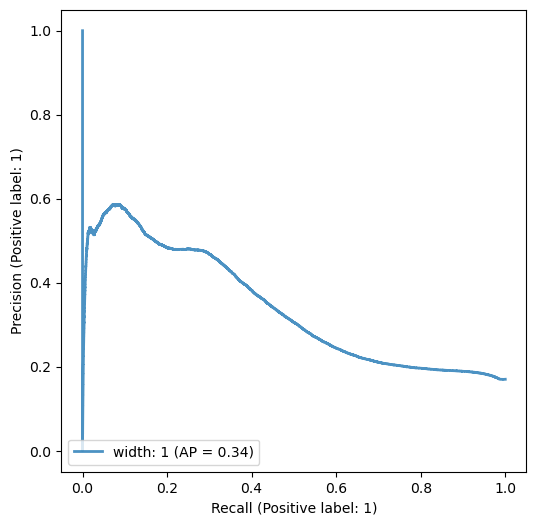

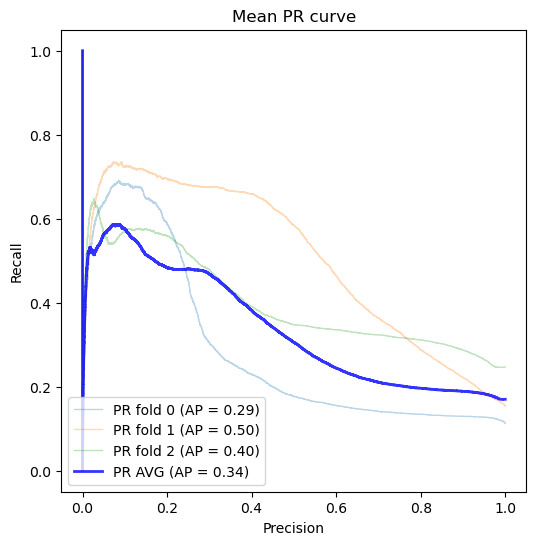

EQ-hist
(193032, 210)
width: 3


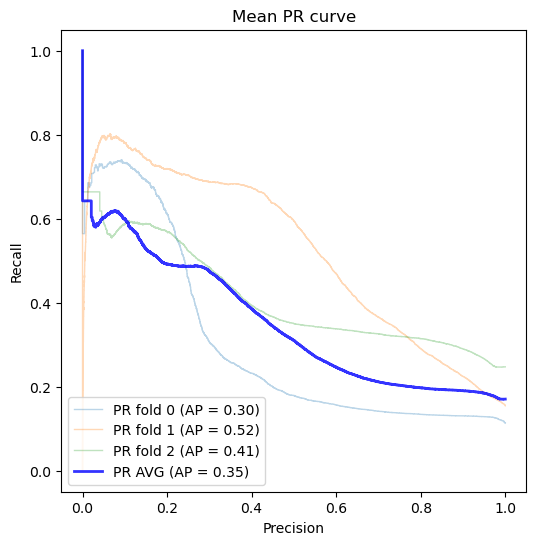

EQ-hist
(192528, 350)
width: 5


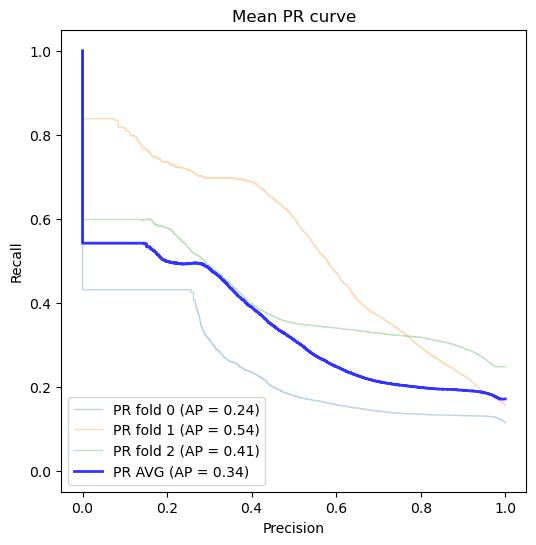

EQ-hist
(191016, 770)
width: 11


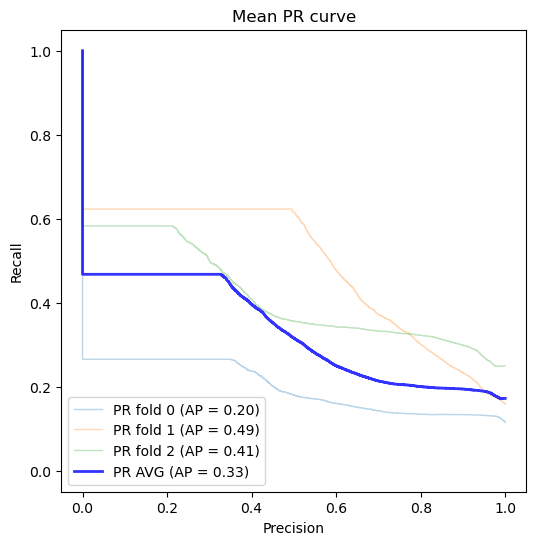

EQ-hist
(183456, 2870)
width: 41


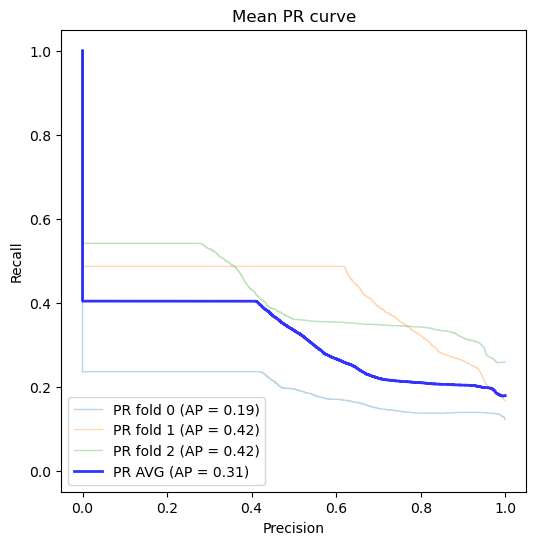

EQ-hist
(173376, 5670)
width: 81


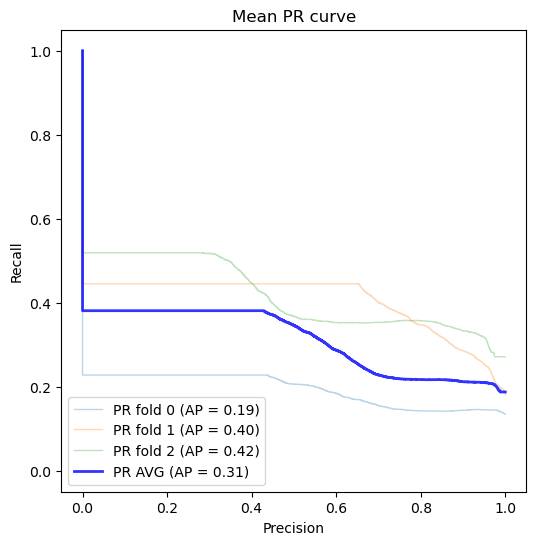

EQ-hist
(163296, 8470)
width: 121


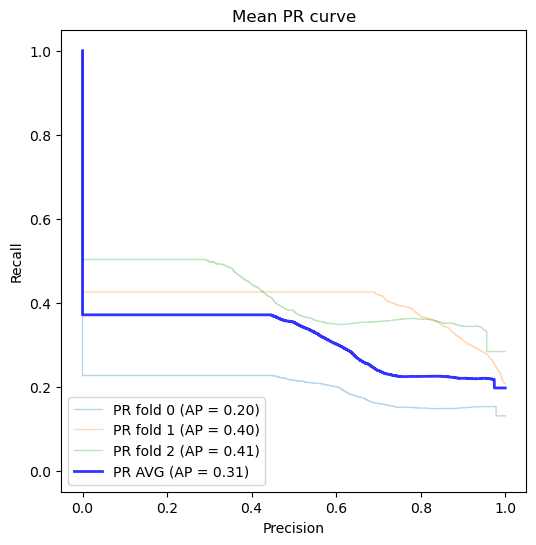

EQ-hist
(38808, 70)
width: 1


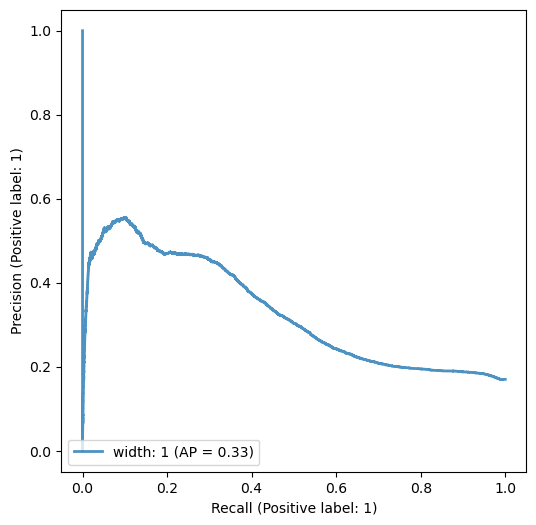

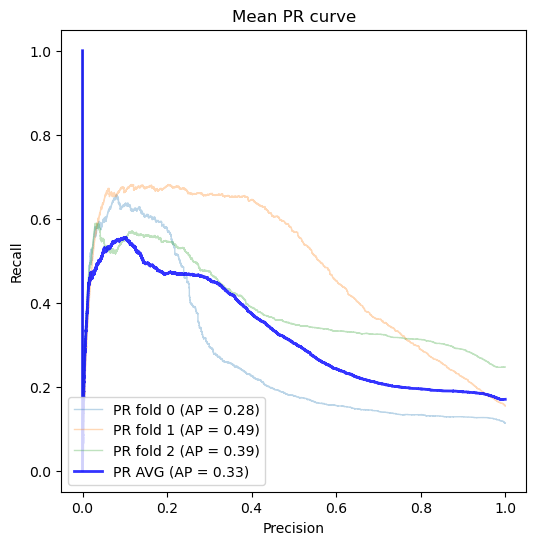

EQ-hist
(38808, 210)
width: 3


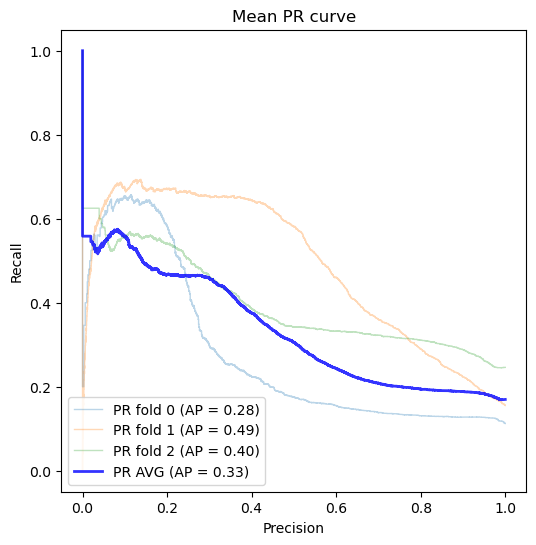

EQ-hist
(38556, 350)
width: 5


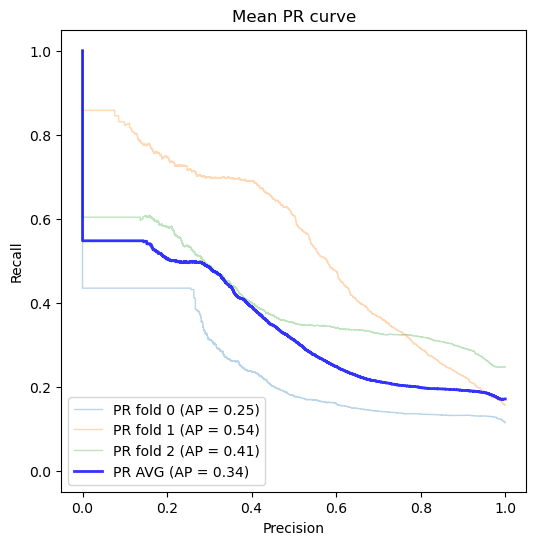

EQ-hist
(38304, 770)
width: 11


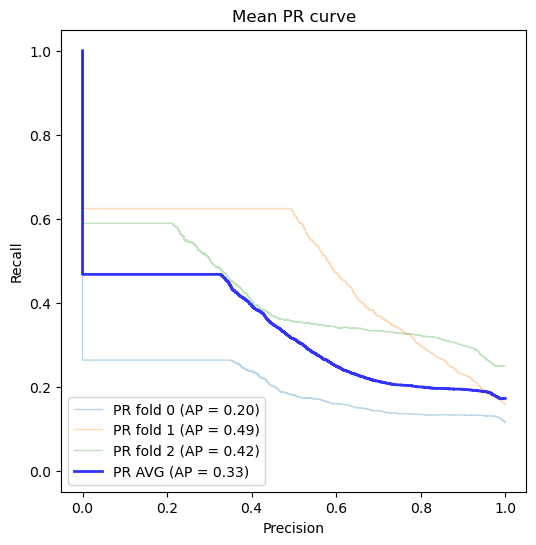

EQ-hist
(36792, 2870)
width: 41


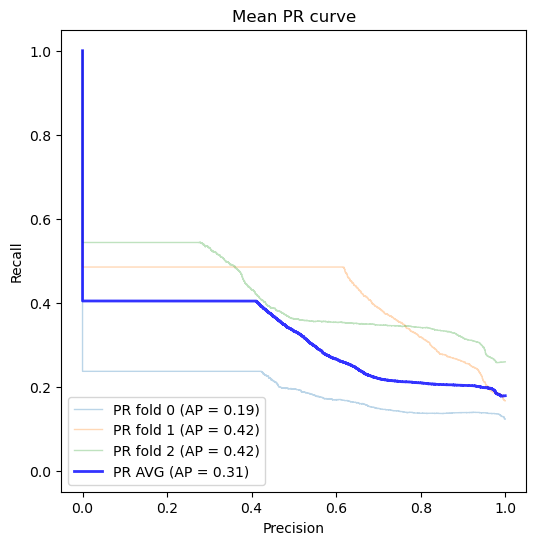

EQ-hist
(34776, 5670)
width: 81


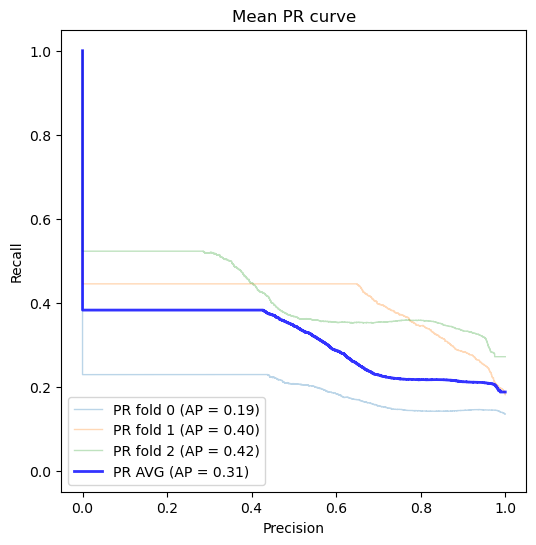

EQ-hist
(32760, 8470)
width: 121


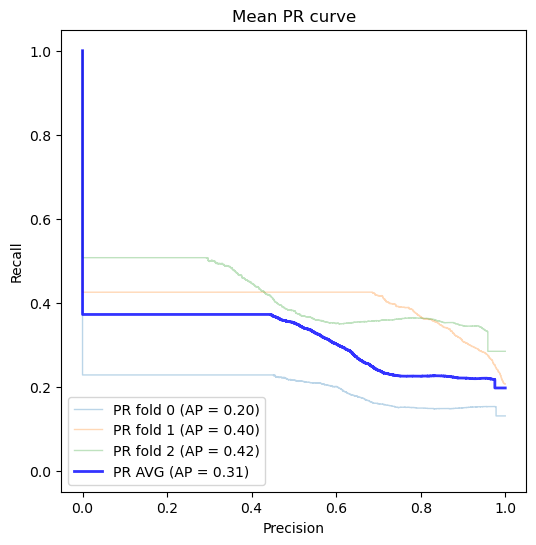

EQ-hist
(13104, 70)
width: 1


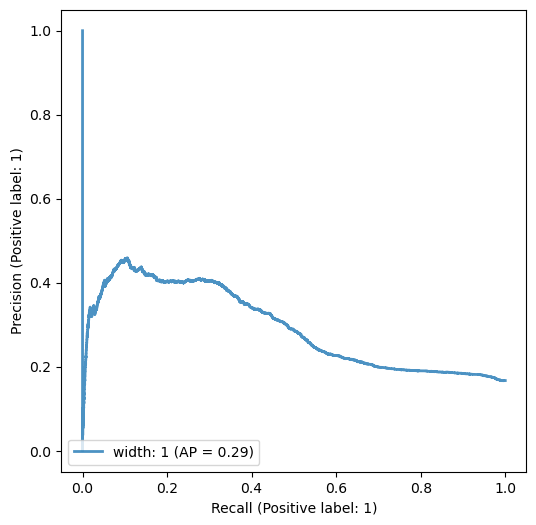

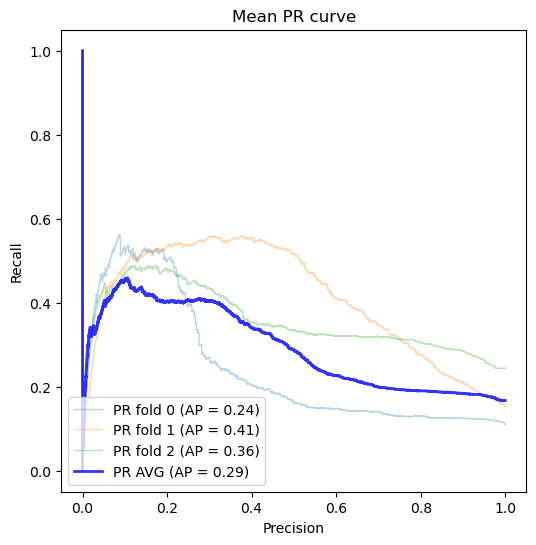

EQ-hist
(13104, 210)
width: 3


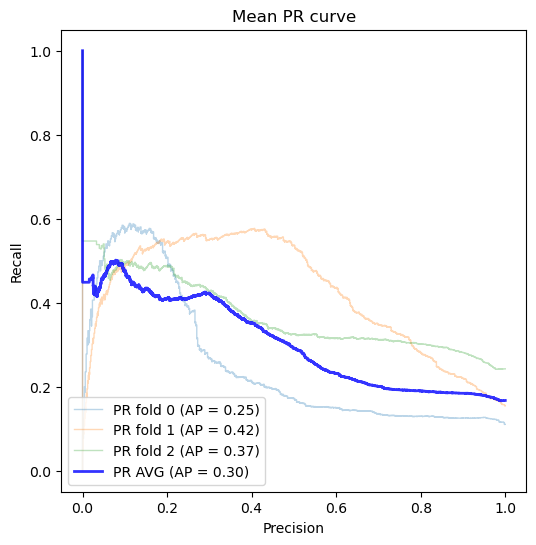

EQ-hist
(12852, 350)
width: 5


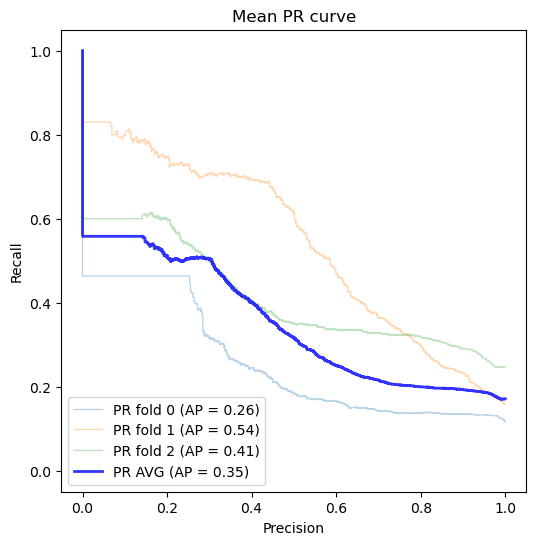

EQ-hist
(12852, 770)
width: 11


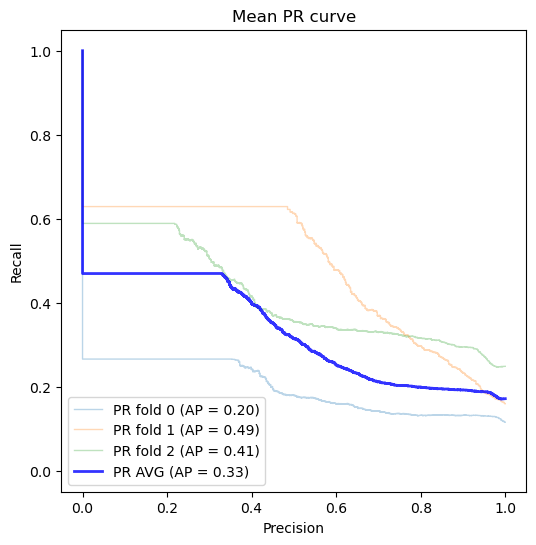

EQ-hist
(12348, 2870)
width: 41


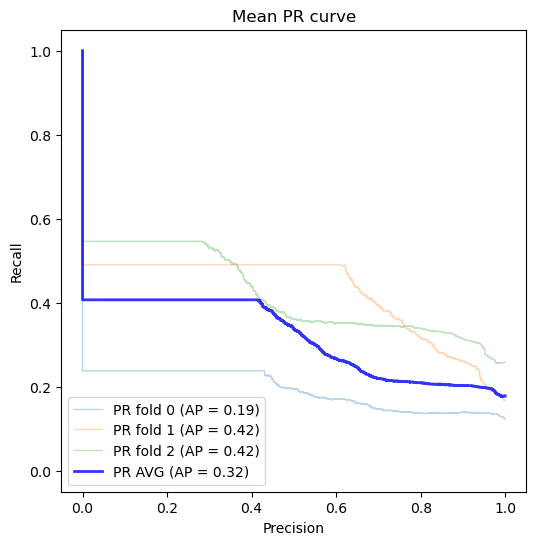

EQ-hist
(11592, 5670)
width: 81


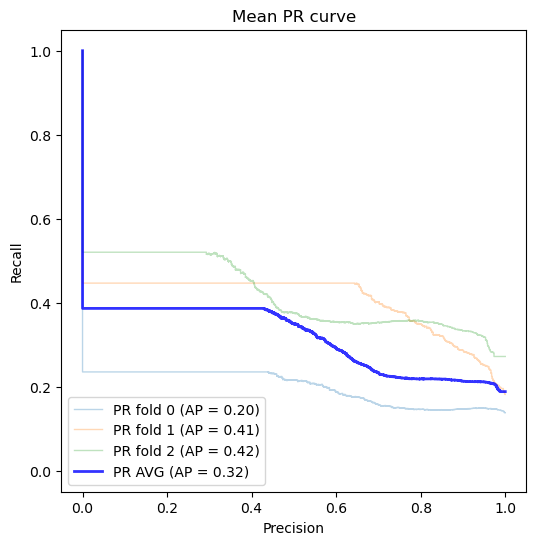

EQ-hist
(11088, 8470)
width: 121


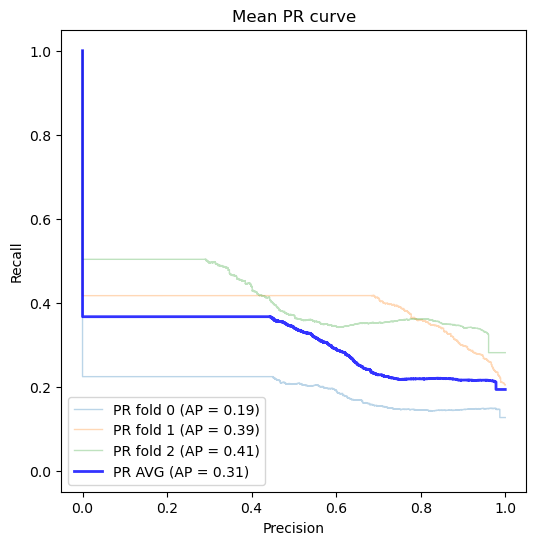

EQ-hist
(5040, 70)
width: 1


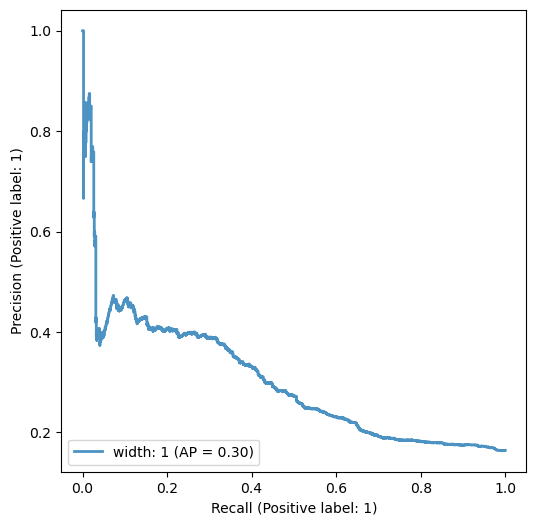

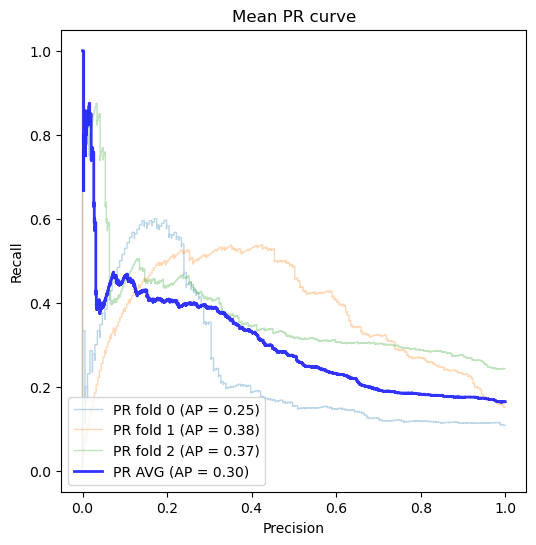

EQ-hist
(5040, 210)
width: 3


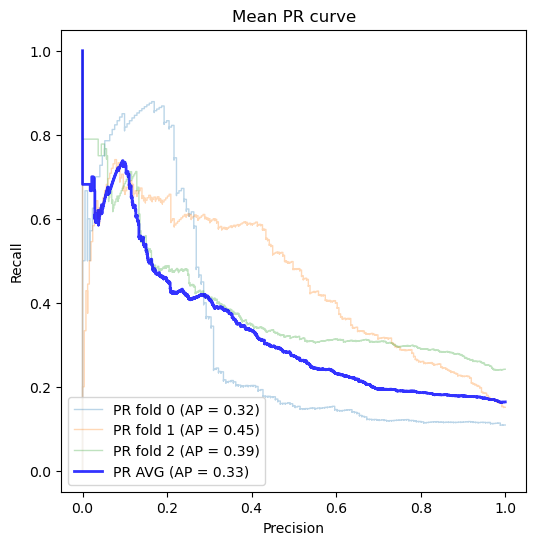

EQ-hist
(5040, 350)
width: 5


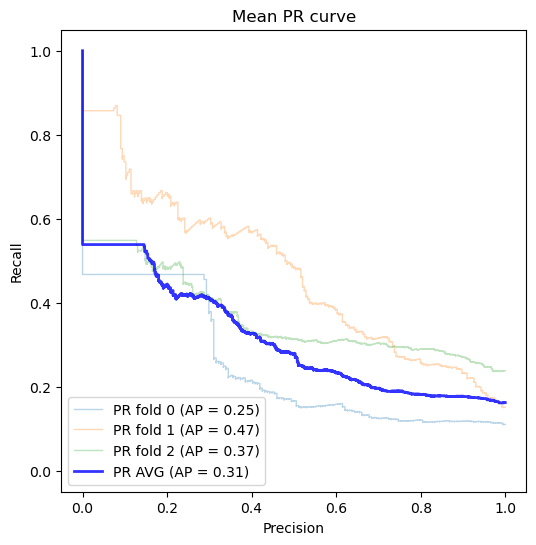

EQ-hist
(4788, 770)
width: 11


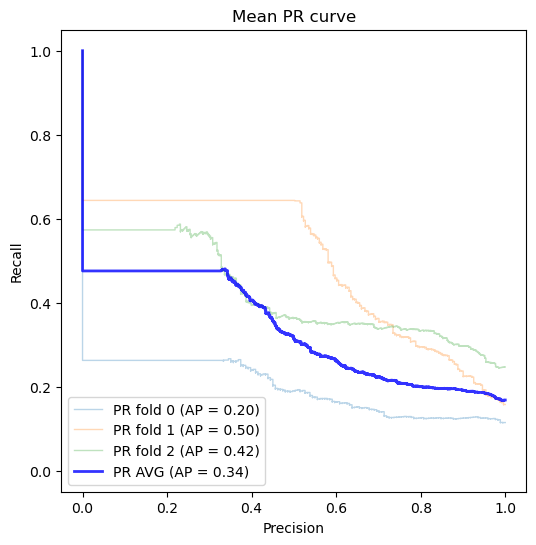

EQ-hist
(4788, 2870)
width: 41


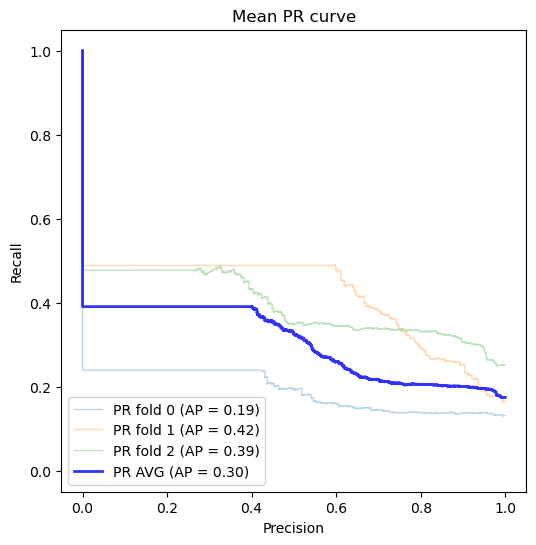

EQ-hist
(4536, 5670)
width: 81


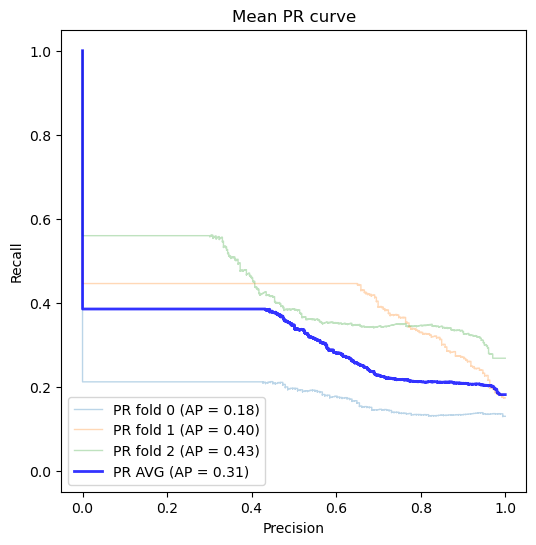

EQ-hist
(4284, 8470)
width: 121


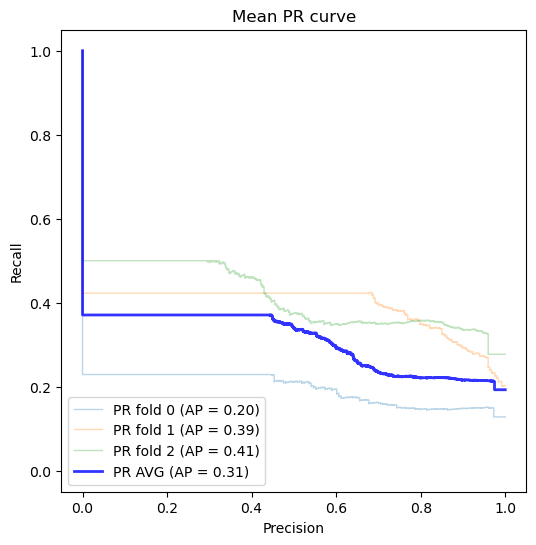

EQ-hist
(2520, 70)
width: 1


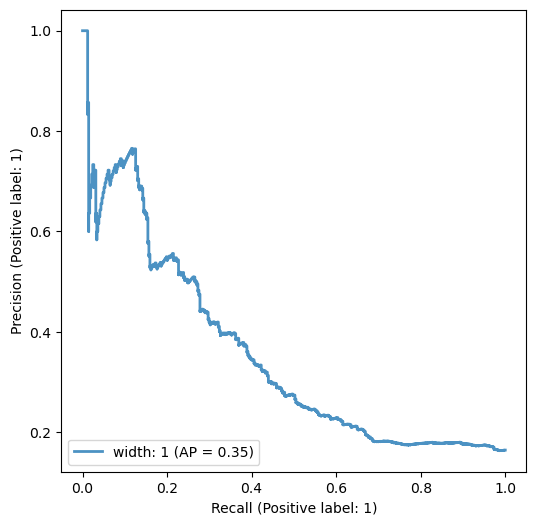

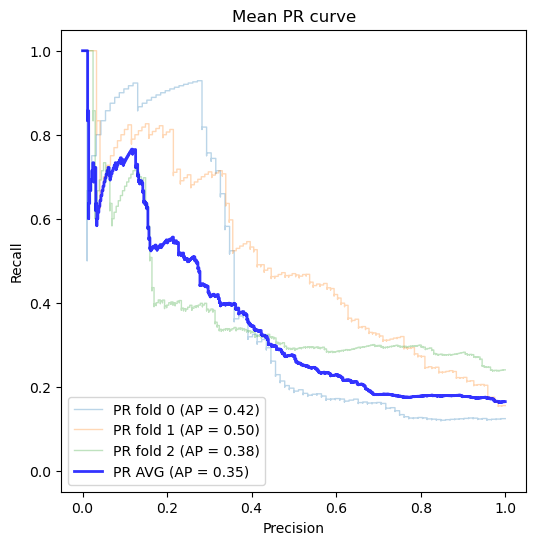

EQ-hist
(2520, 210)
width: 3


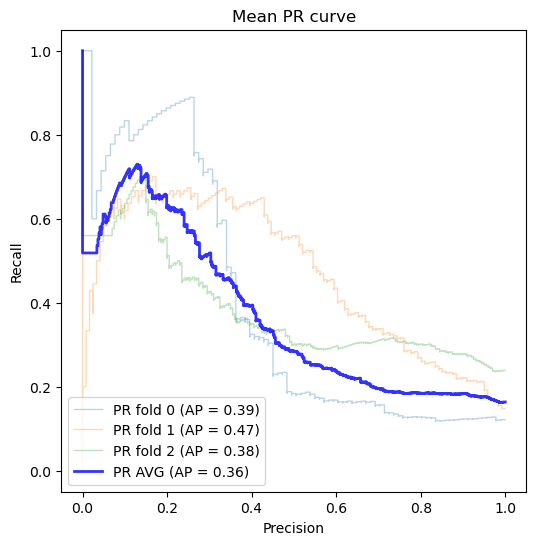

EQ-hist
(2520, 350)
width: 5


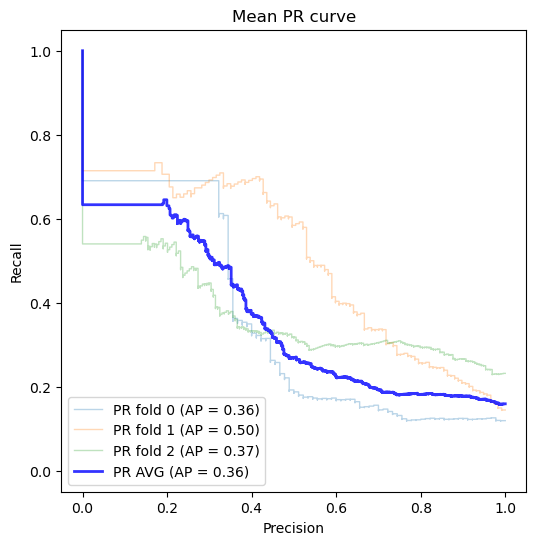

EQ-hist
(2520, 770)
width: 11


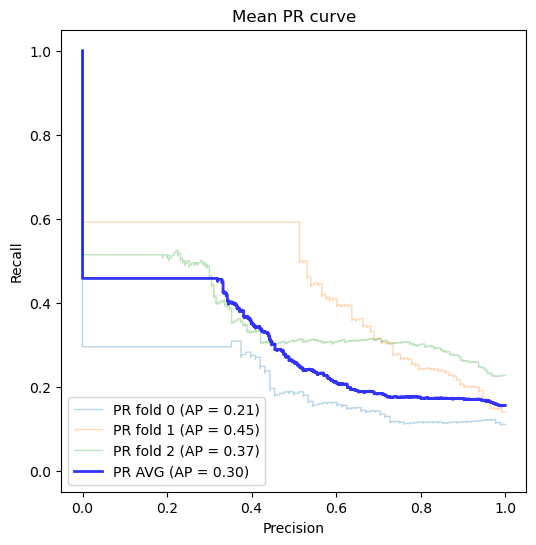

EQ-hist
(2520, 2870)
width: 41


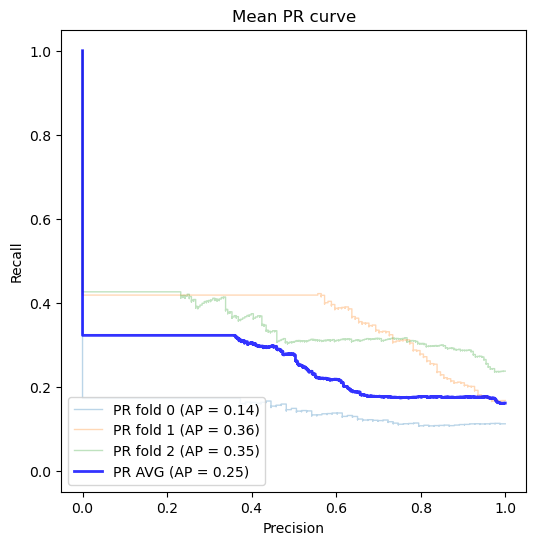

EQ-hist
(2268, 5670)
width: 81


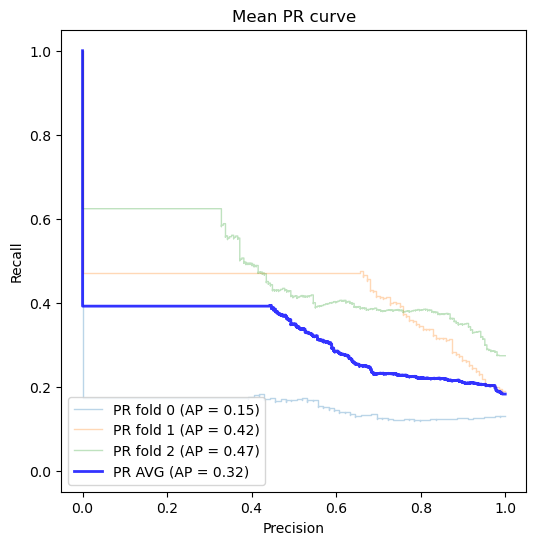

EQ-hist
(2268, 8470)
width: 121


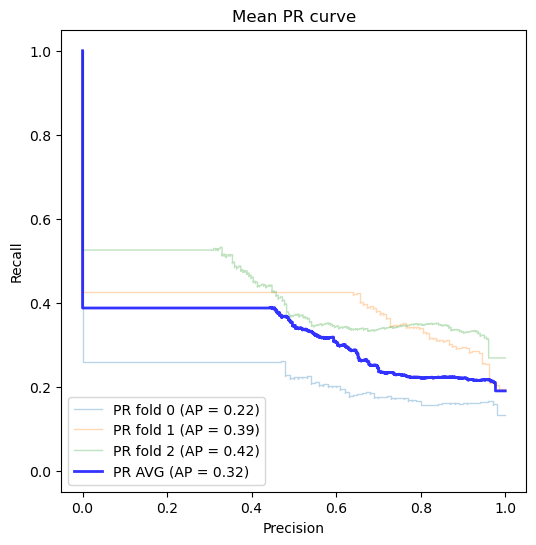

In [51]:
# widths = [1,5,10,20,50,100,150]
widths = [1,3,5,11,41,81,121]
#widths = [101,111,121,131,141,151,161]
# stride = 1
strides = [1,5,15,40,80]
mode = 'raw'
figs = []

kf = KFold(n_splits=3, shuffle=False)
param = {
        'var_smoothing': 1,
    }
for s in strides:
    fig2, ax2 = plt.subplots(figsize=(6, 6))
    for w in widths:
        X,y = getBalancedXYDataContext(width = w,stride = s,mode =mode)
        print(X.shape)
        print(f'width: {w}')
        scores = score_model_PR(GaussianNB,X,y, params = param, cv=kf,plotMatrix = False,plotROC = True,setTreshold = False,ax2 = ax2,modelname = 'NB',label = f'width: {w}')
        #scores = score_model_ROC(model,X,y,params = param, cv=kf,plotMatrix = False, plotROC = True,ax2 = ax2,modelname = name)
    ax2.legend(loc="upper right")
    ax2.set_title(f"NB PR curve with data type: {mode}, stride: {s}")
    ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
    figs.append(fig2)

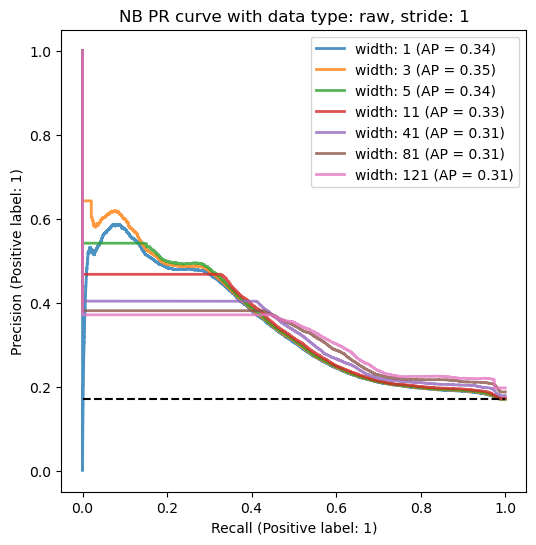

In [52]:
figs[0]

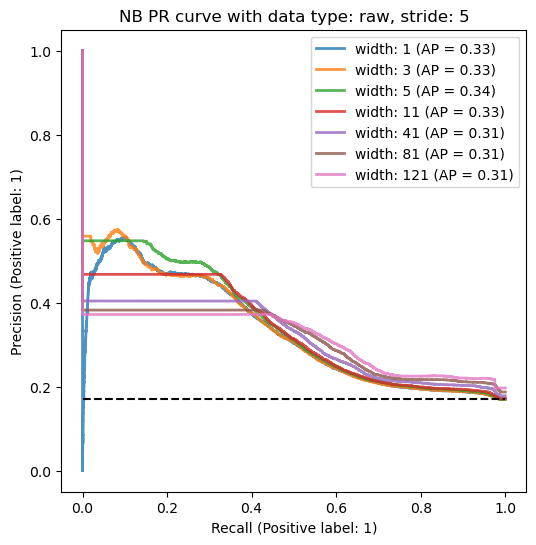

In [56]:
figs[1]

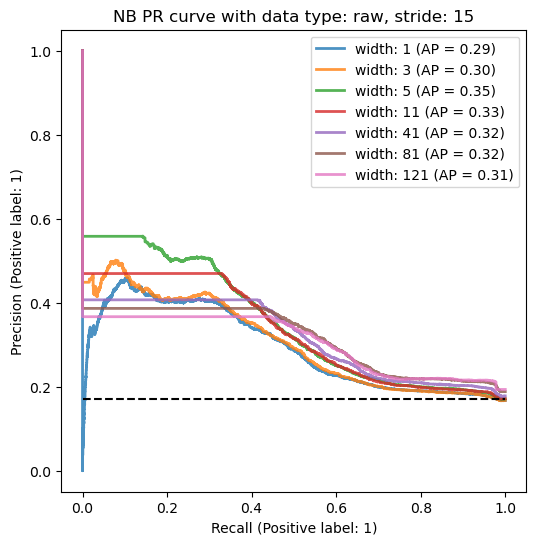

In [57]:
figs[2]

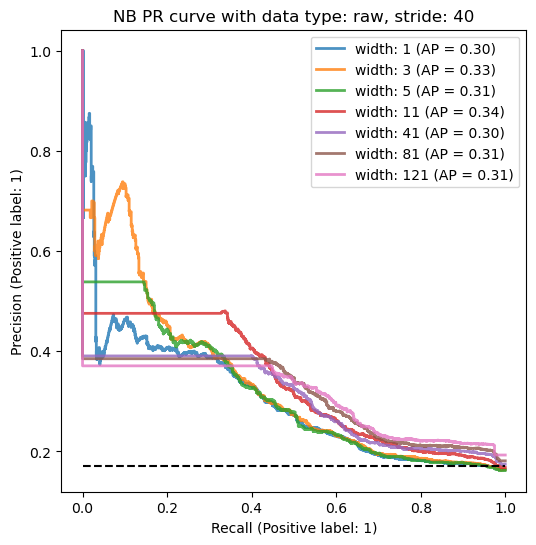

In [58]:
figs[3]

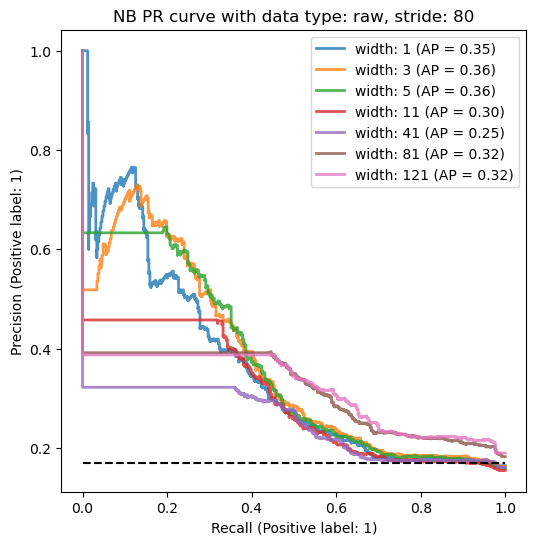

In [59]:
figs[4]
